# Downloading the data

In [1]:
!pip install aiohttp asyncio nest_asyncio numpy pandas requests



     |████████████████████████████████| 7.3 MB 1.2 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 101 kB 142 kB/s ta 0:00:01
     |████████████████████████████████| 10.9 MB 9.1 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 5.3 MB 32.1 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
  ERROR: Command errored out with exit status 1:
   command: /Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/bin/python3.9 /Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/pip/_vendor/pep517/_in_process.py get_requires_for_build_wheel /var/folders/mm/dmh1xdk14h12vgxvjxghl6fh0000gp/T/tmpds__lp6n
       cwd

In [4]:
!pip install antlr4-python3-runtime==4.9.2


     |████████████████████████████████| 117 kB 1.0 MB/s eta 0:00:01
Using legacy 'setup.py install' for antlr4-python3-runtime, since package 'wheel' is not installed.
  Attempting uninstall: antlr4-python3-runtime
    Found existing installation: antlr4-python3-runtime 4.12.0
    Uninstalling antlr4-python3-runtime-4.12.0:
      Successfully uninstalled antlr4-python3-runtime-4.12.0
    Running setup.py install for antlr4-python3-runtime ... done
You should consider upgrading via the '/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/bin/python3.9 -m pip install --upgrade pip' command.


In [3]:
import asyncio
import aiohttp
import json
import nest_asyncio

nest_asyncio.apply()

url = "https://samate.nist.gov/SARD/api/test-cases/search?page={}&limit=100"
output_file = "results.json"

async def fetch_page(session, page_number):
    async with session.get(url.format(page_number)) as response:
        data = await response.json()
        return data

async def main():
    async with aiohttp.ClientSession() as session:
        response = await fetch_page(session, 1)
        total_pages = response['pageCount']

        with open(output_file, 'w') as f:
            json.dump(response, f)
            f.write('\n')

            tasks = [fetch_page(session, page) for page in range(2, total_pages + 1)]
            fetched_pages = await asyncio.gather(*tasks)

            for page in fetched_pages:
                json.dump(page, f)
                f.write('\n')

        print(f"Retrieved {total_pages} results and saved them to {output_file}")

if __name__ == "__main__":
    asyncio.run(main())


Retrieved 870 results and saved them to results.json


In [ ]:
! pip install pandas

In [4]:
import requests
import json

url = "https://samate.nist.gov/SARD/api/test-cases/search?page={}&limit=100"
output_file = "results2.json"

def fetch_page(page_number):
    response = requests.get(url.format(page_number))
    data = response.json()
    return data

def main():
    response = fetch_page(1)
    total_pages = response['pageCount']

    with open(output_file, 'w') as f:
        json.dump(response, f)
        f.write('\n')

        for page_number in range(2, total_pages + 1):
            data = fetch_page(page_number)
            json.dump(data, f)
            f.write('\n')

    print(f"Retrieved {total_pages} results and saved them to {output_file}")

if __name__ == "__main__":
    main()


KeyboardInterrupt: 

In [5]:
import pandas as pd
import json

input_file = "results.json"

# Load the JSON data line by line
test_cases = []
with open(input_file) as f:
    for line in f:
        test_cases.append(json.loads(line.strip()))

# Load the test cases into a DataFrame
df = pd.DataFrame(test_cases)


In [6]:
df.head()

,creationDate,testCases,page,total,limit,count,pageCount
0,2023-04-15T15:52:06.492518+00:00,[{'download': 'https://samate.nist.gov/SARD/do...,1,87000,100,100,870
1,2023-04-15T15:52:07.36735+00:00,[{'download': 'https://samate.nist.gov/SARD/do...,2,87000,100,100,870
2,2023-04-15T15:52:13.94219+00:00,[{'download': 'https://samate.nist.gov/SARD/do...,3,87000,100,100,870
3,2023-04-15T15:52:07.901233+00:00,[{'download': 'https://samate.nist.gov/SARD/do...,4,87000,100,100,870
4,2023-04-15T15:52:12.152569+00:00,[{'download': 'https://samate.nist.gov/SARD/do...,5,87000,100,100,870


In [7]:
df_testCases = df['testCases']
df_testCases


0      [{'download': 'https://samate.nist.gov/SARD/do...
1      [{'download': 'https://samate.nist.gov/SARD/do...
2      [{'download': 'https://samate.nist.gov/SARD/do...
3      [{'download': 'https://samate.nist.gov/SARD/do...
4      [{'download': 'https://samate.nist.gov/SARD/do...
                             ...                        
865    [{'download': 'https://samate.nist.gov/SARD/do...
866    [{'download': 'https://samate.nist.gov/SARD/do...
867    [{'download': 'https://samate.nist.gov/SARD/do...
868    [{'download': 'https://samate.nist.gov/SARD/do...
869    [{'download': 'https://samate.nist.gov/SARD/do...
Name: testCases, Length: 870, dtype: object

In [8]:
# Use list comprehension and pd.concat to split the arrays of dictionaries into individual rows
expanded_df = pd.concat([pd.DataFrame(df_testCases.iloc[i]) for i in range(len(df_testCases))], ignore_index=True)

# Display the expanded DataFrame
expanded_df.head()

,download,link,identifier,sarif
0,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/248681...,248681-v2.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...
1,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/248604...,248604-v2.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...
2,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/248647...,248647-v2.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...
3,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/248554...,248554-v2.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...
4,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/248686...,248686-v2.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...


In [ ]:
result = expanded_df['sarif'].iloc[0]
json_string = json.dumps(result, indent=2)
print(json_string[:])


In [ ]:
expanded_df['sarif'].iloc[0]['runs']

In [ ]:
expanded_df['sarif'].iloc[0]['runs']

In [ ]:
#get ID, language, description, operating system, submission Date, author, state, type
expanded_df['sarif'].iloc[0]['runs'][0]['properties']

In [ ]:
#get taxa > name, id, version , downloadURi,
expanded_df['sarif'].iloc[5000]['runs'][0]['taxonomies']

In [ ]:
#ruleId, message > text,locations[0] > physical location > region > startLine, locations[0] > physical location > artifactLocation > uri
expanded_df['sarif'].iloc[0]['runs'][0]['results']

In [ ]:
results = expanded_df['sarif'].apply(lambda x: x['runs'][0]['results']).explode().reset_index(drop=True)
hashable_results = results.apply(lambda x: tuple(x.items()) if isinstance(x, dict) else x)
hashable_results.to_csv('data.csv')

In [ ]:
unique_values = pd.unique(hashable_results)

sample_size = 3
sample_unique_values = np.random.choice(unique_values, size=sample_size, replace=False)
sample_unique_values

In [ ]:
#ruleId, message > text,locations[0] > physical location > region > startLine, locations[0] > physical location > artifactLocation > uri
expanded_df['sarif'].iloc[0]['runs'][0]['tool']

In [ ]:
#get lengths, locations > uri, sourceLanguage
expanded_df['sarif'].iloc[0]['runs'][0]['artifacts']

In [ ]:
#get taxa > name, id, version , downloadURi,
expanded_df['sarif'].iloc[0]['runs'][0]['taxonomies']

In [ ]:
expanded_df['taxonomies'].iloc[0]

In [ ]:
lengths = expanded_df['taxonomies'].apply(lambda x: len(x))
lengths.value_counts()

In [ ]:
import numpy as np
import pandas as pd

# Assuming new_expanded_df is your DataFrame
arr = new_expanded_df['results'].apply(lambda x: tuple(x.items()) if isinstance(x, dict) else x).values

# Find unique taxonomies
unique_taxonomies = pd.unique(arr)
print("Unique taxonomies:")
print(unique_taxonomies)

# Select a random sample of unique taxonomies
sample_size = 3
sample_taxonomies = np.random.choice(unique_taxonomies, size=sample_size, replace=False)
print("Sample taxonomies:")
print(sample_taxonomies)


In [ ]:
import pandas as pd

# Assuming new_expanded_df is your DataFrame
non_dict_values = new_expanded_df['taxonomies'].apply(lambda x: x if not isinstance(x, dict) else None)
non_dict_values = non_dict_values.dropna()

if not non_dict_values.empty:
    print("Non-dictionary values found in the 'taxonomies' column:")
    print(non_dict_values)
else:
    print("All values in the 'taxonomies' column are dictionaries.")


In [ ]:
new_expanded_df['taxonomies'].values

In [9]:
def process_sarif(sarif):
    runs = sarif['runs']
    result = []

    for run in runs:
        if 'taxonomies' in run:
            for taxonomy in run['taxonomies']:
                if 'taxa' in taxonomy:
                    for taxa in taxonomy['taxa']:
                        id = taxa.get('id', None)
                        name = taxa.get('name', None)
                        downloadUri = taxonomy.get('downloadUri', None)
                        result.append({'id': id, 'name': name, 'downloadUri': downloadUri})

    return result

# Apply the process_sarif function to the 'sarif' column
expanded_df['taxonomies'] = expanded_df['sarif'].apply(process_sarif)

# Create a new dataframe by exploding the 'taxonomies' column
new_expanded_df = expanded_df.explode('taxonomies')

# Split the 'taxonomies' column into separate columns for 'id', 'name', and 'downloadUri'
new_expanded_df[['id', 'name', 'downloadUri']] = pd.DataFrame(new_expanded_df['taxonomies'].tolist(), index=new_expanded_df.index)

# Drop the 'taxonomies' column
new_expanded_df = new_expanded_df.drop(columns=['taxonomies'])

# Display the new dataframe
print(new_expanded_df)


AttributeError: 'float' object has no attribute 'keys'

In [33]:
combined_df['dict_string'] = combined_df['sarif'].apply(ast.literal_eval)

In [34]:
combined_df

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,uri,...,operating_system,submission_date,author,state,type,source_code,tokens_list,ASTFlat,artifacts,dict_string
0,795707,795707,795707,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,src/main/java/testcasesupport/AbstractTestCase...,...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,[],{'runs': [{'tool': {'driver': {'name': 'SARD -...
1,795708,795708,795708,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,src/main/java/testcasesupport/AbstractTestCase...,...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,[],{'runs': [{'tool': {'driver': {'name': 'SARD -...
2,795709,795709,795709,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,...,NaN,2011-04-08,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n* */\n...,['/*\n* @description Helper IO class\n* \n* */...,{'CompilationUnitContext': ['packagetestcasesu...,[],{'runs': [{'tool': {'driver': {'name': 'SARD -...
3,795710,795710,795710,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,[],{'runs': [{'tool': {'driver': {'name': 'SARD -...
4,795711,795711,795711,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,[],{'runs': [{'tool': {'driver': {'name': 'SARD -...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1060935,265230,265230,265230,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/126552...,126552-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",6044,src/main/java/testcases/CWE129_Improper_Valida...,...,NaN,2013-05-21,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n*\n* *...,['/*\n* @description Helper IO class\n* \n*\n*...,{'CompilationUnitContext': ['packagetestcasesu...,[],{'runs': [{'tool': {'driver': {'name': 'SARD -...
1060936,265231,265231,265231,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/126552...,126552-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",6044,src/main/java/testcases/CWE129_Improper_Valida...,...,NaN,2013-05-21,NaN,mixed,source code,/*\n@description This abstract class is the ba...,['/*\n@description This abstract class is the ...,{'CompilationUnitContext': ['packagetestcasesu...,[],{'runs': [{'tool

In [31]:
import ast

In [35]:
import pandas as pd

def process_artifacts(sarif):
    runs = sarif['runs']
    result = []

    for run in runs:
        if 'artifacts' in run:
            for artifact in run['artifacts']:
                length = artifact.get('length', None)
                uri = artifact['location'].get('uri', None) if 'location' in artifact else None
                sourceLanguage = artifact.get('sourceLanguage', None)
                result.append({'length': length, 'uri': uri, 'sourceLanguage': sourceLanguage})

    return result

# Apply the process_artifacts function to the 'sarif' column
combined_df['artifacts'] = combined_df['dict_string'].apply(process_artifacts)

# Create a new dataframe by exploding the 'artifacts' column
new_artifacts_df = combined_df.explode('artifacts')

# Split the 'artifacts' column into separate columns for 'length', 'uri', and 'sourceLanguage'
new_artifacts_df[['length', 'uri', 'sourceLanguage']] = pd.DataFrame(new_artifacts_df['artifacts'].tolist(), index=new_artifacts_df.index)

# Drop the 'artifacts' column
new_artifacts_df = new_artifacts_df.drop(columns=['artifacts'])

# Display the new dataframe
print(new_artifacts_df)


         Unnamed: 0.2  Unnamed: 0.1  Unnamed: 0   
0              795707        795707      795707  \
0              795707        795707      795707   
0              795707        795707      795707   
1              795708        795708      795708   
1              795708        795708      795708   
...               ...           ...         ...   
1060939        265234        265234      265234   
1060939        265234        265234      265234   
1060939        265234        265234      265234   
1060939        265234        265234      265234   
1060939        265234        265234      265234   

                                                  download   
0        https://samate.nist.gov/SARD/downloads/version...  \
0        https://samate.nist.gov/SARD/downloads/version...   
0        https://samate.nist.gov/SARD/downloads/version...   
1        https://samate.nist.gov/SARD/downloads/version...   
1        https://samate.nist.gov/SARD/downloads/version...   
...            

In [42]:
import pandas as pd

def process_results(sarif):
    runs = sarif['runs']
    result = []
    ruleId= ""
    startLine = ""
    uri = ""
    text = ""
    for run in runs:
        if 'results' in run:
            for res in run['results']:
                ruleId = res.get('ruleId', None)
                text = res['message'].get('text', None) if 'message' in res else None
                if 'locations' in res and len(res['locations']) == 1:
                    location = res['locations'][0]
                    if 'physicalLocation' in location:
                        physical_location = location['physicalLocation']
                        startLine = physical_location['region'].get('startLine', None) if 'region' in physical_location else None
                        uri = physical_location['artifactLocation'].get('uri', None) if 'artifactLocation' in physical_location else None
                        result.append({'ruleId': str(ruleId), 'text': str(text), 'startLine': str(startLine), 'uri': str(uri)})
                if (ruleId is None or text is None or startLine is None or uri is None):
                    result.append({'ruleId': "", 'text': "", 'startLine': "", 'uri': ""})
                

    return result

# Apply the process_results function to the 'sarif' column
new_artifacts_df['results'] = new_artifacts_df['dict_string'].apply(process_results)

# Create a new dataframe by exploding the 'results' column
new_results_df = new_artifacts_df.explode('results')

# Split the 'results' column into separate columns for 'ruleId', 'text', 'startLine', and 'uri'
new_results_df[['ruleId', 'text', 'startLine', 'uri']] = pd.DataFrame(new_results_df['results'].tolist(), index=new_results_df.index)

# Drop the 'results' column
new_results_df = new_results_df.drop(columns=['results'])

# Display the new dataframe
print(new_results_df)


AttributeError: 'float' object has no attribute 'keys'

'CWE-470'

In [ ]:
import pandas as pd

def process_results(sarif):
    runs = sarif['runs']
    result = []

    for run in runs:
        if 'results' in run:
            for res in run['results']:
                ruleId = res.get('ruleId', None)
                text = res['message'].get('text', None) if 'message' in res else None
                if 'locations' in res and len(res['locations']) == 1:
                    location = res['locations'][0]
                    if 'physicalLocation' in location:
                        physical_location = location['physicalLocation']
                        startLine = physical_location['region'].get('startLine', None) if 'region' in physical_location else None
                        uri = physical_location['artifactLocation'].get('uri', None) if 'artifactLocation' in physical_location else None
                        result.append({'ruleId': ruleId, 'text': text, 'startLine': startLine, 'uri': uri})

    return result

# Apply the process_results function to the 'sarif' column
new_artifacts_df['results'] = new_artifacts_df['dict_string'].apply(process_results)

# Create a new dataframe by exploding the 'results' column
new_results_df = new_artifacts_df.explode('results')

# Split the 'results' column into separate columns for 'ruleId', 'text', 'startLine', and 'uri'
new_results_df[['ruleId', 'text', 'startLine', 'uri']] = pd.DataFrame(new_results_df['results'].tolist(), index=new_results_df.index)

# Drop the 'results' column
new_results_df = new_results_df.drop(columns=['results'])

# Display the new dataframe
print(new_results_df)


In [50]:
import pandas as pd

def process_properties(sarif):
    runs = sarif['runs']
    result = []

    for run in runs:
        properties = run['properties']

        # Extract the additional fields from the properties dictionary
        ID = properties.get('id', None)
        language = properties.get('language', None)
        description = properties.get('description', None)
        operating_system = properties.get('operatingSystem', None)
        submission_date = properties.get('submissionDate', None)
        author = properties.get('author', None)
        state = properties.get('state', None)
        type_ = properties.get('type', None)

        result.append({
            'ID': ID,
            'language': language,
            'description': description,
            'operating_system': operating_system,
            'submission_date': submission_date,
            'author': author,
            'state': state,
            'type': type_
        })

    return result

# Apply the process_properties function to the 'sarif' column
new_results_df['properties'] = new_results_df['dict_string'].apply(process_properties)

# Create a new dataframe by exploding the 'properties' column
new_properties_df = new_results_df.explode('properties')

# Split the 'properties' column into separate columns for the extracted fields
new_properties_df[['ID', 'language', 'description', 'operating_system', 'submission_date', 'author', 'state', 'type']] = pd.DataFrame(new_properties_df['properties'].tolist(), index=new_properties_df.index)

# Drop the 'properties' column
new_properties_df = new_properties_df.drop(columns=['properties'])

# Display the new dataframe
new_properties_df


,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,uri,...,description,operating_system,submission_date,author,state,type,source_code,tokens_list,ASTFlat,dict_string
0,795707,795707,795707,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",15790,src/main/java/testcases/CWE470_Unsafe_Reflecti...,...,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,None,2011-04-08,None,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
0,795707,795707,795707,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,src/main/java/testcasesupport/AbstractTestCase...,...,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,None,2011-04-08,None,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
0,795707,795707,795707,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,...,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,None,2011-04-08,None,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
1,795708,795708,795708,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",15790,src/main/java/testcases/CWE470_Unsafe_Reflecti...,...,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,None,2011-04-08,None,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
1,795708,795708,795708,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,src/main/java/testcasesupport/AbstractTestCase...,...,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,None,2011-04-08,None,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1060939,265234,265234,265234,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/126552...,126552-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",1717,src/main/java/testcases/CWE129_Improper_Valida...,...,CWE: 129 Improper Validation of Array Index\n ...,None,2013-05-21,None,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
1060939,265234,265234,265234,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/126552...,126552-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SAR

In [15]:
parsed_dataset = new_properties_df[new_properties_df['language'] == 'java']

In [16]:
parsed_dataset

,download,link,identifier,sarif,taxonomies,length,uri,sourceLanguage,results,ID,language,description,operating_system,submission_date,author,state,type
7906,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16948,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code
7906,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",1940,src/main/java/testcasesupport/AbstractTestCase...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code
7906,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",1069,src/main/java/testcasesupport/AbstractTestCase...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code
7906,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",3445,src/main/java/testcasesupport/IO.java,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code
7911,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129976...,129976-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16777,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129976,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86075,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1738/v...,1738-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '259', 'name': 'Use of Hard-coded Pass...",1081,src/main/java/HardcodedPassword.java,java,"{'ruleId': 'CWE-259', 'text': 'Use of Hard-cod...",1738,java,Test determines if a tool can identify a hardc...,None,2006-08-18,None,bad,source code
86085,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1584/v...,1584-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '401', 'name': 'Missing Release of Mem...",2012,src/main/java/Mem1_ok.java,java,NaN,1584,java,Memory resources are referenced indefinitely b...,None,2006-06-22,Fortify Software,good,source code
86175,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1553/v...,1553-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '417', 'name': 'Communication Channel ...",2299,src/main/java/File1_ok.java,java,NaN,1553,java,Tainted input allows arbitrary files to be rea...,None,2006-06-22,Fortify Software,good,source code
86931,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/71/ver...,71-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '484', 'name': 'Omitted Break Statemen...",391,src/main/java/Omitted_break_statement.java,java,"{'ruleId': 'CWE-484', 'text': 'Omitted Break S...",71,java,Omitting a break statement so that one may fal...,None,2005-11-07,SecureSoftware,bad,source code


In [17]:
parsed_dataset.to_csv('parse_data_try1.csv')

In [18]:
non_empty_taxonomies = parsed_dataset[parsed_dataset['taxonomies'].notna()]


In [19]:
non_empty_taxonomies.to_csv('SARD_Dataset.csv')

In [20]:
non_empty_taxonomies

,download,link,identifier,sarif,taxonomies,length,uri,sourceLanguage,results,ID,language,description,operating_system,submission_date,author,state,type
7906,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16948,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code
7906,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",1940,src/main/java/testcasesupport/AbstractTestCase...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code
7906,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",1069,src/main/java/testcasesupport/AbstractTestCase...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code
7906,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",3445,src/main/java/testcasesupport/IO.java,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code
7911,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129976...,129976-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16777,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129976,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86075,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1738/v...,1738-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '259', 'name': 'Use of Hard-coded Pass...",1081,src/main/java/HardcodedPassword.java,java,"{'ruleId': 'CWE-259', 'text': 'Use of Hard-cod...",1738,java,Test determines if a tool can identify a hardc...,None,2006-08-18,None,bad,source code
86085,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1584/v...,1584-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '401', 'name': 'Missing Release of Mem...",2012,src/main/java/Mem1_ok.java,java,NaN,1584,java,Memory resources are referenced indefinitely b...,None,2006-06-22,Fortify Software,good,source code
86175,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1553/v...,1553-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '417', 'name': 'Communication Channel ...",2299,src/main/java/File1_ok.java,java,NaN,1553,java,Tainted input allows arbitrary files to be rea...,None,2006-06-22,Fortify Software,good,source code
86931,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/71/ver...,71-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '484', 'name': 'Omitted Break Statemen...",391,src/main/java/Omitted_break_statement.java,java,"{'ruleId': 'CWE-484', 'text': 'Omitted Break S...",71,java,Omitting a break statement so that one may fal...,None,2005-11-07,SecureSoftware,bad,source code


In [22]:
import os
import requests
import zipfile

# Get unique download URLs
unique_download_urls = non_empty_taxonomies['download'].unique()

# Create a directory for zip files if it doesn't exist
download_directory = "downloaded_zip_files"
if not os.path.exists(download_directory):
    os.makedirs(download_directory)

# Download and extract zip files
for url in unique_download_urls:
    response = requests.get(url)
    zip_file_name = os.path.join(download_directory, os.path.basename(url))
    
    # Save the downloaded zip file
    with open(zip_file_name, 'wb') as zip_file:
        zip_file.write(response.content)
    


In [23]:
import os
import zipfile

root_directory = r"/Users/connor.neff/Desktop/Education/CSCE5290-NLPProject"
download_directory = os.path.join(root_directory, "downloaded_zip_files")
output_directory = os.path.join(root_directory, "java_source_code_files")

def unzip_files(download_directory, output_directory):
    # Check if output_directory exists, if not, create it
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    # Iterate through all the files in download_directory
    for filename in os.listdir(download_directory):
        # Check if the file is a zip file
        if filename.endswith(".zip"):
            # Construct the full path of the zip file
            zip_path = os.path.join(download_directory, filename)

            # Create a folder for the current zip file using its name (without the extension)
            current_output_directory = os.path.join(output_directory, os.path.splitext(filename)[0])
            if not os.path.exists(current_output_directory):
                os.makedirs(current_output_directory)

            # Open the zip file
            with zipfile.ZipFile(zip_path, 'r') as zip_ref:
                # Extract the contents of the zip file to the current_output_directory
                zip_ref.extractall(current_output_directory)

            print(f"Extracted {filename} to {current_output_directory}")

if __name__ == "__main__":
    unzip_files(download_directory, output_directory)


Extracted 55731-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55731-v1.0.0
Extracted 127390-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127390-v1.0.0
Extracted 59079-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59079-v1.0.0
Extracted 125055-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125055-v1.0.0
Extracted 50231-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50231-v1.0.0
Extracted 48283-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48283-v1.0.0
Extracted 52865-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52865-v1.0.0
Extracted 126493-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126493-v1.0.0
Extracted 

Extracted 59266-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59266-v1.0.0
Extracted 56879-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56879-v1.0.0
Extracted 129502-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129502-v1.0.0
Extracted 123693-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123693-v1.0.0
Extracted 124056-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124056-v1.0.0
Extracted 59779-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59779-v1.0.0
Extracted 53866-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53866-v1.0.0
Extracted 127490-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127490-v1.0.0
Extracte

Extracted 124308-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124308-v1.0.0
Extracted 50370-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50370-v1.0.0
Extracted 125114-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125114-v1.0.0
Extracted 58324-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58324-v1.0.0
Extracted 59138-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59138-v1.0.0
Extracted 55670-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55670-v1.0.0
Extracted 127053-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127053-v1.0.0
Extracted 49643-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49643-v1.0.0
Extracted 

Extracted 49248-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49248-v1.0.0
Extracted 48054-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48054-v1.0.0
Extracted 127458-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127458-v1.0.0
Extracted 125282-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125282-v1.0.0
Extracted 129944-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129944-v1.0.0
Extracted 61424-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61424-v1.0.0
Extracted 60638-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60638-v1.0.0
Extracted 55968-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55968-v1.0.0
Extracted 

Extracted 49309-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49309-v1.0.0
Extracted 126705-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126705-v1.0.0
Extracted 47784-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47784-v1.0.0
Extracted 60266-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60266-v1.0.0
Extracted 129194-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129194-v1.0.0
Extracted 50836-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50836-v1.0.0
Extracted 58691-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58691-v1.0.0
Extracted 52500-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52500-v1.0.0
Extracted 12

Extracted 126922-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126922-v1.0.0
Extracted 124376-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124376-v1.0.0
Extracted 51112-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51112-v1.0.0
Extracted 49831-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49831-v1.0.0
Extracted 59146-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59146-v1.0.0
Extracted 56924-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56924-v1.0.0
Extracted 55473-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55473-v1.0.0
Extracted 58127-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58127-v1.0.0
Extracted 48

Extracted 124537-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124537-v1.0.0
Extracted 60391-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60391-v1.0.0
Extracted 47732-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47732-v1.0.0
Extracted 50880-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50880-v1.0.0
Extracted 51612-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51612-v1.0.0
Extracted 127921-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127921-v1.0.0
Extracted 59646-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59646-v1.0.0
Extracted 54312-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54312-v1.0.0
Extracted 56

Extracted 53396-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53396-v1.0.0
Extracted 49970-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49970-v1.0.0
Extracted 54553-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54553-v1.0.0
Extracted 60491-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60491-v1.0.0
Extracted 56696-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56696-v1.0.0
Extracted 57804-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57804-v1.0.0
Extracted 129763-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129763-v1.0.0
Extracted 53689-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53689-v1.0.0
Extracted 5870

Extracted 58492-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58492-v1.0.0
Extracted 49377-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49377-v1.0.0
Extracted 52703-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52703-v1.0.0
Extracted 61004-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61004-v1.0.0
Extracted 57203-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57203-v1.0.0
Extracted 127550-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127550-v1.0.0
Extracted 52734-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52734-v1.0.0
Extracted 124807-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124807-v1.0.0
Extracted 57

Extracted 61704-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61704-v1.0.0
Extracted 59491-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59491-v1.0.0
Extracted 52992-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52992-v1.0.0
Extracted 56200-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56200-v1.0.0
Extracted 53737-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53737-v1.0.0
Extracted 60030-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60030-v1.0.0
Extracted 56237-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56237-v1.0.0
Extracted 124696-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124696-v1.0.0
Extracted 5203

Extracted 57431-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57431-v1.0.0
Extracted 125090-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125090-v1.0.0
Extracted 2129-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/2129-v1.0.0
Extracted 48759-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48759-v1.0.0
Extracted 49545-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49545-v1.0.0
Extracted 126149-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126149-v1.0.0
Extracted 60893-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60893-v1.0.0
Extracted 61601-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61601-v1.0.0
Extracted 5740

Extracted 49038-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49038-v1.0.0
Extracted 125790-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125790-v1.0.0
Extracted 124902-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124902-v1.0.0
Extracted 123349-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123349-v1.0.0
Extracted 57331-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57331-v1.0.0
Extracted 61136-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61136-v1.0.0
Extracted 48059-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48059-v1.0.0
Extracted 126649-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126649-v1.0.0
Extracte

Extracted 123979-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123979-v1.0.0
Extracted 129666-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129666-v1.0.0
Extracted 124332-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124332-v1.0.0
Extracted 59102-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59102-v1.0.0
Extracted 49875-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49875-v1.0.0
Extracted 128165-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128165-v1.0.0
Extracted 57090-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57090-v1.0.0
Extracted 51449-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51449-v1.0.0
Extracte

Extracted 51017-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51017-v1.0.0
Extracted 57840-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57840-v1.0.0
Extracted 129727-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129727-v1.0.0
Extracted 123838-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123838-v1.0.0
Extracted 125331-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125331-v1.0.0
Extracted 51349-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51349-v1.0.0
Extracted 50155-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50155-v1.0.0
Extracted 128665-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128665-v1.0.0
Extracte

Extracted 50095-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50095-v1.0.0
Extracted 127134-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127134-v1.0.0
Extracted 126328-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126328-v1.0.0
Extracted 54789-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54789-v1.0.0
Extracted 56631-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56631-v1.0.0
Extracted 128956-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128956-v1.0.0
Extracted 123455-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123455-v1.0.0
Extracted 48745-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48745-v1.0.0
Extracte

Extracted 125948-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125948-v1.0.0
Extracted 51930-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51930-v1.0.0
Extracted 47810-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47810-v1.0.0
Extracted 61360-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61360-v1.0.0
Extracted 59964-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59964-v1.0.0
Extracted 49013-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49013-v1.0.0
Extracted 52467-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52467-v1.0.0
Extracted 126891-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126891-v1.0.0
Extracted 51

Extracted 129430-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129430-v1.0.0
Extracted 125378-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125378-v1.0.0
Extracted 124164-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124164-v1.0.0
Extracted 58148-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58148-v1.0.0
Extracted 128451-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128451-v1.0.0
Extracted 60931-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60931-v1.0.0
Extracted 123952-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123952-v1.0.0
Extracted 50361-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50361-v1.0.0
Extrac

Extracted 52498-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52498-v1.0.0
Extracted 53684-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53684-v1.0.0
Extracted 54041-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54041-v1.0.0
Extracted 57198-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57198-v1.0.0
Extracted 124725-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124725-v1.0.0
Extracted 125539-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125539-v1.0.0
Extracted 51541-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51541-v1.0.0
Extracted 51400-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51400-v1.0.0
Extracted 12

Extracted 59215-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59215-v1.0.0
Extracted 53184-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53184-v1.0.0
Extracted 124025-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124025-v1.0.0
Extracted 51241-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51241-v1.0.0
Extracted 125239-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125239-v1.0.0
Extracted 129571-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129571-v1.0.0
Extracted 57698-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57698-v1.0.0
Extracted 55042-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55042-v1.0.0
Extracted 

Extracted 49964-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49964-v1.0.0
Extracted 54547-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54547-v1.0.0
Extracted 56682-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56682-v1.0.0
Extracted 129777-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129777-v1.0.0
Extracted 123868-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123868-v1.0.0
Extracted 61699-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61699-v1.0.0
Extracted 51047-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51047-v1.0.0
Extracted 124223-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124223-v1.0.0
Extracted 

Extracted 50044-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50044-v1.0.0
Extracted 128774-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128774-v1.0.0
Extracted 56813-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56813-v1.0.0
Extracted 57681-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57681-v1.0.0
Extracted 129568-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129568-v1.0.0
Extracted 54247-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54247-v1.0.0
Extracted 127874-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127874-v1.0.0
Extracted 53482-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53482-v1.0.0
Extracted 

Extracted 50198-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50198-v1.0.0
Extracted 127526-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127526-v1.0.0
Extracted 52742-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52742-v1.0.0
Extracted 49336-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49336-v1.0.0
Extracted 55187-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55187-v1.0.0
Extracted 57242-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57242-v1.0.0
Extracted 50487-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50487-v1.0.0
Extracted 124930-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124930-v1.0.0
Extracted 50

Extracted 57542-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57542-v1.0.0
Extracted 61745-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61745-v1.0.0
Extracted 54184-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54184-v1.0.0
Extracted 55398-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55398-v1.0.0
Extracted 48335-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48335-v1.0.0
Extracted 53741-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53741-v1.0.0
Extracted 127739-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127739-v1.0.0
Extracted 49129-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49129-v1.0.0
Extracted 5069

Extracted 124603-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124603-v1.0.0
Extracted 125891-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125891-v1.0.0
Extracted 52930-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52930-v1.0.0
Extracted 126948-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126948-v1.0.0
Extracted 54167-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54167-v1.0.0
Extracted 129648-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129648-v1.0.0
Extracted 123957-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123957-v1.0.0
Extracted 128454-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128454-v1.0.0
Extr

Extracted 125600-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125600-v1.0.0
Extracted 129148-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129148-v1.0.0
Extracted 54378-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54378-v1.0.0
Extracted 53933-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53933-v1.0.0
Extracted 124103-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124103-v1.0.0
Extracted 129457-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129457-v1.0.0
Extracted 48858-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48858-v1.0.0
Extracted 59333-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59333-v1.0.0
Extracte

Extracted 56161-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56161-v1.0.0
Extracted 128288-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128288-v1.0.0
Extracted 50936-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50936-v1.0.0
Extracted 53461-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53461-v1.0.0
Extracted 48015-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48015-v1.0.0
Extracted 127419-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127419-v1.0.0
Extracted 128797-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128797-v1.0.0
Extracted 48984-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48984-v1.0.0
Extracted 

Extracted 48568-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48568-v1.0.0
Extracted 50954-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50954-v1.0.0
Extracted 61118-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61118-v1.0.0
Extracted 123367-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123367-v1.0.0
Extracted 56103-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56103-v1.0.0
Extracted 60304-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60304-v1.0.0
Extracted 58900-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58900-v1.0.0
Extracted 126667-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126667-v1.0.0
Extracted 48

Extracted 58805-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58805-v1.0.0
Extracted 53988-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53988-v1.0.0
Extracted 48172-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48172-v1.0.0
Extracted 124829-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124829-v1.0.0
Extracted 50851-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50851-v1.0.0
Extracted 60201-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60201-v1.0.0
Extracted 56006-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56006-v1.0.0
Extracted 126755-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126755-v1.0.0
Extracted 58

Extracted 58694-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58694-v1.0.0
Extracted 49171-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49171-v1.0.0
Extracted 52505-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52505-v1.0.0
Extracted 59806-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59806-v1.0.0
Extracted 59488-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59488-v1.0.0
Extracted 61202-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61202-v1.0.0
Extracted 57005-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57005-v1.0.0
Extracted 59831-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59831-v1.0.0
Extracted 61235-

Extracted 60853-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60853-v1.0.0
Extracted 59554-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59554-v1.0.0
Extracted 124764-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124764-v1.0.0
Extracted 125578-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125578-v1.0.0
Extracted 129230-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129230-v1.0.0
Extracted 54037-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54037-v1.0.0
Extracted 52860-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52860-v1.0.0
Extracted 59563-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59563-v1.0.0
Extracted 

Extracted 59254-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59254-v1.0.0
Extracted 54700-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54700-v1.0.0
Extracted 129530-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129530-v1.0.0
Extracted 51200-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51200-v1.0.0
Extracted 58557-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58557-v1.0.0
Extracted 53854-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53854-v1.0.0
Extracted 55003-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55003-v1.0.0
Extracted 128233-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128233-v1.0.0
Extracted 50

Extracted 125854-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125854-v1.0.0
Extracted 60060-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60060-v1.0.0
Extracted 58819-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58819-v1.0.0
Extracted 52706-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52706-v1.0.0
Extracted 127562-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127562-v1.0.0
Extracted 53994-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53994-v1.0.0
Extracted 61001-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61001-v1.0.0
Extracted 57206-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57206-v1.0.0
Extracted 52

Extracted 60248-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60248-v1.0.0
Extracted 124860-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124860-v1.0.0
Extracted 50496-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50496-v1.0.0
Extracted 126234-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126234-v1.0.0
Extracted 53050-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53050-v1.0.0
Extracted 48424-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48424-v1.0.0
Extracted 127028-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127028-v1.0.0
Extracted 55807-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55807-v1.0.0
Extracted 

Extracted 128996-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128996-v1.0.0
Extracted 128518-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128518-v1.0.0
Extracted 126804-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126804-v1.0.0
Extracted 127696-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127696-v1.0.0
Extracted 50737-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50737-v1.0.0
Extracted 125553-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125553-v1.0.0
Extracted 128007-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128007-v1.0.0
Extracted 54256-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54256-v1.0.0
Extr

Extracted 56921-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56921-v1.0.0
Extracted 55476-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55476-v1.0.0
Extracted 58122-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58122-v1.0.0
Extracted 49786-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49786-v1.0.0
Extracted 58063-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58063-v1.0.0
Extracted 127196-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127196-v1.0.0
Extracted 55537-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55537-v1.0.0
Extracted 56860-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56860-v1.0.0
Extracted 5003

Extracted 56943-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56943-v1.0.0
Extracted 129438-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129438-v1.0.0
Extracted 51308-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51308-v1.0.0
Extracted 54608-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54608-v1.0.0
Extracted 55414-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55414-v1.0.0
Extracted 47737-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47737-v1.0.0
Extracted 51617-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51617-v1.0.0
Extracted 124473-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124473-v1.0.0
Extracted 12

Extracted 59578-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59578-v1.0.0
Extracted 127691-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127691-v1.0.0
Extracted 126803-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126803-v1.0.0
Extracted 49081-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49081-v1.0.0
Extracted 47882-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47882-v1.0.0
Extracted 128000-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128000-v1.0.0
Extracted 124748-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124748-v1.0.0
Extracted 50730-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50730-v1.0.0
Extracte

Extracted 124235-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124235-v1.0.0
Extracted 56694-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56694-v1.0.0
Extracted 57488-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57488-v1.0.0
Extracted 57806-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57806-v1.0.0
Extracted 129761-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129761-v1.0.0
Extracted 127191-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127191-v1.0.0
Extracted 48913-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48913-v1.0.0
Extracted 49781-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49781-v1.0.0
Extracted 

Extracted 48441-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48441-v1.0.0
Extracted 53035-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53035-v1.0.0
Extracted 52229-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52229-v1.0.0
Extracted 126251-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126251-v1.0.0
Extracted 55862-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55862-v1.0.0
Extracted 56535-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56535-v1.0.0
Extracted 60732-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60732-v1.0.0
Extracted 57729-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57729-v1.0.0
Extracted 1241

Extracted 56048-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56048-v1.0.0
Extracted 61053-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61053-v1.0.0
Extracted 55800-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55800-v1.0.0
Extracted 53057-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53057-v1.0.0
Extracted 48423-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48423-v1.0.0
Extracted 126233-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126233-v1.0.0
Extracted 56557-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56557-v1.0.0
Extracted 127252-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127252-v1.0.0
Extracted 52

Extracted 52867-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52867-v1.0.0
Extracted 58778-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58778-v1.0.0
Extracted 126491-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126491-v1.0.0
Extracted 54030-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54030-v1.0.0
Extracted 129200-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129200-v1.0.0
Extracted 125548-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125548-v1.0.0
Extracted 124754-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124754-v1.0.0
Extracted 127392-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127392-v1.0.0
Extrac

Extracted 55751-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55751-v1.0.0
Extracted 59019-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59019-v1.0.0
Extracted 53388-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53388-v1.0.0
Extracted 52194-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52194-v1.0.0
Extracted 58205-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58205-v1.0.0
Extracted 125035-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125035-v1.0.0
Extracted 60801-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60801-v1.0.0
Extracted 123862-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123862-v1.0.0
Extracted 57

Extracted 59690-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59690-v1.0.0
Extracted 48175-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48175-v1.0.0
Extracted 126765-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126765-v1.0.0
Extracted 49369-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49369-v1.0.0
Extracted 58802-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58802-v1.0.0
Extracted 56001-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56001-v1.0.0
Extracted 50856-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50856-v1.0.0
Extracted 127704-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127704-v1.0.0
Extracted 12

Extracted 126124-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126124-v1.0.0
Extracted 49528-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49528-v1.0.0
Extracted 48734-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48734-v1.0.0
Extracted 53340-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53340-v1.0.0
Extracted 127338-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127338-v1.0.0
Extracted 55799-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55799-v1.0.0
Extracted 54585-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54585-v1.0.0
Extracted 48675-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48675-v1.0.0
Extracted 59

Extracted 126459-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126459-v1.0.0
Extracted 127645-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127645-v1.0.0
Extracted 48249-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48249-v1.0.0
Extracted 59922-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59922-v1.0.0
Extracted 50917-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50917-v1.0.0
Extracted 51785-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51785-v1.0.0
Extracted 56140-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56140-v1.0.0
Extracted 55099-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55099-v1.0.0
Extracted 54

Extracted 58682-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58682-v1.0.0
Extracted 52513-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52513-v1.0.0
Extracted 127777-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127777-v1.0.0
Extracted 60008-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60008-v1.0.0
Extracted 47964-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47964-v1.0.0
Extracted 49478-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49478-v1.0.0
Extracted 59181-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59181-v1.0.0
Extracted 48664-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48664-v1.0.0
Extracted 1235

Extracted 50683-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50683-v1.0.0
Extracted 125869-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125869-v1.0.0
Extracted 51811-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51811-v1.0.0
Extracted 52059-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52059-v1.0.0
Extracted 126021-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126021-v1.0.0
Extracted 53245-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53245-v1.0.0
Extracted 48631-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48631-v1.0.0
Extracted 123521-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123521-v1.0.0
Extracted 

Extracted 55890-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55890-v1.0.0
Extracted 125665-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125665-v1.0.0
Extracted 50401-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50401-v1.0.0
Extracted 55101-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55101-v1.0.0
Extracted 53956-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53956-v1.0.0
Extracted 59649-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59649-v1.0.0
Extracted 54043-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54043-v1.0.0
Extracted 52814-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52814-v1.0.0
Extracted 5999

Extracted 58128-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58128-v1.0.0
Extracted 54660-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54660-v1.0.0
Extracted 60951-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60951-v1.0.0
Extracted 128431-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128431-v1.0.0
Extracted 123932-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123932-v1.0.0
Extracted 125165-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125165-v1.0.0
Extracted 124379-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124379-v1.0.0
Extracted 50301-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50301-v1.0.0
Extracte

Extracted 54683-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54683-v1.0.0
Extracted 126222-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126222-v1.0.0
Extracted 123722-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123722-v1.0.0
Extracted 60741-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60741-v1.0.0
Extracted 55180-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55180-v1.0.0
Extracted 52745-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52745-v1.0.0
Extracted 49331-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49331-v1.0.0
Extracted 127521-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127521-v1.0.0
Extracted 

Extracted 53746-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53746-v1.0.0
Extracted 59859-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59859-v1.0.0
Extracted 54183-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54183-v1.0.0
Extracted 60041-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60041-v1.0.0
Extracted 125875-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125875-v1.0.0
Extracted 58838-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58838-v1.0.0
Extracted 52727-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52727-v1.0.0
Extracted 61020-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61020-v1.0.0
Extracted 1256

Extracted 58208-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58208-v1.0.0
Extracted 59014-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59014-v1.0.0
Extracted 51040-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51040-v1.0.0
Extracted 125038-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125038-v1.0.0
Extracted 129770-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129770-v1.0.0
Extracted 57817-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57817-v1.0.0
Extracted 56685-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56685-v1.0.0
Extracted 55243-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55243-v1.0.0
Extracted 58

Extracted 58020-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58020-v1.0.0
Extracted 48957-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48957-v1.0.0
Extracted 55574-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55574-v1.0.0
Extracted 54768-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54768-v1.0.0
Extracted 129558-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129558-v1.0.0
Extracted 56823-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56823-v1.0.0
Extracted 50074-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50074-v1.0.0
Extracted 48960-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48960-v1.0.0
Extracted 5554

Extracted 56858-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56858-v1.0.0
Extracted 129523-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129523-v1.0.0
Extracted 55010-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55010-v1.0.0
Extracted 58544-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58544-v1.0.0
Extracted 125774-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125774-v1.0.0
Extracted 124568-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124568-v1.0.0
Extracted 58739-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58739-v1.0.0
Extracted 125509-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125509-v1.0.0
Extracte

Extracted 53797-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53797-v1.0.0
Extracted 59888-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59888-v1.0.0
Extracted 124329-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124329-v1.0.0
Extracted 125135-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125135-v1.0.0
Extracted 57594-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57594-v1.0.0
Extracted 128461-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128461-v1.0.0
Extracted 60901-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60901-v1.0.0
Extracted 55651-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55651-v1.0.0
Extracted 

Extracted 53588-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53588-v1.0.0
Extracted 55151-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55151-v1.0.0
Extracted 129462-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129462-v1.0.0
Extracted 56919-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56919-v1.0.0
Extracted 124136-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124136-v1.0.0
Extracted 51352-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51352-v1.0.0
Extracted 53097-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53097-v1.0.0
Extracted 59306-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59306-v1.0.0
Extracted 54

Extracted 56329-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56329-v1.0.0
Extracted 53629-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53629-v1.0.0
Extracted 127651-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127651-v1.0.0
Extracted 51791-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51791-v1.0.0
Extracted 123330-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123330-v1.0.0
Extracted 57348-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57348-v1.0.0
Extracted 60353-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60353-v1.0.0
Extracted 54291-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54291-v1.0.0
Extracted 12

Extracted 50961-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50961-v1.0.0
Extracted 124919-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124919-v1.0.0
Extracted 124597-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124597-v1.0.0
Extracted 58935-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58935-v1.0.0
Extracted 126652-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126652-v1.0.0
Extracted 48042-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48042-v1.0.0
Extracted 57157-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57157-v1.0.0
Extracted 50792-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50792-v1.0.0
Extracted 

Extracted 123386-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123386-v1.0.0
Extracted 59744-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59744-v1.0.0
Extracted 127823-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127823-v1.0.0
Extracted 51710-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51710-v1.0.0
Extracted 125768-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125768-v1.0.0
Extracted 124574-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124574-v1.0.0
Extracted 47630-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47630-v1.0.0
Extracted 129020-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129020-v1.0.0
Extrac

Extracted 126499-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126499-v1.0.0
Extracted 126817-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126817-v1.0.0
Extracted 54038-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54038-v1.0.0
Extracted 55224-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55224-v1.0.0
Extracted 128014-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128014-v1.0.0
Extracted 47896-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47896-v1.0.0
Extracted 129208-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129208-v1.0.0
Extracted 125540-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125540-v1.0.0
Extrac

Extracted 125183-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125183-v1.0.0
Extracted 57522-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57522-v1.0.0
Extracted 127759-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127759-v1.0.0
Extracted 53721-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53721-v1.0.0
Extracted 48355-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48355-v1.0.0
Extracted 49149-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49149-v1.0.0
Extracted 125812-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125812-v1.0.0
Extracted 59809-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59809-v1.0.0
Extracted 

Extracted 126038-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126038-v1.0.0
Extracted 49434-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49434-v1.0.0
Extracted 52040-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52040-v1.0.0
Extracted 54499-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54499-v1.0.0
Extracted 57540-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57540-v1.0.0
Extracted 61747-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61747-v1.0.0
Extracted 48455-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48455-v1.0.0
Extracted 126245-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126245-v1.0.0
Extracted 49

Extracted 49347-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49347-v1.0.0
Extracted 52733-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52733-v1.0.0
Extracted 127557-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127557-v1.0.0
Extracted 61034-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61034-v1.0.0
Extracted 57233-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57233-v1.0.0
Extracted 60228-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60228-v1.0.0
Extracted 124800-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124800-v1.0.0
Extracted 125692-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125692-v1.0.0
Extracted 

Extracted 61549-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61549-v1.0.0
Extracted 60755-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60755-v1.0.0
Extracted 126729-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126729-v1.0.0
Extracted 48139-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48139-v1.0.0
Extracted 127535-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127535-v1.0.0
Extracted 124862-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124862-v1.0.0
Extracted 51688-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51688-v1.0.0
Extracted 57251-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57251-v1.0.0
Extracted 

Extracted 48943-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48943-v1.0.0
Extracted 55560-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55560-v1.0.0
Extracted 128750-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128750-v1.0.0
Extracted 124018-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124018-v1.0.0
Extracted 50060-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50060-v1.0.0
Extracted 125204-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125204-v1.0.0
Extracted 58003-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58003-v1.0.0
Extracted 48974-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48974-v1.0.0
Extracted 

Extracted 128732-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128732-v1.0.0
Extracted 56855-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56855-v1.0.0
Extracted 54201-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54201-v1.0.0
Extracted 58549-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58549-v1.0.0
Extracted 127832-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127832-v1.0.0
Extracted 59755-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59755-v1.0.0
Extracted 50993-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50993-v1.0.0
Extracted 124565-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124565-v1.0.0
Extracted 

Extracted 126783-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126783-v1.0.0
Extracted 57086-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57086-v1.0.0
Extracted 55343-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55343-v1.0.0
Extracted 52908-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52908-v1.0.0
Extracted 125138-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125138-v1.0.0
Extracted 124324-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124324-v1.0.0
Extracted 60582-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60582-v1.0.0
Extracted 57917-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57917-v1.0.0
Extracted 

Extracted 58489-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58489-v1.0.0
Extracted 58807-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58807-v1.0.0
Extracted 59695-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59695-v1.0.0
Extracted 56004-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56004-v1.0.0
Extracted 50853-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50853-v1.0.0
Extracted 52207-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52207-v1.0.0
Extracted 49673-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49673-v1.0.0
Extracted 58196-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58196-v1.0.0
Extracted 129860

Extracted 53551-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53551-v1.0.0
Extracted 50488-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50488-v1.0.0
Extracted 51694-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51694-v1.0.0
Extracted 56051-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56051-v1.0.0
Extracted 55497-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55497-v1.0.0
Extracted 55819-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55819-v1.0.0
Extracted 52252-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52252-v1.0.0
Extracted 129835-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129835-v1.0.0
Extracted 6074

Extracted 128425-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128425-v1.0.0
Extracted 129639-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129639-v1.0.0
Extracted 123926-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123926-v1.0.0
Extracted 125171-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125171-v1.0.0
Extracted 51109-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51109-v1.0.0
Extracted 50315-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50315-v1.0.0
Extracted 58341-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58341-v1.0.0
Extracted 54409-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54409-v1.0.0
Extracte

Extracted 125882-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125882-v1.0.0
Extracted 124610-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124610-v1.0.0
Extracted 50668-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50668-v1.0.0
Extracted 55368-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55368-v1.0.0
Extracted 52923-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52923-v1.0.0
Extracted 125113-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125113-v1.0.0
Extracted 50377-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50377-v1.0.0
Extracted 60927-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60927-v1.0.0
Extracted 

Extracted 56336-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56336-v1.0.0
Extracted 60131-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60131-v1.0.0
Extracted 125905-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125905-v1.0.0
Extracted 124797-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124797-v1.0.0
Extracted 127351-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127351-v1.0.0
Extracted 49541-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49541-v1.0.0
Extracted 54962-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54962-v1.0.0
Extracted 61632-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61632-v1.0.0
Extracted 

Extracted 60319-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60319-v1.0.0
Extracted 57302-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57302-v1.0.0
Extracted 53429-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53429-v1.0.0
Extracted 127451-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127451-v1.0.0
Extracted 52635-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52635-v1.0.0
Extracted 49241-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49241-v1.0.0
Extracted 125794-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125794-v1.0.0
Extracted 124906-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124906-v1.0.0
Extracted 

Extracted 128634-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128634-v1.0.0
Extracted 51318-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51318-v1.0.0
Extracted 50104-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50104-v1.0.0
Extracted 59653-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59653-v1.0.0
Extracted 127934-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127934-v1.0.0
Extracted 51607-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51607-v1.0.0
Extracted 50895-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50895-v1.0.0
Extracted 127903-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127903-v1.0.0
Extracted 

Extracted 51665-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51665-v1.0.0
Extracted 124401-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124401-v1.0.0
Extracted 47745-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47745-v1.0.0
Extracted 129155-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129155-v1.0.0
Extracted 55466-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55466-v1.0.0
Extracted 48845-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48845-v1.0.0
Extracted 125302-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125302-v1.0.0
Extracted 56931-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56931-v1.0.0
Extracted 

Extracted 54524-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54524-v1.0.0
Extracted 49589-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49589-v1.0.0
Extracted 49907-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49907-v1.0.0
Extracted 126185-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126185-v1.0.0
Extracted 127399-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127399-v1.0.0
Extracted 59070-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59070-v1.0.0
Extracted 50727-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50727-v1.0.0
Extracted 125543-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125543-v1.0.0
Extracted 

Extracted 128796-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128796-v1.0.0
Extracted 129904-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129904-v1.0.0
Extracted 61464-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61464-v1.0.0
Extracted 53460-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53460-v1.0.0
Extracted 127418-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127418-v1.0.0
Extracted 127896-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127896-v1.0.0
Extracted 60367-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60367-v1.0.0
Extracted 47685-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47685-v1.0.0
Extracte

Extracted 51092-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51092-v1.0.0
Extracted 2153-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/2153-v1.0.0
Extracted 127318-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127318-v1.0.0
Extracted 48714-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48714-v1.0.0
Extracted 49986-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49986-v1.0.0
Extracted 49508-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49508-v1.0.0
Extracted 126104-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126104-v1.0.0
Extracted 128907-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128907-v1.0.0
Extracted 12

Extracted 58464-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58464-v1.0.0
Extracted 55130-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55130-v1.0.0
Extracted 50430-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50430-v1.0.0
Extracted 124448-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124448-v1.0.0
Extracted 59405-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59405-v1.0.0
Extracted 58619-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58619-v1.0.0
Extracted 52906-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52906-v1.0.0
Extracted 54151-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54151-v1.0.0
Extracted 5708

Extracted 123903-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123903-v1.0.0
Extracted 54133-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54133-v1.0.0
Extracted 126592-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126592-v1.0.0
Extracted 51433-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51433-v1.0.0
Extracted 124657-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124657-v1.0.0
Extracted 129303-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129303-v1.0.0
Extracted 55152-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55152-v1.0.0
Extracted 53905-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53905-v1.0.0
Extracte

Extracted 52856-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52856-v1.0.0
Extracted 58749-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58749-v1.0.0
Extracted 125066-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125066-v1.0.0
Extracted 50202-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50202-v1.0.0
Extracted 57849-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57849-v1.0.0
Extracted 123831-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123831-v1.0.0
Extracted 51263-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51263-v1.0.0
Extracted 124007-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124007-v1.0.0
Extracted 

Extracted 58608-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58608-v1.0.0
Extracted 59414-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59414-v1.0.0
Extracted 53785-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53785-v1.0.0
Extracted 54140-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54140-v1.0.0
Extracted 129370-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129370-v1.0.0
Extracted 60082-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60082-v1.0.0
Extracted 124624-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124624-v1.0.0
Extracted 58556-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58556-v1.0.0
Extracted 55

Extracted 125799-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125799-v1.0.0
Extracted 123340-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123340-v1.0.0
Extracted 57338-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57338-v1.0.0
Extracted 60323-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60323-v1.0.0
Extracted 52327-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52327-v1.0.0
Extracted 127143-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127143-v1.0.0
Extracted 125286-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125286-v1.0.0
Extracted 57627-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57627-v1.0.0
Extracte

Extracted 127674-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127674-v1.0.0
Extracted 57110-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57110-v1.0.0
Extracted 51947-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51947-v1.0.0
Extracted 52427-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52427-v1.0.0
Extracted 49053-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49053-v1.0.0
Extracted 127643-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127643-v1.0.0
Extracted 59924-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59924-v1.0.0
Extracted 61320-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61320-v1.0.0
Extracted 47

Extracted 59703-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59703-v1.0.0
Extracted 127864-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127864-v1.0.0
Extracted 125552-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125552-v1.0.0
Extracted 50736-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50736-v1.0.0
Extracted 47884-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47884-v1.0.0
Extracted 127697-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127697-v1.0.0
Extracted 58762-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58762-v1.0.0
Extracted 49087-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49087-v1.0.0
Extracted 

Extracted 124372-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124372-v1.0.0
Extracted 51116-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51116-v1.0.0
Extracted 123939-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123939-v1.0.0
Extracted 129626-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129626-v1.0.0
Extracted 57941-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57941-v1.0.0
Extracted 60495-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60495-v1.0.0
Extracted 56692-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56692-v1.0.0
Extracted 61689-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61689-v1.0.0
Extracted 

Extracted 58623-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58623-v1.0.0
Extracted 126944-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126944-v1.0.0
Extracted 128147-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128147-v1.0.0
Extracted 50677-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50677-v1.0.0
Extracted 59642-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59642-v1.0.0
Extracted 54316-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54316-v1.0.0
Extracted 129126-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129126-v1.0.0
Extracted 47736-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47736-v1.0.0
Extracted 

Extracted 61641-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61641-v1.0.0
Extracted 57446-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57446-v1.0.0
Extracted 54926-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54926-v1.0.0
Extracted 126109-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126109-v1.0.0
Extracted 127315-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127315-v1.0.0
Extracted 57471-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57471-v1.0.0
Extracted 123409-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123409-v1.0.0
Extracted 123887-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123887-v1.0.0
Extracte

Extracted 52359-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52359-v1.0.0
Extracted 55912-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55912-v1.0.0
Extracted 54780-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54780-v1.0.0
Extracted 123621-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123621-v1.0.0
Extracted 57659-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57659-v1.0.0
Extracted 60642-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60642-v1.0.0
Extracted 56445-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56445-v1.0.0
Extracted 51280-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51280-v1.0.0
Extracted 1263

Extracted 54908-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54908-v1.0.0
Extracted 53343-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53343-v1.0.0
Extracted 126127-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126127-v1.0.0
Extracted 56643-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56643-v1.0.0
Extracted 128924-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128924-v1.0.0
Extracted 61658-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61658-v1.0.0
Extracted 48700-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48700-v1.0.0
Extracted 53374-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53374-v1.0.0
Extracted 12

Extracted 60426-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60426-v1.0.0
Extracted 2125-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/2125-v1.0.0
Extracted 124280-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124280-v1.0.0
Extracted 127646-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127646-v1.0.0
Extracted 59921-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59921-v1.0.0
Extracted 49056-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49056-v1.0.0
Extracted 47855-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47855-v1.0.0
Extracted 57122-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57122-v1.0.0
Extracted 5197

Extracted 52783-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52783-v1.0.0
Extracted 58412-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58412-v1.0.0
Extracted 125622-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125622-v1.0.0
Extracted 50446-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50446-v1.0.0
Extracted 60298-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60298-v1.0.0
Extracted 57283-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57283-v1.0.0
Extracted 61084-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61084-v1.0.0
Extracted 54645-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54645-v1.0.0
Extracted 5545

Extracted 60916-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60916-v1.0.0
Extracted 123975-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123975-v1.0.0
Extracted 57583-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57583-v1.0.0
Extracted 125122-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125122-v1.0.0
Extracted 50346-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50346-v1.0.0
Extracted 59139-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59139-v1.0.0
Extracted 55671-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55671-v1.0.0
Extracted 128441-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128441-v1.0.0
Extracted 

Extracted 47908-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47908-v1.0.0
Extracted 56263-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56263-v1.0.0
Extracted 60064-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60064-v1.0.0
Extracted 47586-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47586-v1.0.0
Extracted 126989-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126989-v1.0.0
Extracted 48317-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48317-v1.0.0
Extracted 125867-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125867-v1.0.0
Extracted 51491-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51491-v1.0.0
Extracted 57

Extracted 124864-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124864-v1.0.0
Extracted 50492-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50492-v1.0.0
Extracted 58848-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58848-v1.0.0
Extracted 52757-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52757-v1.0.0
Extracted 49323-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49323-v1.0.0
Extracted 127533-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127533-v1.0.0
Extracted 55192-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55192-v1.0.0
Extracted 60753-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60753-v1.0.0
Extracted 56

Extracted 47645-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47645-v1.0.0
Extracted 59731-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59731-v1.0.0
Extracted 124536-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124536-v1.0.0
Extracted 51752-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51752-v1.0.0
Extracted 56197-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56197-v1.0.0
Extracted 47672-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47672-v1.0.0
Extracted 60390-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60390-v1.0.0
Extracted 58994-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58994-v1.0.0
Extracted 5349

Extracted 124563-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124563-v1.0.0
Extracted 51707-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51707-v1.0.0
Extracted 127834-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127834-v1.0.0
Extracted 54207-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54207-v1.0.0
Extracted 128734-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128734-v1.0.0
Extracted 56853-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56853-v1.0.0
Extracted 50004-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50004-v1.0.0
Extracted 51218-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51218-v1.0.0
Extracted 

Extracted 129744-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129744-v1.0.0
Extracted 57823-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57823-v1.0.0
Extracted 49957-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49957-v1.0.0
Extracted 48815-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48815-v1.0.0
Extracted 127097-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127097-v1.0.0
Extracted 55436-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55436-v1.0.0
Extracted 56961-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56961-v1.0.0
Extracted 125352-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125352-v1.0.0
Extracted 

Extracted 129239-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129239-v1.0.0
Extracted 54009-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54009-v1.0.0
Extracted 55215-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55215-v1.0.0
Extracted 58741-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58741-v1.0.0
Extracted 126826-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126826-v1.0.0
Extracted 51774-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51774-v1.0.0
Extracted 50568-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50568-v1.0.0
Extracted 124510-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124510-v1.0.0
Extracted 

Extracted 60508-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60508-v1.0.0
Extracted 57513-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57513-v1.0.0
Extracted 52013-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52013-v1.0.0
Extracted 58382-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58382-v1.0.0
Extracted 49467-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49467-v1.0.0
Extracted 56210-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56210-v1.0.0
Extracted 125823-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125823-v1.0.0
Extracted 53710-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53710-v1.0.0
Extracted 4836

Extracted 60720-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60720-v1.0.0
Extracted 123743-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123743-v1.0.0
Extracted 55870-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55870-v1.0.0
Extracted 48453-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48453-v1.0.0
Extracted 53027-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53027-v1.0.0
Extracted 126243-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126243-v1.0.0
Extracted 60717-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60717-v1.0.0
Extracted 123774-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123774-v1.0.0
Extracted 

Extracted 58456-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58456-v1.0.0
Extracted 53955-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53955-v1.0.0
Extracted 55102-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55102-v1.0.0
Extracted 128332-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128332-v1.0.0
Extracted 125666-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125666-v1.0.0
Extracted 58461-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58461-v1.0.0
Extracted 126788-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126788-v1.0.0
Extracted 127594-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127594-v1.0.0
Extracte

Extracted 57949-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57949-v1.0.0
Extracted 60952-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60952-v1.0.0
Extracted 128432-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128432-v1.0.0
Extracted 54101-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54101-v1.0.0
Extracted 58649-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58649-v1.0.0
Extracted 51401-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51401-v1.0.0
Extracted 129331-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129331-v1.0.0
Extracted 54136-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54136-v1.0.0
Extracted 12

Extracted 58966-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58966-v1.0.0
Extracted 52679-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52679-v1.0.0
Extracted 53465-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53465-v1.0.0
Extracted 127893-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127893-v1.0.0
Extracted 129090-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129090-v1.0.0
Extracted 47680-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47680-v1.0.0
Extracted 56165-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56165-v1.0.0
Extracted 48980-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48980-v1.0.0
Extracted 12

Extracted 127509-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127509-v1.0.0
Extracted 49319-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49319-v1.0.0
Extracted 56046-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56046-v1.0.0
Extracted 48132-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48132-v1.0.0
Extracted 53546-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53546-v1.0.0
Extracted 126722-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126722-v1.0.0
Extracted 58845-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58845-v1.0.0
Extracted 56559-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56559-v1.0.0
Extracted 12

Extracted 57710-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57710-v1.0.0
Extracted 123768-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123768-v1.0.0
Extracted 129877-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129877-v1.0.0
Extracted 127074-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127074-v1.0.0
Extracted 48478-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48478-v1.0.0
Extracted 58181-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58181-v1.0.0
Extracted 49664-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49664-v1.0.0
Extracted 128816-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128816-v1.0.0
Extracte

Extracted 49636-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49636-v1.0.0
Extracted 52242-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52242-v1.0.0
Extracted 59091-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59091-v1.0.0
Extracted 48774-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48774-v1.0.0
Extracted 127378-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127378-v1.0.0
Extracted 49568-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49568-v1.0.0
Extracted 2104-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/2104-v1.0.0
Extracted 60407-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60407-v1.0.0
Extracted 56600-

Extracted 52542-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52542-v1.0.0
Extracted 49136-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49136-v1.0.0
Extracted 127726-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127726-v1.0.0
Extracted 59841-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59841-v1.0.0
Extracted 128826-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128826-v1.0.0
Extracted 60546-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60546-v1.0.0
Extracted 51184-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51184-v1.0.0
Extracted 49429-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49429-v1.0.0
Extracted 12

Extracted 50526-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50526-v1.0.0
Extracted 125742-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125742-v1.0.0
Extracted 55026-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55026-v1.0.0
Extracted 49297-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49297-v1.0.0
Extracted 129277-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129277-v1.0.0
Extracted 60185-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60185-v1.0.0
Extracted 54047-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54047-v1.0.0
Extracted 52810-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52810-v1.0.0
Extracted 12

Extracted 49597-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49597-v1.0.0
Extracted 127387-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127387-v1.0.0
Extracted 124741-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124741-v1.0.0
Extracted 50739-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50739-v1.0.0
Extracted 51525-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51525-v1.0.0
Extracted 126484-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126484-v1.0.0
Extracted 52872-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52872-v1.0.0
Extracted 48294-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48294-v1.0.0
Extracted 

Extracted 124795-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124795-v1.0.0
Extracted 56334-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56334-v1.0.0
Extracted 48277-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48277-v1.0.0
Extracted 59592-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59592-v1.0.0
Extracted 53603-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53603-v1.0.0
Extracted 51948-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51948-v1.0.0
Extracted 56303-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56303-v1.0.0
Extracted 54957-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54957-v1.0.0
Extracted 4876

Extracted 126678-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126678-v1.0.0
Extracted 52600-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52600-v1.0.0
Extracted 49274-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49274-v1.0.0
Extracted 58591-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58591-v1.0.0
Extracted 57300-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57300-v1.0.0
Extracted 124933-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124933-v1.0.0
Extracted 59292-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59292-v1.0.0
Extracted 48577-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48577-v1.0.0
Extracted 56

Extracted 124149-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124149-v1.0.0
Extracted 50131-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50131-v1.0.0
Extracted 128601-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128601-v1.0.0
Extracted 129893-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129893-v1.0.0
Extracted 54332-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54332-v1.0.0
Extracted 48183-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48183-v1.0.0
Extracted 53979-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53979-v1.0.0
Extracted 127901-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127901-v1.0.0
Extracte

Extracted 126093-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126093-v1.0.0
Extracted 54432-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54432-v1.0.0
Extracted 128890-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128890-v1.0.0
Extracted 129602-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129602-v1.0.0
Extracted 124356-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124356-v1.0.0
Extracted 127790-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127790-v1.0.0
Extracted 59479-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59479-v1.0.0
Extracted 49180-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49180-v1.0.0
Extrac

Extracted 127851-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127851-v1.0.0
Extracted 51991-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51991-v1.0.0
Extracted 50703-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50703-v1.0.0
Extracted 58757-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58757-v1.0.0
Extracted 52848-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52848-v1.0.0
Extracted 129730-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129730-v1.0.0
Extracted 51000-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51000-v1.0.0
Extracted 125078-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125078-v1.0.0
Extracted 

Extracted 51700-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51700-v1.0.0
Extracted 47620-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47620-v1.0.0
Extracted 129030-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129030-v1.0.0
Extracted 127833-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127833-v1.0.0
Extracted 58548-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58548-v1.0.0
Extracted 125267-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125267-v1.0.0
Extracted 128733-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128733-v1.0.0
Extracted 56854-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56854-v1.0.0
Extracte

Extracted 125857-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125857-v1.0.0
Extracted 53764-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53764-v1.0.0
Extracted 52578-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52578-v1.0.0
Extracted 126500-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126500-v1.0.0
Extracted 56019-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56019-v1.0.0
Extracted 61002-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61002-v1.0.0
Extracted 124836-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124836-v1.0.0
Extracted 127561-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127561-v1.0.0
Extracte

Extracted 126200-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126200-v1.0.0
Extracted 128392-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128392-v1.0.0
Extracted 57267-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57267-v1.0.0
Extracted 127503-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127503-v1.0.0
Extracted 58878-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58878-v1.0.0
Extracted 49313-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49313-v1.0.0
Extracted 125835-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125835-v1.0.0
Extracted 60001-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60001-v1.0.0
Extracte

Extracted 58415-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58415-v1.0.0
Extracted 53916-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53916-v1.0.0
Extracted 59609-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59609-v1.0.0
Extracted 55141-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55141-v1.0.0
Extracted 128371-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128371-v1.0.0
Extracted 56098-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56098-v1.0.0
Extracted 53087-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53087-v1.0.0
Extracted 59316-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59316-v1.0.0
Extracted 1294

Extracted 58254-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58254-v1.0.0
Extracted 54992-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54992-v1.0.0
Extracted 129233-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129233-v1.0.0
Extracted 124767-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124767-v1.0.0
Extracted 52854-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52854-v1.0.0
Extracted 54142-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54142-v1.0.0
Extracted 53787-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53787-v1.0.0
Extracted 124626-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124626-v1.0.0
Extracted 

Extracted 124578-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124578-v1.0.0
Extracted 50500-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50500-v1.0.0
Extracted 128230-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128230-v1.0.0
Extracted 53857-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53857-v1.0.0
Extracted 49033-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49033-v1.0.0
Extracted 51910-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51910-v1.0.0
Extracted 125968-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125968-v1.0.0
Extracted 126120-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126120-v1.0.0
Extracte

Extracted 56994-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56994-v1.0.0
Extracted 61501-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61501-v1.0.0
Extracted 127062-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127062-v1.0.0
Extracted 57219-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57219-v1.0.0
Extracted 50852-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50852-v1.0.0
Extracted 53505-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53505-v1.0.0
Extracted 59694-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59694-v1.0.0
Extracted 48171-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48171-v1.0.0
Extracted 5848

Extracted 47782-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47782-v1.0.0
Extracted 129192-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129192-v1.0.0
Extracted 127991-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127991-v1.0.0
Extracted 48113-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48113-v1.0.0
Extracted 128691-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128691-v1.0.0
Extracted 56578-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56578-v1.0.0
Extracted 61563-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61563-v1.0.0
Extracted 57764-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57764-v1.0.0
Extracted 

Extracted 48322-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48322-v1.0.0
Extracted 53756-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53756-v1.0.0
Extracted 54193-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54193-v1.0.0
Extracted 128188-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128188-v1.0.0
Extracted 56261-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56261-v1.0.0
Extracted 125852-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125852-v1.0.0
Extracted 49109-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49109-v1.0.0
Extracted 126505-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126505-v1.0.0
Extracted 

Extracted 56049-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56049-v1.0.0
Extracted 55190-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55190-v1.0.0
Extracted 52755-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52755-v1.0.0
Extracted 49321-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49321-v1.0.0
Extracted 53549-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53549-v1.0.0
Extracted 127531-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127531-v1.0.0
Extracted 124851-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124851-v1.0.0
Extracted 57262-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57262-v1.0.0
Extracted 52

Extracted 50731-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50731-v1.0.0
Extracted 125555-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125555-v1.0.0
Extracted 58765-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58765-v1.0.0
Extracted 49080-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49080-v1.0.0
Extracted 59579-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59579-v1.0.0
Extracted 127690-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127690-v1.0.0
Extracted 123493-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123493-v1.0.0
Extracted 49911-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49911-v1.0.0
Extracted 

Extracted 58146-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58146-v1.0.0
Extracted 50112-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50112-v1.0.0
Extracted 128622-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128622-v1.0.0
Extracted 56945-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56945-v1.0.0
Extracted 54473-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54473-v1.0.0
Extracted 49850-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49850-v1.0.0
Extracted 51173-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51173-v1.0.0
Extracted 124317-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124317-v1.0.0
Extracted 57

Extracted 60718-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60718-v1.0.0
Extracted 52203-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52203-v1.0.0
Extracted 58192-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58192-v1.0.0
Extracted 55848-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55848-v1.0.0
Extracted 129853-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129853-v1.0.0
Extracted 61533-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61533-v1.0.0
Extracted 56528-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56528-v1.0.0
Extracted 124189-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124189-v1.0.0
Extracted 12

Extracted 127994-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127994-v1.0.0
Extracted 48116-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48116-v1.0.0
Extracted 53562-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53562-v1.0.0
Extracted 51854-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51854-v1.0.0
Extracted 57003-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57003-v1.0.0
Extracted 60018-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60018-v1.0.0
Extracted 47974-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47974-v1.0.0
Extracted 58692-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58692-v1.0.0
Extracted 4917

Extracted 125581-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125581-v1.0.0
Extracted 51977-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51977-v1.0.0
Extracted 47857-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/47857-v1.0.0
Extracted 61327-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/61327-v1.0.0
Extracted 57120-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57120-v1.0.0
Extracted 53323-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53323-v1.0.0
Extracted 48757-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48757-v1.0.0
Extracted 126147-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126147-v1.0.0
Extracted 12

Extracted 129477-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129477-v1.0.0
Extracted 51347-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51347-v1.0.0
Extracted 53913-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53913-v1.0.0
Extracted 52781-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52781-v1.0.0
Extracted 58410-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58410-v1.0.0
Extracted 54358-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54358-v1.0.0
Extracted 55144-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55144-v1.0.0
Extracted 128374-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128374-v1.0.0
Extracted 47

Extracted 124469-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124469-v1.0.0
Extracted 128321-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128321-v1.0.0
Extracted 54170-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54170-v1.0.0
Extracted 59424-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59424-v1.0.0
Extracted 52927-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/52927-v1.0.0
Extracted 51470-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51470-v1.0.0
Extracted 125408-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125408-v1.0.0
Extracted 125886-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125886-v1.0.0
Extracte

Extracted 125747-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125747-v1.0.0
Extracted 55023-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55023-v1.0.0
Extracted 127482-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127482-v1.0.0
Extracted 53874-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53874-v1.0.0
Extracted 49292-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49292-v1.0.0
Extracted 58577-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58577-v1.0.0
Extracted 51220-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51220-v1.0.0
Extracted 129510-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129510-v1.0.0
Extracted 

Extracted 59148-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59148-v1.0.0
Extracted 55600-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55600-v1.0.0
Extracted 54892-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54892-v1.0.0
Extracted 60950-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60950-v1.0.0
Extracted 125164-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125164-v1.0.0
Extracted 58129-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58129-v1.0.0
Extracted 54661-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54661-v1.0.0
Extracted 124105-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124105-v1.0.0
Extracted 51

Extracted 128955-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128955-v1.0.0
Extracted 126449-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126449-v1.0.0
Extracted 49045-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49045-v1.0.0
Extracted 48259-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48259-v1.0.0
Extracted 59932-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59932-v1.0.0
Extracted 127655-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127655-v1.0.0
Extracted 125590-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125590-v1.0.0
Extracted 57131-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57131-v1.0.0
Extracte

Extracted 128937-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128937-v1.0.0
Extracted 56650-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56650-v1.0.0
Extracted 60457-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60457-v1.0.0
Extracted 49745-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49745-v1.0.0
Extracted 48559-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48559-v1.0.0
Extracted 129956-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129956-v1.0.0
Extracted 123649-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123649-v1.0.0
Extracted 125290-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125290-v1.0.0
Extracte

Extracted 59680-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59680-v1.0.0
Extracted 49379-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49379-v1.0.0
Extracted 58812-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/58812-v1.0.0
Extracted 126775-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126775-v1.0.0
Extracted 51076-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/51076-v1.0.0
Extracted 123859-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/123859-v1.0.0
Extracted 57821-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57821-v1.0.0
Extracted 54576-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54576-v1.0.0
Extracted 12

Extracted 125432-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125432-v1.0.0
Extracted 57093-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57093-v1.0.0
Extracted 128166-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128166-v1.0.0
Extracted 54337-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/54337-v1.0.0
Extracted 126796-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126796-v1.0.0
Extracted 48186-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48186-v1.0.0
Extracted 59663-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59663-v1.0.0
Extracted 127904-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/127904-v1.0.0
Extracte

Extracted 124888-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124888-v1.0.0
Extracted 124406-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/124406-v1.0.0
Extracted 48842-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48842-v1.0.0
Extracted 59329-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/59329-v1.0.0
Extracted 55461-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55461-v1.0.0
Extracted 128651-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/128651-v1.0.0
Extracted 56936-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56936-v1.0.0
Extracted 50161-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/50161-v1.0.0
Extracted 

Extracted 55181-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55181-v1.0.0
Extracted 53558-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53558-v1.0.0
Extracted 49330-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/49330-v1.0.0
Extracted 56547-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56547-v1.0.0
Extracted 60740-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/60740-v1.0.0
Extracted 55810-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/55810-v1.0.0
Extracted 53047-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53047-v1.0.0
Extracted 48433-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48433-v1.0.0
Extracted 126223

Extracted 48466-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48466-v1.0.0
Extracted 53012-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53012-v1.0.0
Extracted 126276-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/126276-v1.0.0
Extracted 56525-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/56525-v1.0.0
Extracted 57739-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/57739-v1.0.0
Extracted 48451-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/48451-v1.0.0
Extracted 53025-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/53025-v1.0.0
Extracted 125687-v1.0.0.zip to /Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/125687-v1.0.0
Extracted 58

In [3]:
import os
import zipfile
import pandas as pd

root_directory = r"/Users/connor.neff/Desktop/Education/CSCE5290-NLPProject"
csv_file_path = os.path.join(root_directory, "SARD_Dataset.csv")
source_code_directory = os.path.join(root_directory, "java_source_code_files")

# Read the CSV file using pandas
data = pd.read_csv(csv_file_path)
count = 0
# Create a dictionary to store the source code files associated with each identifier
identifier_to_source_code = {}



/var/folders/lw/n2j6t0310r7gsdn2dl3544p80000gp/T/ipykernel_17183/3477692290.py:10: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(csv_file_path)


In [24]:
# functional code use this
import os
import pandas as pd

def find_java_files(path):
    java_files = []
    for root, _, files in os.walk(path):
        for file in files:
            if file.endswith('.java'):
                java_files.append(os.path.join(root, file))
    return java_files

root_directory = r"/Users/connor.neff/Desktop/Education/CSCE5290-NLPProject"
csv_file_path = os.path.join(root_directory, "SARD_Dataset.csv")
source_code_directory = os.path.join(root_directory, "java_source_code_files")

# Read the CSV file using pandas
data = non_empty_taxonomies
count = 0
# Create a list to store DataFrames for each identifier
source_code_dataframes = []

for identifier in data['identifier']:
    # Convert the identifier to a string and check if a folder with that name exists in the source_code_directory
    identifier_folder = os.path.join(source_code_directory, identifier)  # Convert '-' to '.' in the identifier
    if os.path.exists(identifier_folder):
        # Get all the .java files in the identifier_folder
        java_files = find_java_files(identifier_folder)

        # Read the contents of each .java file and store them in a list
        source_code_list = []
        for java_file in java_files:
            with open(java_file, 'r', encoding='utf-8', errors='replace') as file:
                source_code_list.append(file.read())

        # Create a DataFrame with the source code list and the identifier
        source_code_df = pd.DataFrame({'identifier': [identifier] * len(source_code_list),
                                       'source_code': source_code_list})

        # Append the DataFrame to the list of DataFrames
        source_code_dataframes.append(source_code_df)
    else:
        print(f"No folder found for identifier {identifier}")
        count = count + 1

# Concatenate all the DataFrames into one DataFrame
combined_source_code_data = pd.concat(source_code_dataframes, ignore_index=True)

# Merge the original data DataFrame with the combined_source_code_data DataFrame
combined_data = data.merge(combined_source_code_data, on='identifier')

# Now you can access the source code files for each identifier in the combined_data DataFrame
print(count)


0


In [25]:
combined_data

,download,link,identifier,sarif,taxonomies,length,uri,sourceLanguage,results,ID,language,description,operating_system,submission_date,author,state,type,source_code
0,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16948,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code,/*\n* @description Helper IO class\n* \n*\n* *...
1,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16948,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code,/*\n@description This abstract class is the ba...
2,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16948,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code,/*\n@description This abstract class is the ba...
3,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16948,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...
4,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16948,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,None,2013-05-21,None,mixed,source code,/*\n* @description Helper IO class\n* \n*\n* *...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1060937,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1738/v...,1738-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '259', 'name': 'Use of Hard-coded Pass...",1081,src/main/java/HardcodedPassword.java,java,"{'ruleId': 'CWE-259', 'text': 'Use of Hard-cod...",1738,java,Test determines if a tool can identify a hardc...,None,2006-08-18,None,bad,source code,/* This software was developed at the National...
1060938,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1584/v...,1584-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '401', 'name': 'Missing Release of Mem...",2012,src/main/java/Mem1_ok.java,java,NaN,1584,java,Memory resources are referenced indefinitely b...,None,2006-06-22,Fortify Software,good,source code,/*\nDescription: Memory resources are referenc...
1060939,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1553/v...,1553-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '417', 'name': 'Communication Channel ...",2299,src/main/java/File1_ok.java,java,NaN,1553,java,Tainted input allows arbitrary files to be rea...,None,2006-06-22,Fortify Software,good,source code,/*\nDescription: Tainted input allows arbitrar...
1060940,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/71/ver...,71-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '484', 'name': 'Omitted Break Statemen...",391,src/main/java/Omitted_break_statement.java,java,"{'

In [26]:
combined_data.to_csv('/Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/combined_data.csv')

In [9]:
import pandas as pd
combined_data2 = pd.read_csv('/Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/combined_data.csv')

/var/folders/mm/dmh1xdk14h12vgxvjxghl6fh0000gp/T/ipykernel_3602/1512988055.py:2: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  combined_data2 = pd.read_csv('/Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/combined_data.csv')


In [8]:
!arch -arm64 pip install pandas

Courtesy Notice: Pipenv found itself running within a virtual environment, so it will automatically use that environment, instead of creating its own for any project. You can set PIPENV_IGNORE_VIRTUALENVS=1 to force pipenv to ignore that environment and create its own instead. You can set PIPENV_VERBOSITY=-1 to suppress this warning.
Installing pandas...
Resolving pandas...
Installing...
Adding pandas to Pipfile's [packages] ...
✔ Installation Succeeded...
⠹ Installing pandas...
Installing dependencies from Pipfile.lock (dd072c)...
To activate this project's virtualenv, run pipenv shell.
Alternatively, run a command inside the virtualenv with pipenv run.


In [ ]:
import JavaLexer 
import JavaParser

JavaLexer.JavaLexer()

# Starting the parsing of the data

In [10]:

import antlr4
from JavaLexer import JavaLexer 
from JavaParser import JavaParser

# create an input stream from your input string
input_stream = antlr4.InputStream("public class Test { public static void main(String[] args) { System.out.println(\"Hello, world!\"); } }")

# create a lexer for your grammar and feed it the input stream
lexer = JavaLexer(input_stream)
token_stream = antlr4.CommonTokenStream(lexer)

# create a parser for your grammar and feed it the token stream
parser = JavaParser(token_stream)



In [65]:
# parse your input string using the parser's start rule
result = parser.compilationUnit()

In [66]:
result

In [113]:
from JavaParserListener import JavaParserListener

class ClassPrinterListener(JavaParserListener):
    def enterClassDeclaration(self, ctx):
        class_name = ctx.Identifier().getText()
        print(f"Found class: {class_name}")


In [112]:
import antlr4
from JavaLexer import JavaLexer
from JavaParser import JavaParser
from JavaParserListener import JavaParserListener
from antlr4 import ParseTreeWalker

class ClassPrinterListener(JavaParserListener):
    def enterClassDeclaration(self, ctx: JavaParser.ClassDeclarationContext):
        for child in ctx.children:
            if isinstance(child, JavaParser.IdentifierContext):
                class_name = child.getText()
                print(f"Found class: {class_name}")
                break


# Create an input stream from your input string
input_stream = antlr4.InputStream(combined_data['source_code'].iloc[0])

# Create a lexer for your grammar and feed it the input stream
lexer = JavaLexer(input_stream)
token_stream = antlr4.CommonTokenStream(lexer)

# Create a parser for your grammar and feed it the token stream
parser = JavaParser(token_stream)

# Parse your input string using the parser's compilationUnit rule
result = parser.compilationUnit()

# Create a listener instance
listener = ClassPrinterListener()

# Create a ParseTreeWalker and walk the parse tree with the listener
walker = ParseTreeWalker()
walker.walk(listener, result)



TypeError: ord() expected string of length 1, but int found

In [115]:
tree = parser.compilationUnit()

In [108]:
children = tree.getChildren()

In [121]:
rule_names = ['compilationUnit', 'packageDeclaration', 'importDeclaration', 'typeDeclaration', 'modifier', 'classOrInterfaceModifier', 'variableModifier', 'classDeclaration', 'typeParameters', 'typeParameter', 'typeBound', 'enumDeclaration', 'enumConstants', 'enumConstant', 'enumBodyDeclarations', 'interfaceDeclaration', 'classBody', 'interfaceBody', 'classBodyDeclaration', 'memberDeclaration', 'methodDeclaration', 'methodBody', 'typeTypeOrVoid', 'genericMethodDeclaration', 'genericConstructorDeclaration', 'constructorDeclaration', 'compactConstructorDeclaration', 'fieldDeclaration', 'interfaceBodyDeclaration', 'interfaceMemberDeclaration', 'constDeclaration', 'constantDeclarator', 'interfaceMethodDeclaration', 'interfaceMethodModifier', 'genericInterfaceMethodDeclaration', 'interfaceCommonBodyDeclaration', 'variableDeclarators', 'variableDeclarator', 'variableDeclaratorId', 'variableInitializer', 'arrayInitializer', 'classOrInterfaceType', 'typeArgument', 'qualifiedNameList', 'formalParameters', 'receiverParameter', 'formalParameterList', 'formalParameter', 'lastFormalParameter', 'lambdaLVTIList', 'lambdaLVTIParameter', 'qualifiedName', 'literal', 'integerLiteral', 'floatLiteral', 'altAnnotationQualifiedName', 'annotation', 'elementValuePairs', 'elementValuePair', 'elementValue', 'elementValueArrayInitializer', 'annotationTypeDeclaration', 'annotationTypeBody', 'annotationTypeElementDeclaration', 'annotationTypeElementRest', 'annotationMethodOrConstantRest', 'annotationMethodRest', 'annotationConstantRest', 'defaultValue', 'moduleDeclaration', 'moduleBody', 'moduleDirective', 'requiresModifier', 'recordDeclaration', 'recordHeader', 'recordComponentList', 'recordComponent', 'recordBody', 'block', 'blockStatement', 'localVariableDeclaration', 'identifier', 'typeIdentifier', 'localTypeDeclaration', 'statement', 'catchClause', 'catchType', 'finallyBlock', 'resourceSpecification', 'resources', 'resource', 'switchBlockStatementGroup', 'switchLabel', 'forControl', 'forInit', 'enhancedForControl', 'parExpression', 'expressionList', 'methodCall', 'expression', 'pattern', 'lambdaExpression', 'lambdaParameters', 'lambdaBody', 'primary', 'switchExpression', 'switchLabeledRule', 'guardedPattern', 'switchRuleOutcome', 'classType', 'creator', 'createdName', 'innerCreator', 'arrayCreatorRest', 'classCreatorRest', 'explicitGenericInvocation', 'typeArgumentsOrDiamond', 'nonWildcardTypeArgumentsOrDiamond', 'nonWildcardTypeArguments', 'typeList', 'typeType', 'primitiveType', 'typeArguments', 'superSuffix', 'explicitGenericInvocationSuffix', 'arguments']

class MyListener(JavaParserListener):
    
    def __init__(self):
        super().__init__()
        self.rule_names = None

    def setRuleNames(self, rule_names):
        self.rule_names = rule_names

    def enterEveryRule(self, ctx):
        method_name = self.rule_names[ctx.getRuleIndex()]
        print(f"\ndef enter{method_name}(self, ctx: JavaParser.{method_name}Context):")
        print(f"    # TODO: Implement enter{method_name} function")
        
    def exitEveryRule(self, ctx):
        method_name = self.rule_names[ctx.getRuleIndex()]
        print(f"\ndef exit{method_name}(self, ctx: JavaParser.{method_name}Context):")
        print(f"    # TODO: Implement exit{method_name}")


In [95]:
class MyListener(JavaParserListener):

    def enterEveryRule(self, ctx):
        method_name = self.rule_names[ctx.getRuleIndex()]
        print(f"Entering rule: {method_name}")
        for child in ctx.children:
            if isinstance(child, JavaParser.IdentifierContext):
                class_name = child.getText()
                print(f"Found class: {class_name}")
                break
        
    def exitEveryRule(self, ctx):
        method_name = self.rule_names[ctx.getRuleIndex()]
        print(f"Exiting rule: {method_name}")
        
    def __init__(self):
        super().__init__()
        self.rule_names = None
        
    def setRuleNames(self, rule_names):
        self.rule_names = rule_names


In [122]:
# create an input stream from your input string
input_stream = antlr4.InputStream(combined_data['source_code'].iloc[0])

# create a lexer for your grammar and feed it the input stream
lexer = JavaLexer(input_stream)
token_stream = antlr4.CommonTokenStream(lexer)

# create a parser for your grammar and feed it the token stream
parser = JavaParser(token_stream)

# create an instance of your listener
listener = MyListener()

# set the rule names on the listener
listener.setRuleNames(parser.ruleNames)

# create a ParseTreeWalker and walk the parse tree with the listener
walker = ParseTreeWalker()
walker.walk(listener, parser.compilationUnit())



def entercompilationUnit(self, ctx: JavaParser.compilationUnitContext):
    # TODO: Implement entercompilationUnit function

def enterpackageDeclaration(self, ctx: JavaParser.packageDeclarationContext):
    # TODO: Implement enterpackageDeclaration function

def enterqualifiedName(self, ctx: JavaParser.qualifiedNameContext):
    # TODO: Implement enterqualifiedName function

def enteridentifier(self, ctx: JavaParser.identifierContext):
    # TODO: Implement enteridentifier function

def exitidentifier(self, ctx: JavaParser.identifierContext):
    # TODO: Implement exitidentifier

def exitqualifiedName(self, ctx: JavaParser.qualifiedNameContext):
    # TODO: Implement exitqualifiedName

def exitpackageDeclaration(self, ctx: JavaParser.packageDeclarationContext):
    # TODO: Implement exitpackageDeclaration

def enterimportDeclaration(self, ctx: JavaParser.importDeclarationContext):
    # TODO: Implement enterimportDeclaration function

def enterqualifiedName(self, ctx: JavaParser.quali

In [50]:
import antlr4;
import JavaParser

Exception: Could not deserialize ATN with version  (expected 4).

In [55]:
!pip uninstall antlr4-python3-runtime

Found existing installation: antlr4-python3-runtime 4.9.2
Uninstalling antlr4-python3-runtime-4.9.2:
  Would remove:
    /Users/connor.neff/.local/share/virtualenvs/CSCE5290-NLPProject-ppcsS2BR/bin/pygrun
    /Users/connor.neff/.local/share/virtualenvs/CSCE5290-NLPProject-ppcsS2BR/lib/python3.9/site-packages/antlr4/*
    /Users/connor.neff/.local/share/virtualenvs/CSCE5290-NLPProject-ppcsS2BR/lib/python3.9/site-packages/antlr4_python3_runtime-4.9.2.dist-info/*
  Would not remove (outside of prefix):
    /Users/connor.neff/Library/Caches/com.apple.python/Users/connor.neff/.local/share/virtualenvs/CSCE5290-NLPProject-ppcsS2BR/lib/python3.9/site-packages/antlr4/BufferedTokenStream.cpython-39.pyc
    /Users/connor.neff/Library/Caches/com.apple.python/Users/connor.neff/.local/share/virtualenvs/CSCE5290-NLPProject-ppcsS2BR/lib/python3.9/site-packages/antlr4/CommonTokenFactory.cpython-39.pyc
    /Users/connor.neff/Library/Caches/com.apple.python/Users/connor.neff/.local/share/virtualenvs/CSCE

Proceed (Y/n)? ^C
ERROR: Operation cancelled by user


In [44]:
! pip freeze | grep antlr4-python3-runtime

antlr4-python3-runtime==4.9.2


In [11]:
from antlr4 import *; from JavaLexer import *; from JavaParser import *;
from JavaParserListener import JavaParserListener
from antlr4 import ParseTreeWalker

def parse_code(row, col_name):
    code = row[col_name]
    input_stream = antlr4.InputStream(code)
    lexer = JavaLexer(input_stream)
    token_stream = antlr4.CommonTokenStream(lexer)
    parser = JavaParser(token_stream)
    tokens = lexer.getAllTokens()
    tokenArr = []
    for i in tokens:
        tokenArr.append(i.text)
    
    return tokenArr

combined_data2['tokens_list'] = combined_data2.apply(parse_code, col_name='source_code', axis=1)


line 3:20 token recognition error at: '".getBytes();\n'


In [12]:
combined_data2.to_csv('parsedDataWLexer.csv')

In [13]:
combined_data2.head()

,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,uri,sourceLanguage,results,ID,language,description,operating_system,submission_date,author,state,type,source_code,tokens_list
0,0,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16948,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,NaN,2013-05-21,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n*\n* *...,[/*\n* @description Helper IO class\n* \n*\n* ...
1,1,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16948,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,NaN,2013-05-21,NaN,mixed,source code,/*\n@description This abstract class is the ba...,[/*\n@description This abstract class is the b...
2,2,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16948,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,NaN,2013-05-21,NaN,mixed,source code,/*\n@description This abstract class is the ba...,[/*\n@description This abstract class is the b...
3,3,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16948,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,[/* TEMPLATE GENERATED TESTCASE FILE\nFilename...
4,4,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129972...,129972-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",16948,src/main/java/testcases/CWE190_Integer_Overflo...,java,NaN,129972,java,CWE: 190 Integer Overflow\n BadSource: listen_...,NaN,2013-05-21,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n*\n* *...,[/*\n* @description Helper IO class\n* \n*\n* ...


In [14]:
combined_data3 = combined_data2[['source_code']]

In [15]:
combined_data3

,source_code
0,/*\n* @description Helper IO class\n* \n*\n* *...
1,/*\n@description This abstract class is the ba...
2,/*\n@description This abstract class is the ba...
3,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...
4,/*\n* @description Helper IO class\n* \n*\n* *...
...,...
1060937,/* This software was developed at the National...
1060938,/*\nDescription: Memory resources are referenc...
1060939,/*\nDescription: Tainted input allows arbitrar...
1060940,{\nint month = 8;\nswitch (month) {\ncase 1: p...


# Scratch

In [52]:
!java -jar antlr-4.9.2-complete.jar -Dlanguage=Python3 JavaParser.g4


In [129]:
! pip install antlr4-python3-runtime==4.9.2 --trusted-host pypi.org --trusted-host pypi.python.org --trusted-host files.pythonhosted.org

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 kB 971.5 kB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.2-py3-none-any.whl size=144567 sha256=d8453412cd0aac85896af91299b01b089b180eb17c93368a98804e7c4b0d2c25
  Stored in directory: /Users/connor.neff/Library/Caches/pip/wheels/0c/dc/1c/57974cae05c0a98c8d8590c471bdd8e953fcf18b14fa0890b7
Successfully built antlr4-python3-runtime
  Attempting uninstall: antlr4-python3-runtime
    Found existing installation: antlr4-python3-runtime 4.12.0
    Uninstalling antlr4-python3-runtime-4.12.0:
      Successfully uninstalled antlr4-python3-runtime-4.12.0


In [14]:
test = data['identifier'].iloc[0]

identifier_folder = os.path.join(source_code_directory, test) 
identifier_folder

'/Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129923-v1.0.0'

In [15]:
os.path.exists(identifier_folder)

True

In [18]:
def find_java_files(path):
    java_files = []
    for root, _, files in os.walk(path):
        for file in files:
            if file.endswith('.java'):
                java_files.append(os.path.join(root, file))
    return java_files

In [19]:
java_files = find_java_files(identifier_folder)

In [20]:
java_files

['/Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129923-v1.0.0/src/main/java/testcasesupport/IO.java',
 '/Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129923-v1.0.0/src/main/java/testcasesupport/AbstractTestCaseBase.java',
 '/Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129923-v1.0.0/src/main/java/testcasesupport/AbstractTestCase.java',
 '/Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129923-v1.0.0/src/main/java/testcases/CWE190_Integer_Overflow/s03/CWE190_Integer_Overflow__int_listen_tcp_add_67b.java',
 '/Users/connor.neff/Desktop/Education/CSCE5290-NLPProject/java_source_code_files/129923-v1.0.0/src/main/java/testcases/CWE190_Integer_Overflow/s03/CWE190_Integer_Overflow__int_listen_tcp_add_67a.java']

In [62]:
combined_df = new_properties_df

In [77]:
combined_data3

,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,uri,sourceLanguage,results,ID,language,description,operating_system,submission_date,author,state,type,source_code,tokens_list,ASTFlat,dict_string,cweData,cweData2
0,0,795707,795707,795707,https://samate.nist.gov/SARD/downloads/versions/54846-v1.0.0.zip,https://samate.nist.gov/SARD/test-cases/54846/versions/1.0.0,54846-v1.0.0,"{'runs': [{'tool': {'driver': {'name': 'SARD - SAMATE', 'version': '5.0.0', 'fullName': 'Software Assurance Reference Dataset Project', 'organization': 'NIST', 'informationUri': 'https://samate.ni...","[{'id': '470', 'name': ""Use of Externally-Controlled Input to Select Classes or Code ('Unsafe Reflection')"", 'downloadUri': 'https://cwe.mitre.org/data/xml/cwec_v4.6.xml.zip'}]",15790,src/main/java/testcases/CWE470_Unsafe_Reflection/CWE470_Unsafe_Reflection__fromFile_02.java,java,"{'ruleId': 'CWE-470', 'text': ""Use of Externally-Controlled Input to Select Classes or Code ('Unsafe Reflection')."", 'startLine': '100', 'uri': 'src/main/java/testcases/CWE470_Unsafe_Reflection/CW...",54846,java,CWE: 470 Unsafe Reflection\n BadSource: fromFile Read data from file (named c:\data.txt)\n GoodSource: Hardcoded class to load\n Sinks:\n GoodSink: instantiate only certain fixed classes\n BadSink...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract class AbstractTestCase {\n\n\tpublic abstract void bad() throws Throwable;\n\n\tpublic abstract void good() throws Throwable;\n\n\t/* from a static meth...,"['package', ' ', 'testcasesupport', ';', '\n\n', 'public', ' ', 'abstract', ' ', 'class', ' ', 'AbstractTestCase', ' ', '{', '\n\n\t', 'public', ' ', 'abstract', ' ', 'void', ' ', 'bad', '(', ')',...",{'CompilationUnitContext': ['packagetestcasesupport;publicabstractclassAbstractTestCase{publicabstractvoidbad()throwsThrowable;publicabstractvoidgood()throwsThrowable;publicstaticvoidmainFromParen...,"{'runs': [{'tool': {'driver': {'name': 'SARD - SAMATE', 'version': '5.0.0', 'fullName': 'Software Assurance Reference Dataset Project', 'organization': 'NIST', 'informationUri': 'https://samate.ni...",NaN,NaN
1,0,795707,795707,795707,https://samate.nist.gov/SARD/downloads/versions/54846-v1.0.0.zip,https://samate.nist.gov/SARD/test-cases/54846/versions/1.0.0,54846-v1.0.0,"{'runs': [{'tool': {'driver': {'name': 'SARD - SAMATE', 'version': '5.0.0', 'fullName': 'Software Assurance Reference Dataset Project', 'organization': 'NIST', 'informationUri': 'https://samate.ni...","[{'id': '470', 'name': ""Use of Externally-Controlled Input to Select Classes or Code ('Unsafe Reflection')"", 'downloadUri': 'https://cwe.mitre.org/data/xml/cwec_v4.6.xml.zip'}]",1903,src/main/java/testcasesupport/AbstractTestCase.java,java,"{'ruleId': 'CWE-470', 'text': ""Use of Externally-Controlled Input to Select Classes or Code ('Unsafe Reflection')."", 'startLine': '100', 'uri': 'src/main/java/testcases/CWE470_Unsafe_Reflection/CW...",54846,java,CWE: 470 Unsafe Reflection\n BadSource: fromFile Read data from file (named c:\data.txt)\n GoodSource: Hardcoded class to load\n Sinks:\n GoodSink: instantiate only certain fixed classes\n BadSink...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract class AbstractTestCase {\n\n\tpublic abstract void bad() throws Throwable;\n\n\tpublic abstract void good() throws Throwable;\n\n\t/* from a static meth...,"['package', ' ', 'testcasesupport', ';', '\n\n', 'public', ' ', 'abstract', ' ', 'class', ' ', 'AbstractTestCase', ' ', '{', '\n\n\t', 'public', ' ', 'abstract', ' ', 'void', ' ', 'bad', '(', ')',...",{'CompilationUnitContext': ['packagetestcasesupport;publicabstractclassAbstractTestCase{publicabstractvoidbad()throwsThrowable;publicabstractvoidgood()throwsThrowable;publicstaticvoidmainFromParen...,"{'runs': [{'tool': {'driver': {'name': 'SARD - SAMATE', 'version': '5.0.0', 'fullName': 'Software Assurance Reference Dataset Project', 'organization': 'NIST',

In [20]:
from cwe import Database
import ast

def getCWEData(row, col_name, col_name2, col_name3):
    result = ""
    db = Database()
    if pd.isnull(row[col_name]):
        if 'CWE' not in row[col_name2]:
            result = row[col_name3]
            if type(result) == type("a"):
                try:
                    result = ast.literal_eval(result)
                    cwe = result[0]
                    iD= cwe['id']
                
                    if len(iD) > 1:
                        try:
                            weakness = db.get(iD)
                            return weakness.to_dict()
                        except:
                            print("An exception occurred")
                            return ""
                    else:
                        return "missed taxonomy"
                except:
                    print("An exception occurred")
                    return ""
            else:
                return "not a string in taxonomies "
        else:
            try:
                idArr = row[col_name2].split('CWE: ')
                cwe = idArr[1].split(' ')
                iD = cwe[0]
                if len(iD) > 1:
                    try:
                        weakness = db.get(iD)
                        return weakness.to_dict()
                    except:
                        return ""
            except:
                print("An exception occurred")
                return ""
    else:
        result = row[col_name]
        if type(result) == type("a"):
            result = ast.literal_eval(result)

            cwe = result['ruleId']
            iD = cwe.split('-')
            
            if len(iD) > 1:
                try:
                    weakness = db.get(iD[1])
                    return weakness.to_dict()
                except:
                    print("An exception occurred")
                    return ""
            else:
                return "missed taxonomy"
        else:
            return "not a string in results"
     
    return ""

sample_df5['cweData3'] = sample_df5.apply(getCWEData, col_name='results', col_name2='description', col_name3='taxonomies', axis=1)
sample_df5.to_csv('cwePart5.csv')
sample_df5.head()


/var/folders/mm/dmh1xdk14h12vgxvjxghl6fh0000gp/T/ipykernel_72039/928448881.py:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_df5['cweData3'] = sample_df5.apply(getCWEData, col_name='results', col_name2='description', col_name3='taxonomies', axis=1)


,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,...,operating_system,submission_date,author,state,type,source_code,tokens_list,ASTFlat,dict_string,cweData3
4258133,868342,72637,72637,72637,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129082...,129082-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",1069,...,NaN,2013-05-21,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n*\n* *...,['/*\n* @description Helper IO class\n* \n*\n*...,{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"{'cwe_id': '190', 'name': 'Integer Overflow or..."
4258134,868342,72637,72637,72637,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129082...,129082-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",3445,...,NaN,2013-05-21,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n*\n* *...,['/*\n* @description Helper IO class\n* \n*\n*...,{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"{'cwe_id': '190', 'name': 'Integer Overflow or..."
4258135,868343,72638,72638,72638,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129082...,129082-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",8518,...,NaN,2013-05-21,NaN,mixed,source code,/*\n@description This abstract class is the ba...,['/*\n@description This abstract class is the ...,{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"{'cwe_id': '190', 'name': 'Integer Overflow or..."
4258136,868343,72638,72638,72638,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129082...,129082-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",1940,...,NaN,2013-05-21,NaN,mixed,source code,/*\n@description This abstract class is the ba...,['/*\n@description This abstract class is the ...,{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"{'cwe_id': '190', 'name': 'Integer Overflow or..."
4258137,868343,72638,72638,72638,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129082...,129082-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",1069,...,NaN,2013-05-21,NaN,mixed,source code,/*\n@description This abstract class is the ba...,['/*\n@description This abstract class is the ...,{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"{'cwe_id': '190', 'name': 'Integer Overflow or..."


In [5]:
import pandas as pd
import glob

def combine_csv_files(filepaths, output_file):
    # Read and store all DataFrames in a list
    dataframes = [pd.read_csv(filepath, low_memory=False) for filepath in filepaths]
    # Combine DataFrames using the concat function
    combined_dataframe = pd.concat(dataframes, ignore_index=True)
    return combined_dataframe

# List of CSV file paths to be combined
csv_filepaths = glob.glob("cwePart*.csv")  # Modify this to match your filepaths, for example, "path/to/csv_files/*.csv"

# Output file path
output_file = "combined_data_cwe.csv"

# Call the function to combine CSVs and create the output file
combined_dataframe = combine_csv_files(csv_filepaths, output_file)


In [9]:
combined_dataframe = combined_dataframe.drop(['Unnamed: 0.4','Unnamed: 0.3','Unnamed: 0.2', 'Unnamed: 0.1','Unnamed: 0'], axis=1)
combined_dataframe

,download,link,identifier,sarif,taxonomies,length,uri,sourceLanguage,results,ID,...,operating_system,submission_date,author,state,type,source_code,tokens_list,ASTFlat,dict_string,cweData3
0,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",15790,src/main/java/testcases/CWE470_Unsafe_Reflecti...,java,"{'ruleId': 'CWE-470', 'text': ""Use of External...",54846,...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"{'cwe_id': '470', 'name': ""Use of Externally-C..."
1,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,src/main/java/testcasesupport/AbstractTestCase...,java,"{'ruleId': 'CWE-470', 'text': ""Use of External...",54846,...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"{'cwe_id': '470', 'name': ""Use of Externally-C..."
2,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,java,"{'ruleId': 'CWE-470', 'text': ""Use of External...",54846,...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"{'cwe_id': '470', 'name': ""Use of Externally-C..."
3,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",15790,src/main/java/testcases/CWE470_Unsafe_Reflecti...,java,"{'ruleId': 'CWE-470', 'text': ""Use of External...",54846,...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"{'cwe_id': '470', 'name': ""Use of Externally-C..."
4,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,src/main/java/testcasesupport/AbstractTestCase...,java,"{'ruleId': 'CWE-470', 'text': ""Use of External...",54846,...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"{'cwe_id': '470', 'name': ""Use of Externally-C..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5322658,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/126552...,126552-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",1717,src/main/java/testcases/CWE129_Improper_Valida...,java,"{'ruleId': 'CWE-129', 'text': 'Improper Valida...",126552,...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 

In [10]:
dataset_1 = combined_dataframe.iloc[:1000]

In [7]:
combined_dataframe.columns

Index(['Unnamed: 0.4', 'Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1',
       'Unnamed: 0', 'download', 'link', 'identifier', 'sarif', 'taxonomies',
       'length', 'uri', 'sourceLanguage', 'results', 'ID', 'language',
       'description', 'operating_system', 'submission_date', 'author', 'state',
       'type', 'source_code', 'tokens_list', 'ASTFlat', 'dict_string',
       'cweData3'],
      dtype='object')

In [10]:
sample_df1 = combined_data4.iloc[:1064533]
sample_df2 = combined_data4.iloc[1064534:2129067]
sample_df3 = combined_data4.iloc[2129068:3193599]
sample_df4 = combined_data4.iloc[3193600:4258132]
sample_df5 = combined_data4.iloc[4258133:]

In [11]:
sample_df1

,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,...,description,operating_system,submission_date,author,state,type,source_code,tokens_list,ASTFlat,dict_string
0,0,795707,795707,795707,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",15790,...,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
1,0,795707,795707,795707,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,...,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
2,0,795707,795707,795707,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,...,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
3,1,795708,795708,795708,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",15790,...,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
4,1,795708,795708,795708,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,...,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1064528,238446,1034153,1034153,1034153,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/48120/...,48120-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '113', 'name': ""Improper Neutralizatio...",5326,...,CWE: 113 HTTP Response Splitting\n BadSource: ...,NaN,2011-04-08,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n* */\n...,['/*\n* @description Helper IO class\n* \n* */...,{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
1064529,238446,1034153,1034153,1034153,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/48120/...,48120-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '113', 'name': ""Improper Neutralizatio...",1806,...,CWE: 113 HTTP Response Splitting\n BadSource: ...,NaN,2011-04-08,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n* */\n...,['/*\n* @description Helper IO class\n* \n* */...,{'Comp

In [12]:
sample_df2

,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,...,description,operating_system,submission_date,author,state,type,source_code,tokens_list,ASTFlat,dict_string
1064534,238446,1034153,1034153,1034153,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/48120/...,48120-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '113', 'name': ""Improper Neutralizatio...",2654,...,CWE: 113 HTTP Response Splitting\n BadSource: ...,NaN,2011-04-08,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n* */\n...,['/*\n* @description Helper IO class\n* \n* */...,{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
1064535,238447,1034154,1034154,1034154,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/48120/...,48120-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '113', 'name': ""Improper Neutralizatio...",5326,...,CWE: 113 HTTP Response Splitting\n BadSource: ...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
1064536,238447,1034154,1034154,1034154,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/48120/...,48120-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '113', 'name': ""Improper Neutralizatio...",1806,...,CWE: 113 HTTP Response Splitting\n BadSource: ...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
1064537,238447,1034154,1034154,1034154,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/48120/...,48120-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '113', 'name': ""Improper Neutralizatio...",1806,...,CWE: 113 HTTP Response Splitting\n BadSource: ...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
1064538,238447,1034154,1034154,1034154,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/48120/...,48120-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '113', 'name': ""Improper Neutralizatio...",1806,...,CWE: 113 HTTP Response Splitting\n BadSource: ...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2129062,466096,731333,731333,731333,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/57258/...,57258-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '643', 'name': ""Improper Neutralizatio...",1903,...,CWE: 643 Unsafe Treatment of XPath Input\n Bad...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
2129063,466096,731333,731333,731333,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/57258/...,57258-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '643', 'name': ""Improper Neutralizatio...",2654,...,CWE: 643 Unsafe Treatment of XPath Input\n Bad...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstr

In [13]:
sample_df3

,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,...,description,operating_system,submission_date,author,state,type,source_code,tokens_list,ASTFlat,dict_string
2129068,466097,731334,731334,731334,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/57258/...,57258-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '643', 'name': ""Improper Neutralizatio...",446,...,CWE: 643 Unsafe Treatment of XPath Input\n Bad...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
2129069,466097,731334,731334,731334,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/57258/...,57258-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '643', 'name': ""Improper Neutralizatio...",1903,...,CWE: 643 Unsafe Treatment of XPath Input\n Bad...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
2129070,466097,731334,731334,731334,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/57258/...,57258-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '643', 'name': ""Improper Neutralizatio...",2654,...,CWE: 643 Unsafe Treatment of XPath Input\n Bad...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
2129071,466098,731335,731335,731335,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/57258/...,57258-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '643', 'name': ""Improper Neutralizatio...",6068,...,CWE: 643 Unsafe Treatment of XPath Input\n Bad...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
2129072,466098,731335,731335,731335,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/57258/...,57258-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '643', 'name': ""Improper Neutralizatio...",1661,...,CWE: 643 Unsafe Treatment of XPath Input\n Bad...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3193594,674771,409537,409537,409537,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/124777...,124777-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",8286,...,CWE: 129 Improper Validation of Array Index\n ...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
3193595,674771,409537,409537,409537,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/124777...,124777-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",1794,...,CWE: 129 Improper Validation of Array Index\n ...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GE

In [14]:
sample_df4

,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,...,description,operating_system,submission_date,author,state,type,source_code,tokens_list,ASTFlat,dict_string
3193600,674771,409537,409537,409537,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/124777...,124777-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",1069,...,CWE: 129 Improper Validation of Array Index\n ...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
3193601,674771,409537,409537,409537,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/124777...,124777-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",3445,...,CWE: 129 Improper Validation of Array Index\n ...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
3193602,674772,409538,409538,409538,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/124777...,124777-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",8286,...,CWE: 129 Improper Validation of Array Index\n ...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
3193603,674772,409538,409538,409538,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/124777...,124777-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",1794,...,CWE: 129 Improper Validation of Array Index\n ...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
3193604,674772,409538,409538,409538,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/124777...,124777-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",1794,...,CWE: 129 Improper Validation of Array Index\n ...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4258127,868341,72636,72636,72636,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129082...,129082-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",8518,...,CWE: 190 Integer Overflow\n BadSource: Environ...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
4258128,868341,72636,72636,72636,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129082...,129082-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",1940,...,CWE: 190 Integer Overflow\n BadSource: Environ...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERAT

In [15]:
sample_df5

,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,...,description,operating_system,submission_date,author,state,type,source_code,tokens_list,ASTFlat,dict_string
4258133,868342,72637,72637,72637,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129082...,129082-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",1069,...,CWE: 190 Integer Overflow\n BadSource: Environ...,NaN,2013-05-21,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n*\n* *...,['/*\n* @description Helper IO class\n* \n*\n*...,{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
4258134,868342,72637,72637,72637,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129082...,129082-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",3445,...,CWE: 190 Integer Overflow\n BadSource: Environ...,NaN,2013-05-21,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n*\n* *...,['/*\n* @description Helper IO class\n* \n*\n*...,{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
4258135,868343,72638,72638,72638,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129082...,129082-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",8518,...,CWE: 190 Integer Overflow\n BadSource: Environ...,NaN,2013-05-21,NaN,mixed,source code,/*\n@description This abstract class is the ba...,['/*\n@description This abstract class is the ...,{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
4258136,868343,72638,72638,72638,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129082...,129082-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",1940,...,CWE: 190 Integer Overflow\n BadSource: Environ...,NaN,2013-05-21,NaN,mixed,source code,/*\n@description This abstract class is the ba...,['/*\n@description This abstract class is the ...,{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
4258137,868343,72638,72638,72638,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/129082...,129082-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '190', 'name': 'Integer Overflow or Wr...",1069,...,CWE: 190 Integer Overflow\n BadSource: Environ...,NaN,2013-05-21,NaN,mixed,source code,/*\n@description This abstract class is the ba...,['/*\n@description This abstract class is the ...,{'CompilationUnitContext': ['packagetestcasesu...,{'runs': [{'tool': {'driver': {'name': 'SARD -...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5322662,1060939,265234,265234,265234,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/126552...,126552-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",1717,...,CWE: 129 Improper Validation of Array Index\n ...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....,{'runs': [{'tool': {'driver': {'name': 'SARD -...
5322663,1060939,265234,265234,265234,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/126552...,126552-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",2454,...,CWE: 129 Improper Validation of Array Index\n ...,NaN,2013-05-21,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TEST

In [96]:
combined_df.to_csv('finalData042123.csv')

In [3]:
import pandas as pd

combined_data3 = pd.read_csv('finalData042123.csv')
combined_data3['description'].value_counts()

/var/folders/mm/dmh1xdk14h12vgxvjxghl6fh0000gp/T/ipykernel_72039/3487624598.py:3: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  combined_data3 = pd.read_csv('finalData042123.csv')


description
CWE: 190 Integer Overflow\n BadSource: console_readLine Read data from the console using readLine\n GoodSource: A hardcoded non-zero, non-min, non-max, even number\n Sinks: square\n GoodSink: Ensure there will not be an overflow before squaring data\n BadSink : Square data, which can lead to overflow\n Flow Variant: 54 Data flow: data passed as an argument from one method through three others to a fifth; all five functions are in different classes in the same package                                      8192
CWE: 190 Integer Overflow\n BadSource: console_readLine Read data from the console using readLine\n GoodSource: A hardcoded non-zero, non-min, non-max, even number\n Sinks: multiply\n GoodSink: Ensure there will not be an overflow before multiplying data by 2\n BadSink : If data is positive, multiply by 2, which can cause an overflow\n Flow Variant: 54 Data flow: data passed as an argument from one method through three others to a fifth; all five functions are in differ

In [42]:
# Filter rows that don't contain the string "CWE" in the 'description' column
filtered_data = combined_data3[~combined_data3['description'].str.contains('CWE')]

# Now, you can perform other operations on the filtered data, like value_counts()
filtered_data.

53427      [{'id': '404', 'name': 'Improper Resource Shutdown or Release', 'downloadUri': 'https://cwe.mitre.org/data/xml/cwec_v4.6.xml.zip'}]
53428      [{'id': '404', 'name': 'Improper Resource Shutdown or Release', 'downloadUri': 'https://cwe.mitre.org/data/xml/cwec_v4.6.xml.zip'}]
53429      [{'id': '404', 'name': 'Improper Resource Shutdown or Release', 'downloadUri': 'https://cwe.mitre.org/data/xml/cwec_v4.6.xml.zip'}]
53430      [{'id': '404', 'name': 'Improper Resource Shutdown or Release', 'downloadUri': 'https://cwe.mitre.org/data/xml/cwec_v4.6.xml.zip'}]
53431      [{'id': '404', 'name': 'Improper Resource Shutdown or Release', 'downloadUri': 'https://cwe.mitre.org/data/xml/cwec_v4.6.xml.zip'}]
                                                                          ...                                                                 
2369775             [{'id': '483', 'name': 'Incorrect Block Delimitation', 'downloadUri': 'https://cwe.mitre.org/data/xml/cwec_v4.6.xml.zip'}]

In [50]:
pd.isnull(filtered_data['taxonomies']).any()

False

In [3]:
sample_df = combined_data3.sample(n=1000)

In [11]:
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', 200)
pd.set_option('display.max_columns', None)  # None means no limit on the number of columns


In [36]:
import ast
sample_df['length'] = sample_df['taxonomies2'].apply(len)
sample_df['length'] 

4277937    1
3302011    1
5115379    1
4536383    1
5290941    1
2844023    1
3112958    1
1267338    1
546098     1
682026     1
2450823    1
4492823    1
5178624    1
3610844    1
3614321    1
2718350    1
3621267    1
4347139    1
1058159    1
2107775    1
1455252    1
3335215    1
1678508    1
4555842    1
157518     1
4545036    1
1156434    1
3851130    1
1181852    1
615138     1
2606739    1
4440025    1
1213500    1
3534489    1
4713761    1
2586855    1
4404715    1
5008346    1
752514     1
5223898    1
2003493    1
1361770    1
1091690    1
1305815    1
2166149    1
433222     1
2930298    1
305926     1
1082810    1
2800763    1
4007300    1
2470294    1
2623589    1
4002339    1
4890352    1
2996830    1
4793550    1
4470120    1
4201510    1
921402     1
2169827    1
3301750    1
2178693    1
2865760    1
1056555    1
2201888    1
3811510    1
3742771    1
2777508    1
3892478    1
2330242    1
2469974    1
1117536    1
1932051    1
713432     1
967809     1
948552     1

In [52]:
des = sample_df['description'].iloc[0]
idArr = des.split('CWE: ')
cwe = idArr[1].split(' ')
iD = cwe[0]
iD

'190'

In [2]:
test = combined_data3.iloc[795707:]
type(test)


pandas.core.frame.DataFrame

In [3]:
test

,Unnamed: 0.1,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,uri,sourceLanguage,...,ID,language,description,operating_system,submission_date,author,state,type,source_code,tokens_list
795707,795707,795707,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,src/main/java/testcasesupport/AbstractTestCase...,java,...,54846,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n..."
795708,795708,795708,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,src/main/java/testcasesupport/AbstractTestCase...,java,...,54846,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...
795709,795709,795709,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,java,...,54846,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n* */\n...,['/*\n* @description Helper IO class\n* \n* */...
795710,795710,795710,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,java,...,54846,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n..."
795711,795711,795711,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,java,...,54846,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1060937,1060937,1060937,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1738/v...,1738-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '259', 'name': 'Use of Hard-coded Pass...",1081,src/main/java/HardcodedPassword.java,java,...,1738,java,Test determines if a tool can identify a hardc...,NaN,2006-08-18,NaN,bad,source code,/* This software was developed at the National...,['/* This software was developed at the Nation...
1060938,1060938,1060938,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1584/v...,1584-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '401', 'name': 'Missing Release of Mem...",2012,src/main/java/Mem1_ok.java,java,...,1584,java,Memory resources are referenced indefinitely b...,NaN,2006-06-22,Fortify Software,good,source code,/*\nDescription: Memory resources are referenc...,['/*\nDescription: Memory resources are refere...
1060939,1060939,1060939,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1553/v...,1553-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '417', 'name': 'Communication Channel ...",2299,src/main/java/File1_ok.java,java,...,1

In [4]:
from antlr4 import *
from JavaLexer import JavaLexer
from JavaParser import JavaParser
from JavaParserListener import JavaParserListener

class JavaContextListener(JavaParserListener):
    def __init__(self):
        self.context_dict = {}

    def enterEveryRule(self, ctx):
        context_name = ctx.__class__.__name__
        node_text = ctx.getText()
        
        if context_name not in self.context_dict:
            self.context_dict[context_name] = []
        self.context_dict[context_name].append(node_text)

    def get_context_dict(self):
        return self.context_dict

def parse_and_create_context_dict(row, col_name):
    java_code = row[col_name]
    input_stream = InputStream(java_code)
    lexer = JavaLexer(input_stream)
    token_stream = CommonTokenStream(lexer)
    parser = JavaParser(token_stream)
    tree = parser.compilationUnit()
    
    context_listener = JavaContextListener()
    walker = ParseTreeWalker()
    walker.walk(context_listener, tree)
    
    return context_listener.get_context_dict()

# Example usage
java_code = '''
public class HelloWorld {
    public static void main(String[] args) {
        System.out.println("Hello, World!");
    }
}
'''

test['ASTFlat'] = test.apply(parse_and_create_context_dict, col_name='source_code', axis=1)


print(test['ASTFlat'])


line 3:20 token recognition error at: '".getBytes();\n'
line 4:0 missing ';' at 'byte'


795707     {'CompilationUnitContext': ['packagetestcasesu...
795708     {'CompilationUnitContext': ['packagetestcases....
795709     {'CompilationUnitContext': ['packagetestcasesu...
795710     {'CompilationUnitContext': ['packagetestcasesu...
795711     {'CompilationUnitContext': ['packagetestcases....
                                 ...                        
1060937    {'CompilationUnitContext': ['importjava.io.*;i...
1060938    {'CompilationUnitContext': ['importjava.io.*;i...
1060939    {'CompilationUnitContext': ['importjava.io.*;i...
1060940                     {'CompilationUnitContext': ['']}
1060941    {'CompilationUnitContext': ['publicclassSymmet...
Name: ASTFlat, Length: 265235, dtype: object


/var/folders/mm/dmh1xdk14h12vgxvjxghl6fh0000gp/T/ipykernel_6517/3042094920.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ASTFlat'] = test.apply(parse_and_create_context_dict, col_name='source_code', axis=1)


In [5]:
test

,Unnamed: 0.1,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,uri,sourceLanguage,...,language,description,operating_system,submission_date,author,state,type,source_code,tokens_list,ASTFlat
795707,795707,795707,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,src/main/java/testcasesupport/AbstractTestCase...,java,...,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...
795708,795708,795708,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,src/main/java/testcasesupport/AbstractTestCase...,java,...,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....
795709,795709,795709,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,java,...,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n* */\n...,['/*\n* @description Helper IO class\n* \n* */...,{'CompilationUnitContext': ['packagetestcasesu...
795710,795710,795710,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,java,...,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...
795711,795711,795711,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,java,...,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1060937,1060937,1060937,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1738/v...,1738-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '259', 'name': 'Use of Hard-coded Pass...",1081,src/main/java/HardcodedPassword.java,java,...,java,Test determines if a tool can identify a hardc...,NaN,2006-08-18,NaN,bad,source code,/* This software was developed at the National...,['/* This software was developed at the Nation...,{'CompilationUnitContext': ['importjava.io.*;i...
1060938,1060938,1060938,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/1584/v...,1584-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '401', 'name': 'Missing Release of Mem...",2012,src/main/java/Mem1_ok.java,java,...,java,Memory resources are referenced indefinitely b...,NaN,2006-06-22,Fortify Software,good,source code,/*\nDescription: Memory resources are referenc...,['/*\nDescription: Memory resources are refere...,{'CompilationUni

In [6]:
test.to_csv('parsedDataWParser4.csv')

In [8]:
csv_files = ['parsedDataWParser1.csv', 'parsedDataWParser2.csv', 'parsedDataWParser3.csv', 'parsedDataWParser4.csv']

# Initialize an empty DataFrame
combined_df = pd.DataFrame()

# Loop through the CSV files and read each one into a temporary DataFrame
for file in csv_files:
    # Read the CSV file into a temporary DataFrame
    temp_df = pd.read_csv(file)
    
    # Append the temporary DataFrame to the combined DataFrame
    combined_df = pd.concat([temp_df,combined_df], ignore_index=True)

# Display the combined DataFrame
print(combined_df)

/var/folders/mm/dmh1xdk14h12vgxvjxghl6fh0000gp/T/ipykernel_6517/4110967797.py:9: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  temp_df = pd.read_csv(file)


         Unnamed: 0.2  Unnamed: 0.1  Unnamed: 0   
0              795707        795707      795707  \
1              795708        795708      795708   
2              795709        795709      795709   
3              795710        795710      795710   
4              795711        795711      795711   
...               ...           ...         ...   
1060935        265230        265230      265230   
1060936        265231        265231      265231   
1060937        265232        265232      265232   
1060938        265233        265233      265233   
1060939        265234        265234      265234   

                                                  download   
0        https://samate.nist.gov/SARD/downloads/version...  \
1        https://samate.nist.gov/SARD/downloads/version...   
2        https://samate.nist.gov/SARD/downloads/version...   
3        https://samate.nist.gov/SARD/downloads/version...   
4        https://samate.nist.gov/SARD/downloads/version...   
...            

In [9]:
combined_df

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,download,link,identifier,sarif,taxonomies,length,uri,...,language,description,operating_system,submission_date,author,state,type,source_code,tokens_list,ASTFlat
0,795707,795707,795707,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,src/main/java/testcasesupport/AbstractTestCase...,...,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...
1,795708,795708,795708,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",1903,src/main/java/testcasesupport/AbstractTestCase...,...,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....
2,795709,795709,795709,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,...,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n* */\n...,['/*\n* @description Helper IO class\n* \n* */...,{'CompilationUnitContext': ['packagetestcasesu...
3,795710,795710,795710,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,...,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,package testcasesupport;\n\npublic abstract cl...,"['package', ' ', 'testcasesupport', ';', '\n\n...",{'CompilationUnitContext': ['packagetestcasesu...
4,795711,795711,795711,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/54846/...,54846-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '470', 'name': ""Use of Externally-Cont...",2654,src/main/java/testcasesupport/IO.java,...,java,CWE: 470 Unsafe Reflection\n BadSource: fromFi...,NaN,2011-04-08,NaN,mixed,source code,/* TEMPLATE GENERATED TESTCASE FILE\nFilename:...,['/* TEMPLATE GENERATED TESTCASE FILE\nFilenam...,{'CompilationUnitContext': ['packagetestcases....
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1060935,265230,265230,265230,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/126552...,126552-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",6044,src/main/java/testcases/CWE129_Improper_Valida...,...,java,CWE: 129 Improper Validation of Array Index\n ...,NaN,2013-05-21,NaN,mixed,source code,/*\n* @description Helper IO class\n* \n*\n* *...,['/*\n* @description Helper IO class\n* \n*\n*...,{'CompilationUnitContext': ['packagetestcasesu...
1060936,265231,265231,265231,https://samate.nist.gov/SARD/downloads/version...,https://samate.nist.gov/SARD/test-cases/126552...,126552-v1.0.0,{'runs': [{'tool': {'driver': {'name': 'SARD -...,"[{'id': '129', 'name': 'Improper Validation of...",6044,src/main/java/testcases/CWE129_Improper_Valida...,...,java,CWE: 129 Improper Validation of Array Index\n ...,NaN,2013-05-21,NaN,mixed,source code,/*\n@description This abstract class is the ba...,['/*\n@description This abstract class is the ...,{'C

# Model

In [323]:

df_filter = combined_dataframe[~combined_dataframe['uri'].str.contains("testcasesupport")]
df_filter

download                                                           link     identifier                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        sarif                                                                                                                                             

In [324]:
dataset_1 = df_filter.sample(n=5000, random_state=42)
dataset_1

download                                                           link     identifier                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [325]:
import ast
def apply_function(row):
    a = ast.literal_eval(row['cweData3'])
    return a.get('cwe_id')


dataset_1 = dataset_1.dropna(subset=['cweData3'])

# Apply the function to the DataFrame
dataset_1['cwe_id_value'] = dataset_1.apply(apply_function, axis=1)

/var/folders/mm/dmh1xdk14h12vgxvjxghl6fh0000gp/T/ipykernel_61000/1325796446.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_1['cwe_id_value'] = dataset_1.apply(apply_function, axis=1)


In [326]:
from itertools import chain
def applied_func(row):
    # Step 1: Convert the string representation back to a dictionary
    astFlatRow = ast.literal_eval(row['ASTFlat'])
    tokens_list = row['tokens_list']
    tokens_list_arr = ast.literal_eval(tokens_list)
    source_code = row['source_code']
    
    # Step 2: Traverse the dictionary to create a list of tokens
    ast_flat_tokens = []
    for key, value in astFlatRow.items():
        ast_flat_tokens.extend(value)

    # Step 3: Combine tokens_list and ast_flat_tokens
    combined_tokens = tokens_list_arr + ast_flat_tokens + [source_code]
    
    return combined_tokens

# Assuming your data is in a DataFrame called 'data'
combined_tokens_per_row = dataset_1.apply(applied_func, axis=1)

# Combine all tokens from each row into a single list
all_combined_tokens = []
for tokens in combined_tokens_per_row:
    all_combined_tokens.extend(tokens)

# Step 4: Encode the combined list of tokens into integers using a tokenizer
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(all_combined_tokens)

# Encode each row's combined tokens into sequences
sequences_per_row = [tokenizer.texts_to_sequences(tokens) for tokens in combined_tokens_per_row]

# Flatten the list of lists for each row
sequences_per_row = [list(chain.from_iterable(sequences)) for sequences in sequences_per_row]



sequence_lengths = [len(sequence) for sequence in sequences_per_row]


# Step 5: Pad the sequences to a fixed length for input into the RNN
max_length = 4000  # Define a suitable maximum sequence length
padded_sequences_per_row = [pad_sequences([sequences], maxlen=max_length) for sequences in sequences_per_row]

# Now, you can feed the padded_sequences into your RNN model


In [161]:
sequence_lengths = [len(sequence) for sequence in sequences_per_row]
sequence_lengths

[2877,
 2214,
 23640,
 933,
 1628,
 5953,
 2214,
 2877,
 2777,
 5822,
 6178,
 14859,
 3619,
 5955,
 2777,
 2777,
 2214,
 8229,
 1392,
 2877,
 5358,
 4973,
 1102,
 1285,
 2214,
 1187,
 2877,
 801,
 2777,
 2777,
 2365,
 4558,
 2877,
 5358,
 4434,
 716,
 2214,
 716,
 2165,
 5959,
 3010,
 1463,
 1896,
 3793,
 9517,
 2352,
 1423,
 2877,
 3010,
 797,
 6388,
 716,
 716,
 5358,
 2777,
 2214,
 1495,
 2214,
 931,
 1873,
 1214,
 5358,
 3010,
 3010,
 1412,
 1135,
 3010,
 965,
 716,
 2777,
 4611,
 5449,
 2777,
 5358,
 2777,
 2877,
 2777,
 3619,
 1691,
 1278,
 644,
 2777,
 1085,
 12593,
 358,
 2861,
 2214,
 819,
 1720,
 3619,
 2214,
 2777,
 4727,
 8292,
 2777,
 2596,
 4223,
 2877,
 6079,
 716,
 2019,
 1286,
 5358,
 2877,
 2777,
 4917,
 935,
 1785,
 2214,
 817,
 1222,
 14133,
 2777,
 5358,
 2877,
 3010,
 801,
 2443,
 716,
 2214,
 6840,
 2214,
 3127,
 3010,
 716,
 2214,
 6701,
 2777,
 2777,
 2877,
 2214,
 5358,
 2941,
 2352,
 9147,
 2777,
 2877,
 913,
 9081,
 2667,
 14442,
 2877,
 2214,
 5358,
 2877,


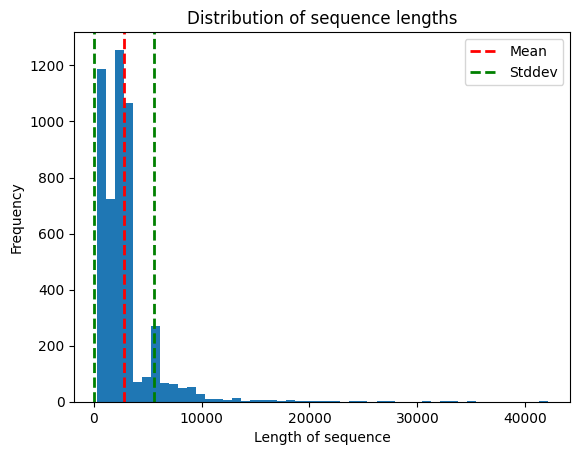

In [327]:
import matplotlib.pyplot as plt
import numpy as np


# Calculate mean and standard deviation of sequence lengths
mean_length = np.mean(sequence_lengths)
stddev_length = np.std(sequence_lengths)

plt.hist(sequence_lengths, bins=50)
plt.axvline(mean_length, color='r', linestyle='dashed', linewidth=2, label='Mean')
plt.axvline(mean_length + stddev_length, color='g', linestyle='dashed', linewidth=2, label='Stddev')
plt.axvline(mean_length - stddev_length, color='g', linestyle='dashed', linewidth=2)
plt.title('Distribution of sequence lengths')
plt.xlabel('Length of sequence')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [328]:
mean_length

2808.2988597719545

In [329]:
from sklearn.model_selection import train_test_split

X = padded_sequences_per_row
y = dataset_1['cwe_id_value'].tolist() # Assuming 'label' is the column containing the target labels

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [330]:
X_train_numpy = np.asarray(X_train).astype('float32').reshape(-1, 4000, 1)
X_test_numpy = np.asarray(X_test).astype('float32').reshape(-1, 4000, 1)
y_train_numpy = np.asarray(y_train).astype('int')
y_test_numpy = np.asarray(y_test).astype('int')



In [331]:
unique_train = set(y_train_numpy)
unique_test = set(y_test_numpy)

print("Unique values in y_train_numpy:", unique_train)
print("Unique values in y_test_numpy:", unique_test)

# Find unique values in y_test_numpy that are not in y_train_numpy
unique_test_not_in_train = unique_test - unique_train

if unique_test_not_in_train:
    print("Unique values in y_test_numpy that are not in y_train_numpy:", unique_test_not_in_train)
else:
    print("All unique values in y_test_numpy are also present in y_train_numpy.")


Unique values in y_train_numpy: {256, 129, 257, 643, 259, 134, 390, 523, 396, 15, 400, 789, 23, 546, 547, 36, 293, 549, 681, 300, 690, 563, 180, 565, 566, 182, 698, 315, 572, 190, 191, 319, 321, 328, 330, 586, 78, 80, 81, 209, 83, 470, 598, 89, 90, 601, 476, 477, 606, 352, 482, 484, 486, 617, 491, 113, 369, 497, 114, 759, 760, 382, 511}
Unique values in y_test_numpy: {257, 129, 643, 259, 134, 390, 523, 396, 15, 789, 23, 36, 293, 690, 563, 180, 566, 182, 570, 190, 191, 319, 584, 78, 80, 209, 81, 83, 470, 89, 90, 601, 476, 477, 606, 614, 486, 617, 369, 113, 114, 760}
Unique values in y_test_numpy that are not in y_train_numpy: {584, 570, 614}


In [192]:
len(unique_train)

70

In [332]:
import numpy as np

# create boolean mask for rows to keep
keep_mask = ~(np.in1d(y_test_numpy, [584, 570, 614]))

# filter y_test_numpy and X_test_numpy using the mask
y_test_numpy_filtered = y_test_numpy[keep_mask]
X_test_numpy_filtered = X_test_numpy[keep_mask]


In [333]:
import numpy as np

unique_labels = np.unique(y_train_numpy)
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}

y_train_mapped = np.array([label_mapping[label] for label in y_train_numpy])
y_test_mapped = np.array([label_mapping[label] for label in y_test_numpy_filtered])

y_train_categorical = to_categorical(y_train_mapped)
y_test_categorical = to_categorical(y_test_mapped)


In [203]:
y_train_categorical[0]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0.], dtype=float32)

In [208]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping



embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences

model = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    LSTM(rnn_units, return_sequences=True),
    LSTM(rnn_units),
    Dense(70, activation='softmax')
])

model.summary()


Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_19 (Embedding)    (None, 4000, 128)         1280000   
                                                                 
 lstm (LSTM)                 (None, 4000, 64)          49408     
                                                                 
 lstm_1 (LSTM)               (None, 64)                33024     
                                                                 
 dense_19 (Dense)            (None, 70)                4550      
                                                                 
Total params: 1,366,982
Trainable params: 1,366,982
Non-trainable params: 0
_________________________________________________________________


In [209]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)



Epoch 1/10
100/100 [==============================] - 301s 3s/step - loss: 2.9591 - accuracy: 0.2220 - val_loss: 2.6303 - val_accuracy: 0.2313
Epoch 2/10
100/100 [==============================] - 295s 3s/step - loss: 2.6516 - accuracy: 0.2248 - val_loss: 2.6587 - val_accuracy: 0.2313
Epoch 3/10
100/100 [==============================] - 302s 3s/step - loss: 2.5090 - accuracy: 0.2517 - val_loss: 2.2634 - val_accuracy: 0.3075
Epoch 4/10
100/100 [==============================] - 309s 3s/step - loss: 2.3085 - accuracy: 0.2727 - val_loss: 2.1818 - val_accuracy: 0.2887
Epoch 5/10
100/100 [==============================] - 302s 3s/step - loss: 2.2118 - accuracy: 0.2961 - val_loss: 2.1264 - val_accuracy: 0.3100
Epoch 6/10
100/100 [==============================] - 297s 3s/step - loss: 2.1842 - accuracy: 0.2849 - val_loss: 2.1425 - val_accuracy: 0.2950
Epoch 7/10
100/100 [==============================] - 280s 3s/step - loss: 2.1925 - accuracy: 0.2767 - val_loss: 2.1362 - val_accuracy: 0.2862

In [212]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 16s 491ms/step - loss: 1.9895 - accuracy: 0.3976
Test loss: 1.9894883632659912, Test accuracy: 0.39759036898612976


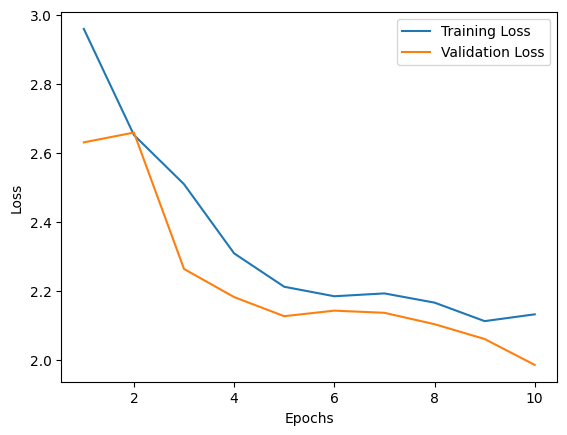

In [213]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [218]:
#Model2

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional


embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences



model = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    Bidirectional(LSTM(rnn_units)),
    Dense(70, activation='softmax')
])


model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 4000, 128)         1280000   
                                                                 
 bidirectional (Bidirectiona  (None, 128)              98816     
 l)                                                              
                                                                 
 dense_1 (Dense)             (None, 70)                9030      
                                                                 
Total params: 1,387,846
Trainable params: 1,387,846
Non-trainable params: 0
_________________________________________________________________


In [219]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)



Epoch 1/10
100/100 [==============================] - 181s 2s/step - loss: 2.8502 - accuracy: 0.2395 - val_loss: 2.2912 - val_accuracy: 0.3363
Epoch 2/10
100/100 [==============================] - 180s 2s/step - loss: 2.2525 - accuracy: 0.3446 - val_loss: 2.1072 - val_accuracy: 0.2988
Epoch 3/10
100/100 [==============================] - 179s 2s/step - loss: 2.1143 - accuracy: 0.3587 - val_loss: 2.0106 - val_accuracy: 0.3587
Epoch 4/10
100/100 [==============================] - 179s 2s/step - loss: 2.0244 - accuracy: 0.3927 - val_loss: 1.9204 - val_accuracy: 0.4212
Epoch 5/10
100/100 [==============================] - 180s 2s/step - loss: 2.0194 - accuracy: 0.4071 - val_loss: 1.8809 - val_accuracy: 0.4062
Epoch 6/10
100/100 [==============================] - 180s 2s/step - loss: 1.9670 - accuracy: 0.4253 - val_loss: 1.8117 - val_accuracy: 0.4462
Epoch 7/10
100/100 [==============================] - 181s 2s/step - loss: 1.9680 - accuracy: 0.4178 - val_loss: 1.8153 - val_accuracy: 0.4538

In [220]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 11s 329ms/step - loss: 1.7770 - accuracy: 0.4849
Test loss: 1.776964783668518, Test accuracy: 0.4849397540092468


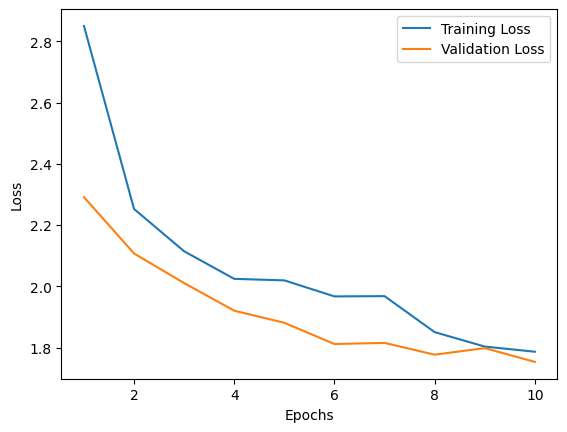

In [221]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [223]:
#Model3

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense,GRU
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional


embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences



model = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    GRU(rnn_units),
    Dense(70, activation='softmax')
])



model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 4000, 128)         1280000   
                                                                 
 gru (GRU)                   (None, 64)                37248     
                                                                 
 dense_2 (Dense)             (None, 70)                4550      
                                                                 
Total params: 1,321,798
Trainable params: 1,321,798
Non-trainable params: 0
_________________________________________________________________


In [224]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)



Epoch 1/10
100/100 [==============================] - 141s 1s/step - loss: 3.0283 - accuracy: 0.2389 - val_loss: 2.4209 - val_accuracy: 0.3075
Epoch 2/10
100/100 [==============================] - 139s 1s/step - loss: 2.3394 - accuracy: 0.3218 - val_loss: 2.1664 - val_accuracy: 0.3438
Epoch 3/10
100/100 [==============================] - 139s 1s/step - loss: 2.1718 - accuracy: 0.3558 - val_loss: 2.0562 - val_accuracy: 0.3837
Epoch 4/10
100/100 [==============================] - 151s 2s/step - loss: 2.0941 - accuracy: 0.3749 - val_loss: 1.9873 - val_accuracy: 0.3812
Epoch 5/10
100/100 [==============================] - 133s 1s/step - loss: 1.9995 - accuracy: 0.4118 - val_loss: 1.8402 - val_accuracy: 0.4600
Epoch 6/10
100/100 [==============================] - 141s 1s/step - loss: 1.8399 - accuracy: 0.4537 - val_loss: 1.7136 - val_accuracy: 0.4762
Epoch 7/10
100/100 [==============================] - 137s 1s/step - loss: 1.7066 - accuracy: 0.4956 - val_loss: 1.6030 - val_accuracy: 0.5000

In [225]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 6s 194ms/step - loss: 1.4936 - accuracy: 0.5753
Test loss: 1.493575930595398, Test accuracy: 0.5753012299537659


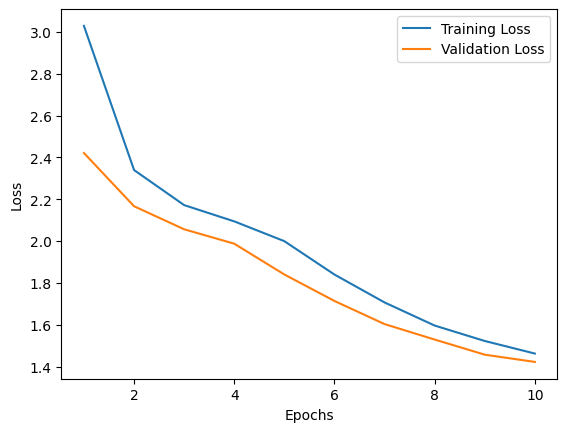

In [226]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [227]:
#Model4

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense,GRU
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional


embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences





model = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    Bidirectional(GRU(rnn_units)),
    Dense(70, activation='softmax')
])




model.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, 4000, 128)         1280000   
                                                                 
 bidirectional_1 (Bidirectio  (None, 128)              74496     
 nal)                                                            
                                                                 
 dense_3 (Dense)             (None, 70)                9030      
                                                                 
Total params: 1,363,526
Trainable params: 1,363,526
Non-trainable params: 0
_________________________________________________________________


In [228]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 184s 2s/step - loss: 2.9025 - accuracy: 0.2555 - val_loss: 2.2950 - val_accuracy: 0.2875
Epoch 2/10
100/100 [==============================] - 171s 2s/step - loss: 2.2174 - accuracy: 0.3296 - val_loss: 2.0497 - val_accuracy: 0.3450
Epoch 3/10
100/100 [==============================] - 172s 2s/step - loss: 2.1156 - accuracy: 0.3530 - val_loss: 2.0398 - val_accuracy: 0.3562
Epoch 4/10
100/100 [==============================] - 171s 2s/step - loss: 2.0550 - accuracy: 0.3730 - val_loss: 1.9462 - val_accuracy: 0.3688
Epoch 5/10
100/100 [==============================] - 162s 2s/step - loss: 1.9570 - accuracy: 0.3902 - val_loss: 1.8606 - val_accuracy: 0.4137
Epoch 6/10
100/100 [==============================] - 163s 2s/step - loss: 1.8799 - accuracy: 0.4137 - val_loss: 1.8311 - val_accuracy: 0.4350
Epoch 7/10
100/100 [==============================] - 166s 2s/step - loss: 1.8415 - accuracy: 0.4403 - val_loss: 1.8059 - val_accuracy: 0.4338

In [229]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 7s 201ms/step - loss: 1.7688 - accuracy: 0.4799
Test loss: 1.7688350677490234, Test accuracy: 0.4799196720123291


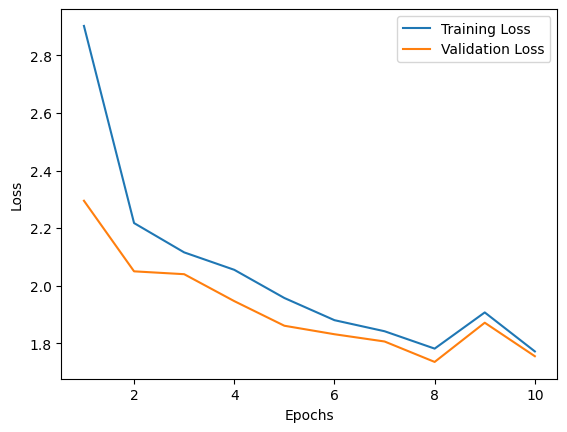

In [230]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [231]:
#Model5

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense,GRU
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Conv1D, MaxPooling1D

embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences






model = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    Conv1D(filters=128, kernel_size=5, activation='relu'),
    MaxPooling1D(pool_size=2),
    GRU(rnn_units),
    Dense(70, activation='softmax')
])




model.summary()


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, 4000, 128)         1280000   
                                                                 
 conv1d (Conv1D)             (None, 3996, 128)         82048     
                                                                 
 max_pooling1d (MaxPooling1D  (None, 1998, 128)        0         
 )                                                               
                                                                 
 gru_2 (GRU)                 (None, 64)                37248     
                                                                 
 dense_4 (Dense)             (None, 70)                4550      
                                                                 
Total params: 1,403,846
Trainable params: 1,403,846
Non-trainable params: 0
____________________________________________

In [232]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 73s 726ms/step - loss: 2.7975 - accuracy: 0.2774 - val_loss: 2.2762 - val_accuracy: 0.3137
Epoch 2/10
100/100 [==============================] - 79s 791ms/step - loss: 2.1701 - accuracy: 0.3618 - val_loss: 1.9732 - val_accuracy: 0.4187
Epoch 3/10
100/100 [==============================] - 70s 702ms/step - loss: 1.9951 - accuracy: 0.4078 - val_loss: 1.8541 - val_accuracy: 0.4475
Epoch 4/10
100/100 [==============================] - 72s 720ms/step - loss: 1.9096 - accuracy: 0.4343 - val_loss: 1.7783 - val_accuracy: 0.4725
Epoch 5/10
100/100 [==============================] - 70s 700ms/step - loss: 1.8482 - accuracy: 0.4428 - val_loss: 1.7362 - val_accuracy: 0.4762
Epoch 6/10
100/100 [==============================] - 70s 701ms/step - loss: 1.8081 - accuracy: 0.4575 - val_loss: 1.7070 - val_accuracy: 0.4787
Epoch 7/10
100/100 [==============================] - 70s 699ms/step - loss: 1.7760 - accuracy: 0.4612 - val_loss: 1.6787 - val_ac

In [233]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 4s 136ms/step - loss: 1.4910 - accuracy: 0.5422
Test loss: 1.4910244941711426, Test accuracy: 0.5421686768531799


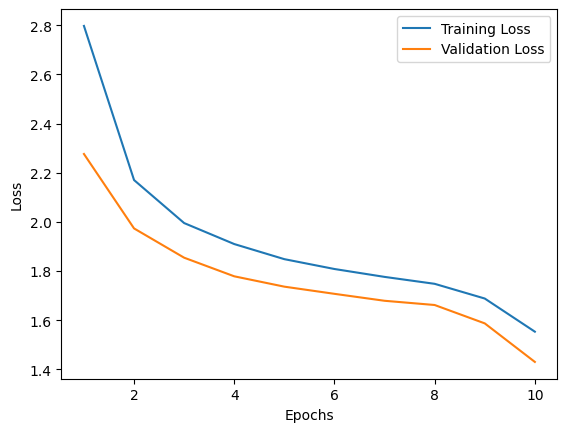

In [234]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [235]:
#Model6

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense,GRU
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Conv1D, MaxPooling1D

embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences






model = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    Conv1D(filters=128, kernel_size=5, activation='relu'),
    MaxPooling1D(pool_size=2),
    LSTM(rnn_units),
    Dense(70, activation='softmax')
])




model.summary()


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_6 (Embedding)     (None, 4000, 128)         1280000   
                                                                 
 conv1d_1 (Conv1D)           (None, 3996, 128)         82048     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1998, 128)        0         
 1D)                                                             
                                                                 
 lstm_1 (LSTM)               (None, 64)                49408     
                                                                 
 dense_5 (Dense)             (None, 70)                4550      
                                                                 
Total params: 1,416,006
Trainable params: 1,416,006
Non-trainable params: 0
____________________________________________

In [236]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 84s 838ms/step - loss: 2.8833 - accuracy: 0.2795 - val_loss: 2.3065 - val_accuracy: 0.3487
Epoch 2/10
100/100 [==============================] - 84s 843ms/step - loss: 2.2318 - accuracy: 0.3762 - val_loss: 2.1242 - val_accuracy: 0.3650
Epoch 3/10
100/100 [==============================] - 83s 829ms/step - loss: 2.0112 - accuracy: 0.4300 - val_loss: 1.8197 - val_accuracy: 0.4700
Epoch 4/10
100/100 [==============================] - 84s 836ms/step - loss: 1.8398 - accuracy: 0.4568 - val_loss: 1.7094 - val_accuracy: 0.4613
Epoch 5/10
100/100 [==============================] - 83s 827ms/step - loss: 1.7156 - accuracy: 0.5050 - val_loss: 1.6372 - val_accuracy: 0.5213
Epoch 6/10
100/100 [==============================] - 83s 826ms/step - loss: 1.6193 - accuracy: 0.5294 - val_loss: 1.5570 - val_accuracy: 0.5300
Epoch 7/10
100/100 [==============================] - 83s 828ms/step - loss: 1.5643 - accuracy: 0.5331 - val_loss: 1.5026 - val_ac

In [237]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 6s 188ms/step - loss: 1.4591 - accuracy: 0.5683
Test loss: 1.4591286182403564, Test accuracy: 0.5682730674743652


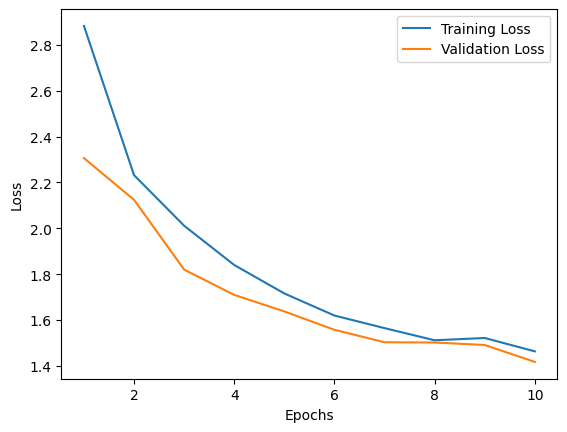

In [238]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [239]:
#Model7

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense,GRU
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Conv1D, MaxPooling1D

embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences






model = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    GRU(rnn_units, return_sequences=True),
    GRU(rnn_units),
    Dense(70, activation='softmax')
])





model.summary()


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_7 (Embedding)     (None, 4000, 128)         1280000   
                                                                 
 gru_3 (GRU)                 (None, 4000, 64)          37248     
                                                                 
 gru_4 (GRU)                 (None, 64)                24960     
                                                                 
 dense_6 (Dense)             (None, 70)                4550      
                                                                 
Total params: 1,346,758
Trainable params: 1,346,758
Non-trainable params: 0
_________________________________________________________________


In [240]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 241s 2s/step - loss: 2.9114 - accuracy: 0.2255 - val_loss: 2.4098 - val_accuracy: 0.2600
Epoch 2/10
100/100 [==============================] - 251s 3s/step - loss: 2.3542 - accuracy: 0.3052 - val_loss: 2.2134 - val_accuracy: 0.3038
Epoch 3/10
100/100 [==============================] - 246s 2s/step - loss: 2.1701 - accuracy: 0.3437 - val_loss: 2.0278 - val_accuracy: 0.3750
Epoch 4/10
100/100 [==============================] - 251s 3s/step - loss: 2.0567 - accuracy: 0.3818 - val_loss: 1.9221 - val_accuracy: 0.4062
Epoch 5/10
100/100 [==============================] - 265s 3s/step - loss: 1.9671 - accuracy: 0.4112 - val_loss: 1.8736 - val_accuracy: 0.4450
Epoch 6/10
100/100 [==============================] - 276s 3s/step - loss: 1.8985 - accuracy: 0.4290 - val_loss: 1.7798 - val_accuracy: 0.4588
Epoch 7/10
100/100 [==============================] - 259s 3s/step - loss: 1.7292 - accuracy: 0.4847 - val_loss: 1.6996 - val_accuracy: 0.4888

In [241]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 11s 352ms/step - loss: 1.4735 - accuracy: 0.5693
Test loss: 1.4734938144683838, Test accuracy: 0.5692771077156067


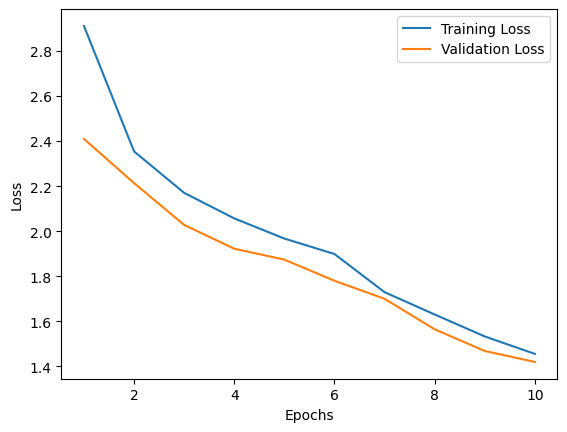

In [242]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [243]:
#Model8

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense,GRU
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Conv1D, MaxPooling1D

embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences






model = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    Conv1D(filters=128, kernel_size=5, activation='relu'),
    MaxPooling1D(pool_size=2),
    LSTM(rnn_units, return_sequences=True),
    LSTM(rnn_units),
    Dense(70, activation='softmax')
])





model.summary()


Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_8 (Embedding)     (None, 4000, 128)         1280000   
                                                                 
 conv1d_2 (Conv1D)           (None, 3996, 128)         82048     
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 1998, 128)        0         
 1D)                                                             
                                                                 
 lstm_2 (LSTM)               (None, 1998, 64)          49408     
                                                                 
 lstm_3 (LSTM)               (None, 64)                33024     
                                                                 
 dense_7 (Dense)             (None, 70)                4550      
                                                      

In [244]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 135s 1s/step - loss: 2.9178 - accuracy: 0.2095 - val_loss: 2.5477 - val_accuracy: 0.2438
Epoch 2/10
100/100 [==============================] - 132s 1s/step - loss: 2.3859 - accuracy: 0.3133 - val_loss: 2.2394 - val_accuracy: 0.2875
Epoch 3/10
100/100 [==============================] - 131s 1s/step - loss: 2.2373 - accuracy: 0.3246 - val_loss: 2.1326 - val_accuracy: 0.3225
Epoch 4/10
100/100 [==============================] - 130s 1s/step - loss: 2.1508 - accuracy: 0.3505 - val_loss: 2.0349 - val_accuracy: 0.3738
Epoch 5/10
100/100 [==============================] - 131s 1s/step - loss: 2.0607 - accuracy: 0.3740 - val_loss: 2.0169 - val_accuracy: 0.3650
Epoch 6/10
100/100 [==============================] - 130s 1s/step - loss: 2.0230 - accuracy: 0.4137 - val_loss: 1.8910 - val_accuracy: 0.4588
Epoch 7/10
100/100 [==============================] - 131s 1s/step - loss: 1.9845 - accuracy: 0.4128 - val_loss: 1.8931 - val_accuracy: 0.4137

In [245]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 9s 287ms/step - loss: 1.7443 - accuracy: 0.4729
Test loss: 1.7442587614059448, Test accuracy: 0.47289156913757324


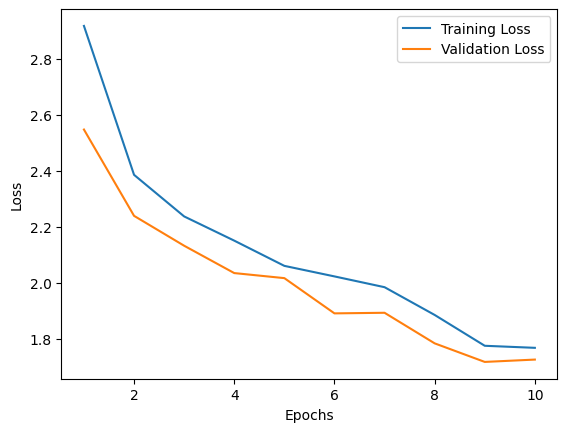

In [246]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [247]:
#Model9

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense,GRU
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Conv1D, MaxPooling1D

embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences






model = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    Conv1D(filters=128, kernel_size=5, activation='relu'),
    MaxPooling1D(pool_size=2),
    GRU(rnn_units, return_sequences=True),
    GRU(rnn_units),
    Dense(70, activation='softmax')
])





model.summary()


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_9 (Embedding)     (None, 4000, 128)         1280000   
                                                                 
 conv1d_3 (Conv1D)           (None, 3996, 128)         82048     
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 1998, 128)        0         
 1D)                                                             
                                                                 
 gru_5 (GRU)                 (None, 1998, 64)          37248     
                                                                 
 gru_6 (GRU)                 (None, 64)                24960     
                                                                 
 dense_8 (Dense)             (None, 70)                4550      
                                                      

In [248]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 119s 1s/step - loss: 2.8208 - accuracy: 0.2330 - val_loss: 2.3380 - val_accuracy: 0.2675
Epoch 2/10
100/100 [==============================] - 119s 1s/step - loss: 2.2177 - accuracy: 0.3580 - val_loss: 1.9711 - val_accuracy: 0.4363
Epoch 3/10
100/100 [==============================] - 118s 1s/step - loss: 1.9276 - accuracy: 0.4459 - val_loss: 1.7598 - val_accuracy: 0.4737
Epoch 4/10
100/100 [==============================] - 118s 1s/step - loss: 1.7143 - accuracy: 0.4975 - val_loss: 1.5638 - val_accuracy: 0.5300
Epoch 5/10
100/100 [==============================] - 120s 1s/step - loss: 1.5388 - accuracy: 0.5525 - val_loss: 1.4513 - val_accuracy: 0.5638
Epoch 6/10
100/100 [==============================] - 117s 1s/step - loss: 1.4423 - accuracy: 0.5769 - val_loss: 1.4125 - val_accuracy: 0.5688
Epoch 7/10
100/100 [==============================] - 115s 1s/step - loss: 1.3790 - accuracy: 0.5897 - val_loss: 1.3768 - val_accuracy: 0.5875

In [249]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 7s 213ms/step - loss: 1.3136 - accuracy: 0.6145
Test loss: 1.3136224746704102, Test accuracy: 0.6144578456878662


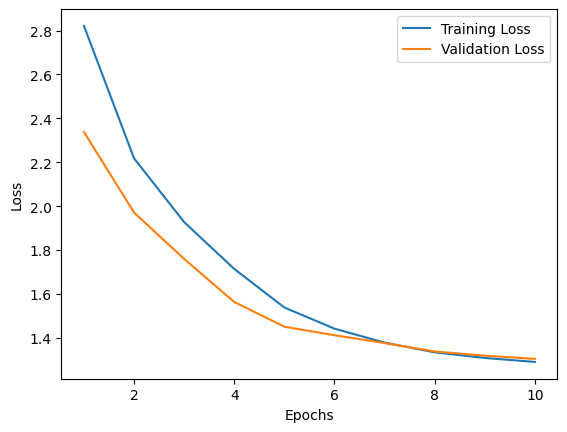

In [250]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [251]:
#Model10

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense,GRU
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Conv1D, MaxPooling1D

embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences






model = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    Conv1D(filters=128, kernel_size=5, activation='relu'),
    MaxPooling1D(pool_size=2),
    Bidirectional(LSTM(rnn_units)),
    Dense(70, activation='softmax')
])





model.summary()


Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_10 (Embedding)    (None, 4000, 128)         1280000   
                                                                 
 conv1d_4 (Conv1D)           (None, 3996, 128)         82048     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 1998, 128)        0         
 1D)                                                             
                                                                 
 bidirectional_2 (Bidirectio  (None, 128)              98816     
 nal)                                                            
                                                                 
 dense_9 (Dense)             (None, 70)                9030      
                                                                 
Total params: 1,469,894
Trainable params: 1,469,894
No

In [252]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 94s 931ms/step - loss: 2.7536 - accuracy: 0.2717 - val_loss: 2.2252 - val_accuracy: 0.3550
Epoch 2/10
100/100 [==============================] - 93s 928ms/step - loss: 2.1206 - accuracy: 0.3890 - val_loss: 1.9834 - val_accuracy: 0.4013
Epoch 3/10
100/100 [==============================] - 93s 930ms/step - loss: 1.9175 - accuracy: 0.4396 - val_loss: 1.7274 - val_accuracy: 0.4900
Epoch 4/10
100/100 [==============================] - 93s 934ms/step - loss: 1.7440 - accuracy: 0.4784 - val_loss: 1.6708 - val_accuracy: 0.4875
Epoch 5/10
100/100 [==============================] - 93s 928ms/step - loss: 1.6500 - accuracy: 0.5113 - val_loss: 1.5664 - val_accuracy: 0.5075
Epoch 6/10
100/100 [==============================] - 93s 927ms/step - loss: 1.5533 - accuracy: 0.5394 - val_loss: 1.5099 - val_accuracy: 0.5500
Epoch 7/10
100/100 [==============================] - 93s 926ms/step - loss: 1.5162 - accuracy: 0.5375 - val_loss: 1.5013 - val_ac

In [253]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 7s 203ms/step - loss: 1.3978 - accuracy: 0.5833
Test loss: 1.3977755308151245, Test accuracy: 0.5833333134651184


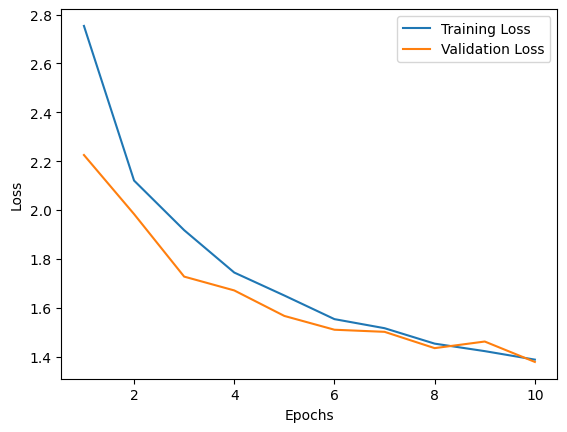

In [254]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [255]:
#Model11

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense,GRU
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Conv1D, MaxPooling1D

embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences






model = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    Conv1D(filters=128, kernel_size=5, activation='relu'),
    MaxPooling1D(pool_size=2),
    Bidirectional(GRU(rnn_units)),
    Dense(70, activation='softmax')
])





model.summary()


Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_11 (Embedding)    (None, 4000, 128)         1280000   
                                                                 
 conv1d_5 (Conv1D)           (None, 3996, 128)         82048     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 1998, 128)        0         
 1D)                                                             
                                                                 
 bidirectional_3 (Bidirectio  (None, 128)              74496     
 nal)                                                            
                                                                 
 dense_10 (Dense)            (None, 70)                9030      
                                                                 
Total params: 1,445,574
Trainable params: 1,445,574
N

In [256]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 80s 787ms/step - loss: 2.7347 - accuracy: 0.2624 - val_loss: 2.2271 - val_accuracy: 0.3462
Epoch 2/10
100/100 [==============================] - 79s 793ms/step - loss: 2.1356 - accuracy: 0.3646 - val_loss: 1.9303 - val_accuracy: 0.4087
Epoch 3/10
100/100 [==============================] - 86s 861ms/step - loss: 1.9409 - accuracy: 0.4165 - val_loss: 1.8292 - val_accuracy: 0.4375
Epoch 4/10
100/100 [==============================] - 82s 821ms/step - loss: 1.8330 - accuracy: 0.4462 - val_loss: 1.7635 - val_accuracy: 0.4663
Epoch 5/10
100/100 [==============================] - 80s 799ms/step - loss: 1.7383 - accuracy: 0.4847 - val_loss: 1.6806 - val_accuracy: 0.4888
Epoch 6/10
100/100 [==============================] - 81s 807ms/step - loss: 1.6132 - accuracy: 0.5188 - val_loss: 1.5841 - val_accuracy: 0.4700
Epoch 7/10
100/100 [==============================] - 81s 807ms/step - loss: 1.4825 - accuracy: 0.5528 - val_loss: 1.4760 - val_ac

In [257]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 5s 153ms/step - loss: 1.4071 - accuracy: 0.5823
Test loss: 1.4071124792099, Test accuracy: 0.5823293328285217


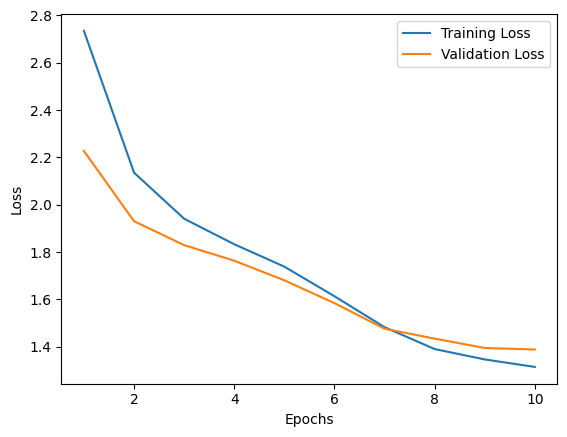

In [258]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [262]:
#Model12

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense,GRU
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Conv1D, MaxPooling1D

embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences






from tensorflow.keras.layers import Dropout

model1 = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    Conv1D(filters=128, kernel_size=5, activation='relu'),
    MaxPooling1D(pool_size=2),
    Dropout(0.5),
    GRU(rnn_units, return_sequences=True),
    Dropout(0.5),
    GRU(rnn_units),
    Dropout(0.5),
    Dense(70, activation='softmax')
])





model.summary()


Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_11 (Embedding)    (None, 4000, 128)         1280000   
                                                                 
 conv1d_5 (Conv1D)           (None, 3996, 128)         82048     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 1998, 128)        0         
 1D)                                                             
                                                                 
 bidirectional_3 (Bidirectio  (None, 128)              74496     
 nal)                                                            
                                                                 
 dense_10 (Dense)            (None, 70)                9030      
                                                                 
Total params: 1,445,574
Trainable params: 1,445,574
N

In [263]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 79s 780ms/step - loss: 1.3078 - accuracy: 0.5944 - val_loss: 1.3746 - val_accuracy: 0.5688
Epoch 2/10
100/100 [==============================] - 78s 780ms/step - loss: 1.2780 - accuracy: 0.5972 - val_loss: 1.3269 - val_accuracy: 0.5775
Epoch 3/10
100/100 [==============================] - 77s 772ms/step - loss: 1.2548 - accuracy: 0.6060 - val_loss: 1.3259 - val_accuracy: 0.5900
Epoch 4/10
100/100 [==============================] - 77s 773ms/step - loss: 1.2434 - accuracy: 0.6107 - val_loss: 1.3409 - val_accuracy: 0.5850
Epoch 5/10
100/100 [==============================] - 77s 767ms/step - loss: 1.2324 - accuracy: 0.6154 - val_loss: 1.3218 - val_accuracy: 0.5838
Epoch 6/10
100/100 [==============================] - 79s 792ms/step - loss: 1.2238 - accuracy: 0.6148 - val_loss: 1.3059 - val_accuracy: 0.5850
Epoch 7/10
100/100 [==============================] - 84s 840ms/step - loss: 1.2216 - accuracy: 0.6116 - val_loss: 1.3316 - val_ac

In [264]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 5s 149ms/step - loss: 1.3148 - accuracy: 0.6074
Test loss: 1.3148267269134521, Test accuracy: 0.6074297428131104


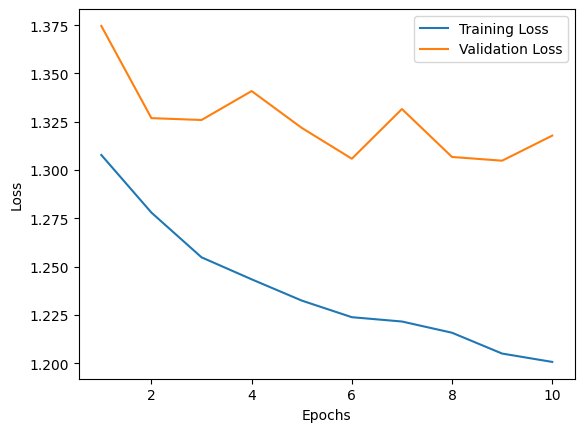

In [265]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [267]:
#Model13

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense,GRU
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Conv1D, MaxPooling1D

embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences








from tensorflow.keras import regularizers

l2_lambda = 0.01

model2 = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    Conv1D(filters=128, kernel_size=5, activation='relu', kernel_regularizer=regularizers.l2(l2_lambda)),
    MaxPooling1D(pool_size=2),
    GRU(rnn_units, return_sequences=True, kernel_regularizer=regularizers.l2(l2_lambda)),
    GRU(rnn_units, kernel_regularizer=regularizers.l2(l2_lambda)),
    Dense(70, activation='softmax')
])





model.summary()


Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_11 (Embedding)    (None, 4000, 128)         1280000   
                                                                 
 conv1d_5 (Conv1D)           (None, 3996, 128)         82048     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 1998, 128)        0         
 1D)                                                             
                                                                 
 bidirectional_3 (Bidirectio  (None, 128)              74496     
 nal)                                                            
                                                                 
 dense_10 (Dense)            (None, 70)                9030      
                                                                 
Total params: 1,445,574
Trainable params: 1,445,574
N

In [268]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 79s 777ms/step - loss: 1.2134 - accuracy: 0.6182 - val_loss: 1.3115 - val_accuracy: 0.5850
Epoch 2/10
100/100 [==============================] - 78s 776ms/step - loss: 1.1949 - accuracy: 0.6194 - val_loss: 1.3118 - val_accuracy: 0.5863
Epoch 3/10
100/100 [==============================] - 78s 777ms/step - loss: 1.1942 - accuracy: 0.6235 - val_loss: 1.3155 - val_accuracy: 0.5863
Epoch 4/10
100/100 [==============================] - 77s 773ms/step - loss: 1.1880 - accuracy: 0.6220 - val_loss: 1.2982 - val_accuracy: 0.5850
Epoch 5/10
100/100 [==============================] - 77s 769ms/step - loss: 1.1907 - accuracy: 0.6123 - val_loss: 1.3033 - val_accuracy: 0.5888
Epoch 6/10
100/100 [==============================] - 77s 773ms/step - loss: 1.1829 - accuracy: 0.6223 - val_loss: 1.2966 - val_accuracy: 0.5900
Epoch 7/10
100/100 [==============================] - 78s 776ms/step - loss: 1.1827 - accuracy: 0.6235 - val_loss: 1.2909 - val_ac

In [269]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 5s 138ms/step - loss: 1.2965 - accuracy: 0.6094
Test loss: 1.2965070009231567, Test accuracy: 0.6094377636909485


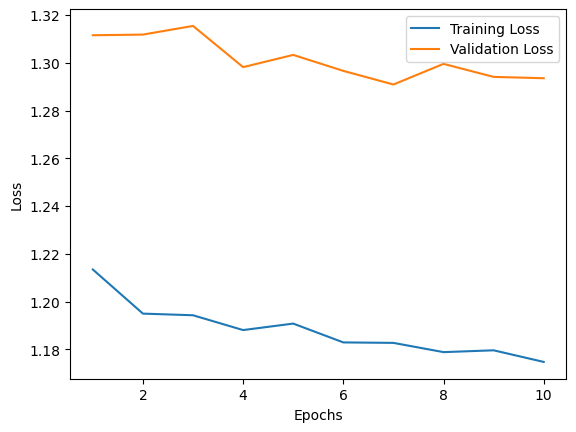

In [270]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [274]:
#Model14

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense,GRU
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Conv1D, MaxPooling1D

embedding_dim = 128  # You can change this value based on your preferences
rnn_units = 64  # You can change this value based on your preferences





from tensorflow.keras.layers import LayerNormalization

model3 = Sequential([
    Embedding(max_words, embedding_dim, input_length=max_length),
    Conv1D(filters=128, kernel_size=5, activation='relu'),
    MaxPooling1D(pool_size=2),
    GRU(rnn_units, return_sequences=True),
    LayerNormalization(),
    GRU(rnn_units),
    LayerNormalization(),
    Dense(70, activation='softmax')
])



model.summary()


Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_11 (Embedding)    (None, 4000, 128)         1280000   
                                                                 
 conv1d_5 (Conv1D)           (None, 3996, 128)         82048     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 1998, 128)        0         
 1D)                                                             
                                                                 
 bidirectional_3 (Bidirectio  (None, 128)              74496     
 nal)                                                            
                                                                 
 dense_10 (Dense)            (None, 70)                9030      
                                                                 
Total params: 1,445,574
Trainable params: 1,445,574
N

In [275]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 79s 780ms/step - loss: 1.1841 - accuracy: 0.6194 - val_loss: 1.2893 - val_accuracy: 0.5900
Epoch 2/10
100/100 [==============================] - 78s 780ms/step - loss: 1.1760 - accuracy: 0.6223 - val_loss: 1.3206 - val_accuracy: 0.5888
Epoch 3/10
100/100 [==============================] - 79s 789ms/step - loss: 1.1736 - accuracy: 0.6248 - val_loss: 1.3128 - val_accuracy: 0.5900
Epoch 4/10
100/100 [==============================] - 80s 796ms/step - loss: 1.1711 - accuracy: 0.6241 - val_loss: 1.3074 - val_accuracy: 0.5825


In [276]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 5s 142ms/step - loss: 1.3135 - accuracy: 0.5944
Test loss: 1.3135182857513428, Test accuracy: 0.5943775177001953


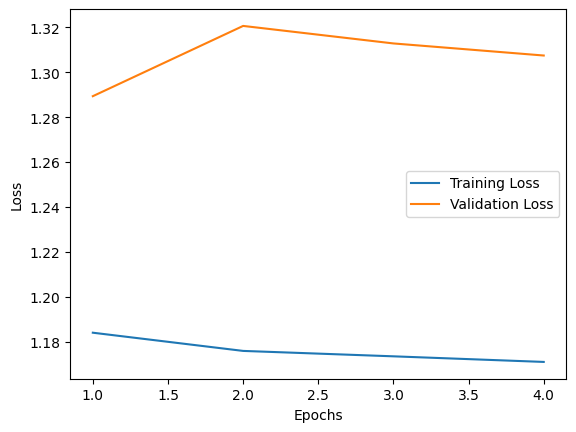

In [277]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [346]:
#Model15

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Conv1D, MaxPooling1D, GRU, Dense, Attention, Flatten

embedding_dim = 128
rnn_units = 64

input_layer = Input(shape=(max_length,))
embedding = Embedding(max_words, embedding_dim, input_length=max_length)(input_layer)
conv1d = Conv1D(filters=128, kernel_size=5, activation='relu')(embedding)
max_pooling = MaxPooling1D(pool_size=2)(conv1d)
gru1 = GRU(rnn_units, return_sequences=True)(max_pooling)
gru2 = GRU(rnn_units, return_sequences=True)(gru1)
gru3 = GRU(rnn_units)(gru2)
# Attention layer


attention1 = Attention()([gru2, gru2])
attention2 = Attention()([attention1, gru3])


flatten = Flatten()(attention2)
output_layer = Dense(63, activation='softmax')(flatten)

model4 = Model(inputs=input_layer, outputs=output_layer)

model4.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 4000)]       0           []                               
                                                                                                  
 embedding_9 (Embedding)        (None, 4000, 128)    1280000     ['input_10[0][0]']               
                                                                                                  
 conv1d_9 (Conv1D)              (None, 3996, 128)    82048       ['embedding_9[0][0]']            
                                                                                                  
 max_pooling1d_9 (MaxPooling1D)  (None, 1998, 128)   0           ['conv1d_9[0][0]']               
                                                                                            

In [347]:
model4.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model4.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10


2023-04-28 09:55:01.129114: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:690] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "CPU" model: "0" num_cores: 12 environment { key: "cpu_instruction_set" value: "ARM NEON" } environment { key: "eigen" value: "3.4.90" } l1_cache_size: 16384 l2_cache_size: 524288 l3_cache_size: 524288 memory_size: 268435456 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }
2023-04-28 09:55:01.129228: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:690] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "CPU" model: "0" num_cores: 12 environment { key: "cpu_instruction_set" value: "ARM NEON" } environment { key: "eigen" value: "3.4.90" } l1_cache_size: 16384 l2_cache_size: 524288 l3_cache_size: 524288 me

100/100 [==============================] - ETA: 0s - loss: 2.2418 - accuracy: 0.3776

2023-04-28 09:58:22.715876: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:690] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "CPU" model: "0" num_cores: 12 environment { key: "cpu_instruction_set" value: "ARM NEON" } environment { key: "eigen" value: "3.4.90" } l1_cache_size: 16384 l2_cache_size: 524288 l3_cache_size: 524288 memory_size: 268435456 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }
2023-04-28 09:58:22.715939: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:690] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "CPU" model: "0" num_cores: 12 environment { key: "cpu_instruction_set" value: "ARM NEON" } environment { key: "eigen" value: "3.4.90" } l1_cache_size: 16384 l2_cache_size: 524288 l3_cache_size: 524288 me

100/100 [==============================] - 215s 2s/step - loss: 2.2418 - accuracy: 0.3776 - val_loss: 1.7515 - val_accuracy: 0.4850
Epoch 2/10
100/100 [==============================] - 213s 2s/step - loss: 1.4670 - accuracy: 0.5742 - val_loss: 1.2832 - val_accuracy: 0.5888
Epoch 3/10
100/100 [==============================] - 215s 2s/step - loss: 1.3004 - accuracy: 0.6099 - val_loss: 1.3535 - val_accuracy: 0.5825
Epoch 4/10
100/100 [==============================] - 217s 2s/step - loss: 1.2436 - accuracy: 0.6208 - val_loss: 1.1938 - val_accuracy: 0.6100
Epoch 5/10
100/100 [==============================] - 224s 2s/step - loss: 1.2102 - accuracy: 0.6327 - val_loss: 1.1768 - val_accuracy: 0.6325
Epoch 6/10
100/100 [==============================] - 216s 2s/step - loss: 1.2057 - accuracy: 0.6264 - val_loss: 1.1499 - val_accuracy: 0.5863
Epoch 7/10
100/100 [==============================] - 214s 2s/step - loss: 1.2143 - accuracy: 0.6243 - val_loss: 1.2461 - val_accuracy: 0.6112
Epoch 8/10

In [292]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 5s 141ms/step - loss: 1.2855 - accuracy: 0.6185
Test loss: 1.2855435609817505, Test accuracy: 0.6184738874435425


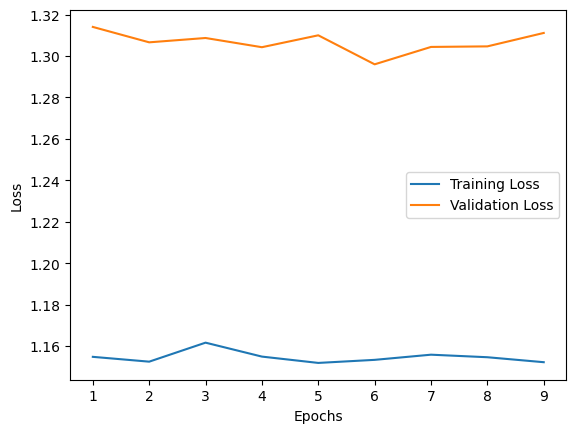

In [293]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [321]:
# Set the display options to show the full content of a column
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.expand_frame_repr', False)  # Disable wrapping to multiple lines
pd.set_option('display.max_colwidth', None)  # Show the full content of each column
pd.reset_option('display.max_rows')  # Reset the option to the default value

df_filter = dataset_1[dataset_1['uri'].str.contains("testcasesupport")]['uri']
df_filter

2054623                             src/main/java/testcasesupport/IO.java
3048473               src/main/java/testcasesupport/AbstractTestCase.java
608892                src/main/java/testcasesupport/AbstractTestCase.java
2277658        src/main/java/testcasesupport/AbstractTestCaseServlet.java
4543273    src/main/java/testcasesupport/AbstractTestCaseServletBase.java
                                        ...                              
2727291                             src/main/java/testcasesupport/IO.java
5230433           src/main/java/testcasesupport/AbstractTestCaseBase.java
1277020                             src/main/java/testcasesupport/IO.java
3176573                             src/main/java/testcasesupport/IO.java
4721282                             src/main/java/testcasesupport/IO.java
Name: uri, Length: 2542, dtype: object

In [ ]:
#Model 16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Conv1D, MaxPooling1D, GRU, Dense, Attention, Flatten

embedding_dim = 128
rnn_units = 64

input_layer = Input(shape=(max_length,))
embedding = Embedding(max_words, embedding_dim, input_length=max_length)(input_layer)
conv1d = Conv1D(filters=128, kernel_size=5, activation='relu')(embedding)
max_pooling = MaxPooling1D(pool_size=2)(conv1d)
gru1 = GRU(rnn_units, return_sequences=True)(max_pooling)
gru2 = GRU(rnn_units, return_sequences=True)(gru1)
gru3 = GRU(rnn_units, return_sequences=True)(gru2)
gru4 = GRU(rnn_units, return_sequences=True)(gru3)



# Attention layer
attention1 = Attention()([gru2, gru2])
attention2 = Attention()([attention1, gru3])
attention3 = Attention()([attention2, gru4])

flatten = Flatten()(attention3)
output_layer = Dense(70, activation='softmax')(flatten)

model4 = Model(inputs=input_layer, outputs=output_layer)

model4.summary()


In [295]:
model4.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 79s 791ms/step - loss: 1.1531 - accuracy: 0.6270 - val_loss: 1.3019 - val_accuracy: 0.5925
Epoch 2/10
100/100 [==============================] - 79s 786ms/step - loss: 1.1504 - accuracy: 0.6288 - val_loss: 1.3039 - val_accuracy: 0.5900
Epoch 3/10
100/100 [==============================] - 80s 797ms/step - loss: 1.1501 - accuracy: 0.6276 - val_loss: 1.3057 - val_accuracy: 0.5925
Epoch 4/10
100/100 [==============================] - 79s 787ms/step - loss: 1.1507 - accuracy: 0.6282 - val_loss: 1.3091 - val_accuracy: 0.5875


In [296]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 5s 141ms/step - loss: 1.2731 - accuracy: 0.6205
Test loss: 1.273148536682129, Test accuracy: 0.6204819083213806


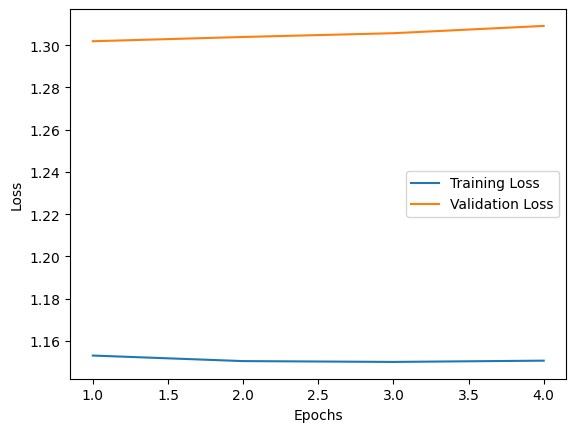

In [297]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [298]:
#Model 17
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Conv1D, MaxPooling1D, GRU, Dense, Attention, Flatten

embedding_dim = 128
rnn_units = 64

input_layer = Input(shape=(max_length,))
embedding = Embedding(max_words, embedding_dim, input_length=max_length)(input_layer)
conv1d = Conv1D(filters=128, kernel_size=5, activation='relu')(embedding)
max_pooling = MaxPooling1D(pool_size=2)(conv1d)
gru1 = GRU(rnn_units, return_sequences=True)(max_pooling)
gru2 = GRU(rnn_units, return_sequences=True)(gru1)
gru3 = GRU(rnn_units, return_sequences=True)(gru2)
gru4 = GRU(rnn_units, return_sequences=True)(gru3)
gru5 = GRU(rnn_units, return_sequences=True)(gru4)
# Attention layer
attention1 = Attention()([gru2, gru2])
attention2 = Attention()([attention1, gru3])
attention3 = Attention()([attention2, gru4])
attention4 = Attention()([attention3, gru5])

flatten = Flatten()(attention4)
output_layer = Dense(70, activation='softmax')(flatten)

model4 = Model(inputs=input_layer, outputs=output_layer)

model4.summary()


Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 4000)]       0           []                               
                                                                                                  
 embedding_26 (Embedding)       (None, 4000, 128)    1280000     ['input_7[0][0]']                
                                                                                                  
 conv1d_19 (Conv1D)             (None, 3996, 128)    82048       ['embedding_26[0][0]']           
                                                                                                  
 max_pooling1d_18 (MaxPooling1D  (None, 1998, 128)   0           ['conv1d_19[0][0]']              
 )                                                                                          

In [299]:
model4.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 79s 785ms/step - loss: 1.1501 - accuracy: 0.6270 - val_loss: 1.3023 - val_accuracy: 0.5925
Epoch 2/10
100/100 [==============================] - 78s 784ms/step - loss: 1.1525 - accuracy: 0.6279 - val_loss: 1.3241 - val_accuracy: 0.5900
Epoch 3/10
100/100 [==============================] - 78s 776ms/step - loss: 1.1518 - accuracy: 0.6282 - val_loss: 1.3141 - val_accuracy: 0.5925
Epoch 4/10
100/100 [==============================] - 78s 781ms/step - loss: 1.1554 - accuracy: 0.6276 - val_loss: 1.3008 - val_accuracy: 0.5900
Epoch 5/10
100/100 [==============================] - 78s 784ms/step - loss: 1.1531 - accuracy: 0.6260 - val_loss: 1.3263 - val_accuracy: 0.5888
Epoch 6/10
100/100 [==============================] - 79s 786ms/step - loss: 1.1573 - accuracy: 0.6260 - val_loss: 1.3276 - val_accuracy: 0.5888
Epoch 7/10
100/100 [==============================] - 78s 784ms/step - loss: 1.1574 - accuracy: 0.6263 - val_loss: 1.3114 - val_ac

In [300]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 5s 141ms/step - loss: 1.3051 - accuracy: 0.6064
Test loss: 1.305141568183899, Test accuracy: 0.6064257025718689


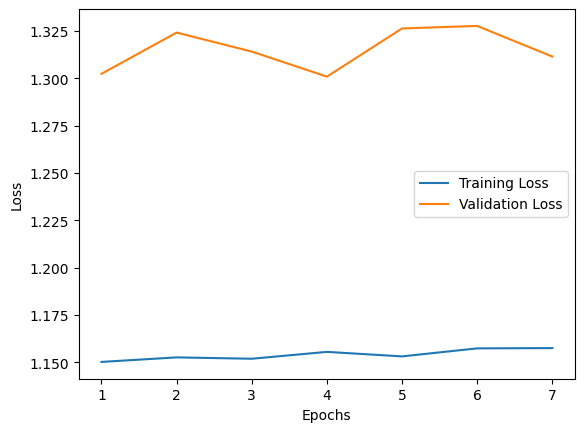

In [301]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [279]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Conv1D, MaxPooling1D, GRU, Dense, Attention, Flatten

embedding_dim = 128
rnn_units = 64

input_layer = Input(shape=(max_length,))
embedding = Embedding(max_words, embedding_dim, input_length=max_length)(input_layer)
conv1d = Conv1D(filters=128, kernel_size=5, activation='relu')(embedding)
max_pooling = MaxPooling1D(pool_size=2)(conv1d)
gru1 = GRU(rnn_units, return_sequences=True)(max_pooling)
gru2 = GRU(rnn_units, return_sequences=True)(gru1)

# Attention layer
attention = Attention()([gru2, gru2])

flatten = Flatten()(attention)
output_layer = Dense(70, activation='softmax')(flatten)

model4 = Model(inputs=input_layer, outputs=output_layer)

model4.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 4000)]       0           []                               
                                                                                                  
 embedding_20 (Embedding)       (None, 4000, 128)    1280000     ['input_1[0][0]']                
                                                                                                  
 conv1d_13 (Conv1D)             (None, 3996, 128)    82048       ['embedding_20[0][0]']           
                                                                                                  
 max_pooling1d_12 (MaxPooling1D  (None, 1998, 128)   0           ['conv1d_13[0][0]']              
 )                                                                                            

In [280]:
model4.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 78s 782ms/step - loss: 1.1730 - accuracy: 0.6235 - val_loss: 1.3026 - val_accuracy: 0.5925
Epoch 2/10
100/100 [==============================] - 78s 779ms/step - loss: 1.1658 - accuracy: 0.6226 - val_loss: 1.3059 - val_accuracy: 0.5987
Epoch 3/10
100/100 [==============================] - 78s 777ms/step - loss: 1.1635 - accuracy: 0.6260 - val_loss: 1.2975 - val_accuracy: 0.5925
Epoch 4/10
100/100 [==============================] - 79s 794ms/step - loss: 1.1624 - accuracy: 0.6245 - val_loss: 1.3042 - val_accuracy: 0.5925
Epoch 5/10
100/100 [==============================] - 78s 780ms/step - loss: 1.1647 - accuracy: 0.6248 - val_loss: 1.3005 - val_accuracy: 0.5925
Epoch 6/10
100/100 [==============================] - 80s 801ms/step - loss: 1.1623 - accuracy: 0.6216 - val_loss: 1.3139 - val_accuracy: 0.5875


In [281]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 5s 151ms/step - loss: 1.2863 - accuracy: 0.6145
Test loss: 1.2863391637802124, Test accuracy: 0.6144578456878662


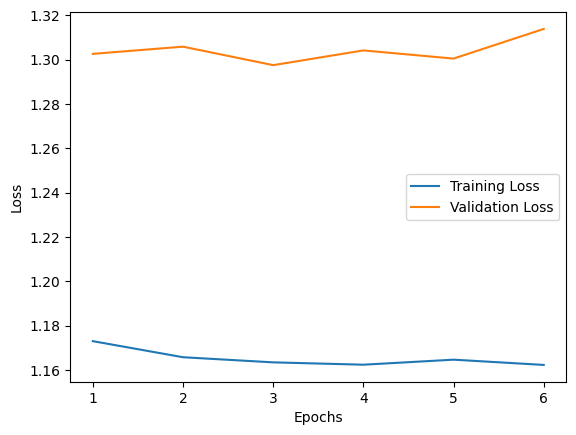

In [282]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [279]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Conv1D, MaxPooling1D, GRU, Dense, Attention, Flatten

embedding_dim = 128
rnn_units = 64

input_layer = Input(shape=(max_length,))
embedding = Embedding(max_words, embedding_dim, input_length=max_length)(input_layer)
conv1d = Conv1D(filters=128, kernel_size=5, activation='relu')(embedding)
max_pooling = MaxPooling1D(pool_size=2)(conv1d)
gru1 = GRU(rnn_units, return_sequences=True)(max_pooling)
gru2 = GRU(rnn_units, return_sequences=True)(gru1)

# Attention layer
attention = Attention()([gru2, gru2])

flatten = Flatten()(attention)
output_layer = Dense(70, activation='softmax')(flatten)

model4 = Model(inputs=input_layer, outputs=output_layer)

model4.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 4000)]       0           []                               
                                                                                                  
 embedding_20 (Embedding)       (None, 4000, 128)    1280000     ['input_1[0][0]']                
                                                                                                  
 conv1d_13 (Conv1D)             (None, 3996, 128)    82048       ['embedding_20[0][0]']           
                                                                                                  
 max_pooling1d_12 (MaxPooling1D  (None, 1998, 128)   0           ['conv1d_13[0][0]']              
 )                                                                                            

In [280]:
model4.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you want to train for 10 epochs with a batch size of 32
epochs = 10
batch_size = 32
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(
    X_train_numpy,
    y_train_categorical,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping]
)


Epoch 1/10
100/100 [==============================] - 78s 782ms/step - loss: 1.1730 - accuracy: 0.6235 - val_loss: 1.3026 - val_accuracy: 0.5925
Epoch 2/10
100/100 [==============================] - 78s 779ms/step - loss: 1.1658 - accuracy: 0.6226 - val_loss: 1.3059 - val_accuracy: 0.5987
Epoch 3/10
100/100 [==============================] - 78s 777ms/step - loss: 1.1635 - accuracy: 0.6260 - val_loss: 1.2975 - val_accuracy: 0.5925
Epoch 4/10
100/100 [==============================] - 79s 794ms/step - loss: 1.1624 - accuracy: 0.6245 - val_loss: 1.3042 - val_accuracy: 0.5925
Epoch 5/10
100/100 [==============================] - 78s 780ms/step - loss: 1.1647 - accuracy: 0.6248 - val_loss: 1.3005 - val_accuracy: 0.5925
Epoch 6/10
100/100 [==============================] - 80s 801ms/step - loss: 1.1623 - accuracy: 0.6216 - val_loss: 1.3139 - val_accuracy: 0.5875


In [281]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

32/32 [==============================] - 5s 151ms/step - loss: 1.2863 - accuracy: 0.6145
Test loss: 1.2863391637802124, Test accuracy: 0.6144578456878662


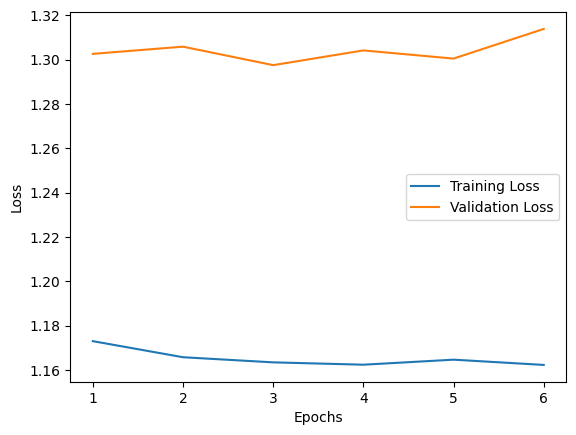

In [282]:
import matplotlib.pyplot as plt

# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epoch numbers
epochs_range = range(1, len(train_loss) + 1)

# Plot training and validation loss
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')

# Add labels and legend
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

In [214]:
!pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 kB 1.2 MB/s eta 0:00:00 kB/s eta 0:00:01:01


In [305]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense
from kerastuner import HyperModel
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Conv1D, MaxPooling1D, GRU, Dense, Attention, Flatten

class TextClassificationHyperModel(HyperModel):
    def __init__(self, max_words, max_length, num_classes):
        self.max_words = max_words
        self.max_length = max_length
        self.num_classes = num_classes
        
    def build(self, hp):
        
        #Model 16


        embedding_dim = 128
        rnn_units = 256
        model = Sequential()  
        input_layer = Input(shape=(max_length,))
        embedding = Embedding(max_words, embedding_dim, input_length=max_length)(input_layer)
        conv1d = Conv1D(filters=128, kernel_size=5, activation='relu')(embedding)
        max_pooling = MaxPooling1D(pool_size=2)(conv1d)
        gru1 = GRU(rnn_units, return_sequences=True)(max_pooling)
        gru2 = GRU(rnn_units, return_sequences=True)(gru1)
        gru3 = GRU(rnn_units, return_sequences=True)(gru2)
        gru4 = GRU(rnn_units, return_sequences=True)(gru3)



        # Attention layer
        attention1 = Attention()([gru2, gru2])
        attention2 = Attention()([attention1, gru3])
        attention3 = Attention()([attention2, gru4])

        flatten = Flatten()(attention3)
        output_layer = Dense(70, activation='softmax')(flatten)

        model = Model(inputs=input_layer, outputs=output_layer)
        model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

        return model


In [306]:
from kerastuner.tuners import RandomSearch

hypermodel = TextClassificationHyperModel(max_words, max_length, num_classes=70)

tuner = RandomSearch(
    hypermodel,
    objective='val_accuracy',
    max_trials=10,  # Number of different hyperparameter combinations to try
    directory='tuner_results',
    project_name='text_classification'
)


INFO:tensorflow:Reloading Tuner from tuner_results/text_classification/tuner0.json


In [307]:
tuner.search(X_train_numpy, y_train_categorical, epochs=10, validation_split=0.2)

Trial 10 Complete [00h 44m 18s]
val_accuracy: 0.6150000095367432

Best val_accuracy So Far: 0.6150000095367432
Total elapsed time: 08h 23m 48s
INFO:tensorflow:Oracle triggered exit


In [308]:
best_model = tuner.get_best_models(num_models=1)[0]
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]
history = best_model.fit(X_train_numpy, y_train_categorical, epochs=10, batch_size=batch_size, validation_split=0.2)


Epoch 1/10


2023-04-27 22:59:03.650060: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:690] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "CPU" model: "0" num_cores: 12 environment { key: "cpu_instruction_set" value: "ARM NEON" } environment { key: "eigen" value: "3.4.90" } l1_cache_size: 16384 l2_cache_size: 524288 l3_cache_size: 524288 memory_size: 268435456 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }
2023-04-27 22:59:03.650174: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:690] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "CPU" model: "0" num_cores: 12 environment { key: "cpu_instruction_set" value: "ARM NEON" } environment { key: "eigen" value: "3.4.90" } l1_cache_size: 16384 l2_cache_size: 524288 l3_cache_size: 524288 me

 68/100 [===================>..........] - ETA: 1:27 - loss: 1.3922 - accuracy: 0.5708

InvalidArgumentError: Graph execution error:

Detected at node 'truediv_33' defined at (most recent call last):
    File "/Users/connor.neff/.pyenv/versions/3.9.1/lib/python3.9/runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/Users/connor.neff/.pyenv/versions/3.9.1/lib/python3.9/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "/Users/connor.neff/.pyenv/versions/3.9.1/lib/python3.9/asyncio/base_events.py", line 596, in run_forever
      self._run_once()
    File "/Users/connor.neff/.pyenv/versions/3.9.1/lib/python3.9/asyncio/base_events.py", line 1890, in _run_once
      handle._run()
    File "/Users/connor.neff/.pyenv/versions/3.9.1/lib/python3.9/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3006, in run_cell
      result = self._run_cell(
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3061, in _run_cell
      result = runner(coro)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3266, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3445, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3505, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/var/folders/mm/dmh1xdk14h12vgxvjxghl6fh0000gp/T/ipykernel_61000/1437099170.py", line 3, in <module>
      history = best_model.fit(X_train_numpy, y_train_categorical, epochs=10, batch_size=batch_size, validation_split=0.2)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/engine/training.py", line 1685, in fit
      tmp_logs = self.train_function(iterator)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/engine/training.py", line 1284, in train_function
      return step_function(self, iterator)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/engine/training.py", line 1268, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/engine/training.py", line 1249, in run_step
      outputs = model.train_step(data)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/engine/training.py", line 1054, in train_step
      self.optimizer.minimize(loss, self.trainable_variables, tape=tape)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/optimizers/optimizer.py", line 543, in minimize
      self.apply_gradients(grads_and_vars)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/optimizers/optimizer.py", line 1174, in apply_gradients
      return super().apply_gradients(grads_and_vars, name=name)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/optimizers/optimizer.py", line 650, in apply_gradients
      iteration = self._internal_apply_gradients(grads_and_vars)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/optimizers/optimizer.py", line 1200, in _internal_apply_gradients
      return tf.__internal__.distribute.interim.maybe_merge_call(
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/optimizers/optimizer.py", line 1250, in _distributed_apply_gradients_fn
      distribution.extended.update(
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/optimizers/optimizer.py", line 1247, in apply_grad_to_update_var
      return self._update_step(grad, var)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/optimizers/optimizer.py", line 240, in _update_step
      self.update_step(gradient, variable)
    File "/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/keras/optimizers/adam.py", line 200, in update_step
      variable.assign_sub((m * alpha) / (tf.sqrt(v) + self.epsilon))
Node: 'truediv_33'
Incompatible shapes: [0] vs. [70]
	 [[{{node truediv_33}}]] [Op:__inference_train_function_400486]

In [ ]:
loss, accuracy = model.evaluate(X_test_numpy_filtered, y_test_categorical)
print(f'Test loss: {loss}, Test accuracy: {accuracy}')

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F


In [ ]:
class TransformerEncoder(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_heads):
        super(TransformerEncoder, self).__init__()

        self.input_size = input_size
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.num_heads = num_heads

        self.embedding = nn.Embedding(input_size, hidden_size)
        self.pos_encoding = self._positional_encoding(hidden_size)
        self.attention = nn.MultiheadAttention(hidden_size, num_heads)
        self.feedforward = nn.Sequential(
            nn.Linear(hidden_size, hidden_size * 4),
            nn.ReLU(),
            nn.Linear(hidden_size * 4, hidden_size)
        )
        self.dropout = nn.Dropout(p=0.1)

    def forward(self, x):
        x = self.embedding(x) * torch.sqrt(self.hidden_size)
        x = x + self.pos_encoding[:x.size(1), :]
        x = x.permute(1, 0, 2)
        x, _ = self.attention(x, x, x)
        x = x.permute(1, 0, 2)
        x = self.feedforward(x)
        x = self.dropout(x)

        return x

    def _positional_encoding(self, hidden_size, max_seq_len=1000):
        pos_encoding = torch.zeros(max_seq_len, hidden_size)
        pos = torch.arange(0, max_seq_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, hidden_size, 2) * -(math.log(10000.0) / hidden_size))
        pos_encoding[:, 0::2] = torch.sin(pos * div_term)
        pos_encoding[:, 1::2] = torch.cos(pos * div_term)

        return pos_encoding


In [ ]:
class TextClassifier(nn.Module):
    def __init__(self, vocab_size, hidden_size, num_classes, num_layers, num_heads):
        super(TextClassifier, self).__init__()

        self.vocab_size = vocab_size
        self.hidden_size = hidden_size
        self.num_classes = num_classes
        self.num_layers = num_layers
        self.num_heads = num_heads

        self.encoder = TransformerEncoder(vocab_size, hidden_size, num_layers, num_heads)
        self.pooling = nn.MaxPool1


Here are some preprocessing steps you could consider for each feature:

Node type: Encode each node type as an integer or one-hot vector, depending on the size of your dataset and the number of unique node types.
Text content of the node: Depending on the length of the text, you could consider tokenizing the text and padding each sequence to a fixed length, or encoding the text using a technique like Word2Vec or BERT.
Tokenized words: Similar to the text content, you could encode each token as an integer or one-hot vector, or use a pre-trained embedding like Word2Vec or BERT.
Function names: Encode each function name as an integer or one-hot vector, depending on the number of unique function names in your dataset.
Conditions: Depending on the type of conditions you're looking for, you could use regular expressions or other pattern matching techniques to identify conditions in the code, and encode them as a binary value.
Variable types: Similar to the node type, encode each variable type as an integer or one-hot vector, depending on the size of your dataset and the number of unique variable types.
Error handling: Depending on the type of error handling you're looking for, you could use regular expressions or other pattern matching techniques to identify error handling code in the AST, and encode it as a binary value.
For the transformer architecture, you may want to consider using attention mechanisms to focus on the most relevant features at each layer of the model, and using positional encoding to help the model understand the order of the nodes in the AST.

Explore data finding common words and such to get best inputs for the model

In [ ]:
from transformers import RobertaTokenizer, RobertaForSequenceClassification, TextDataset, DataCollatorForLanguageModeling, Trainer, TrainingArguments

model_name = "microsoft/codebert-base"
tokenizer = RobertaTokenizer.from_pretrained(model_name)
model = RobertaForSequenceClassification.from_pretrained(model_name)


In [361]:
dataset_1['length'].sort_values(ascending=False)

1500446    39290
394874     38704
1411643    37541
1406054    36498
1542596    34843
           ...  
2023369      446
2066364      446
2356099      395
2353710      395
2364015      365
Name: length, Length: 4999, dtype: int64

In [366]:
from transformers import pipeline, TFAutoModelForSeq2SeqLM, AutoTokenizer

def split_input(text, chunk_size):
    return [text[i:i + chunk_size] for i in range(0, len(text), chunk_size)]

def summarize_java_code(input_code):
    # Load the T5 model and tokenizer
    model = TFAutoModelForSeq2SeqLM.from_pretrained("t5-small")
    tokenizer = AutoTokenizer.from_pretrained("t5-small")

    # Create the summarization pipeline
    summarizer = pipeline("summarization", model=model, tokenizer=tokenizer)

    # Split the input text into chunks
    input_chunks = split_input(input_code['source_code'], 512)

    # Generate summary for each chunk and combine them
    summaries = []
    for chunk in input_chunks:
        summary = summarizer(chunk, max_length=150, min_length=10, do_sample=False)
        summaries.append(summary[0]['summary_text'])

    # Combine the summaries into the final summary
    final_summary = ' '.join(summaries)
    return final_summary

dataset_1['summary'] = dataset_1.apply(summarize_java_code, axis=1)


All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.


Your max_length is set to 150, but you input_length is only 142. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
/Users/connor.neff/.pyenv/versions/3.9.1/envs/myenv2/lib/python3.9/site-packages/transformers/generation/tf_utils.py:745: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed soon, in a future version. Please use a generation configuration file (see https://huggingface.co/docs/transformers/main_classes/text_generation)
  warnings.warn(
Your max_length is set to 150, but you input_length is only 95. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=47)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the chec

Your max_length is set to 150, but you input_length is only 73. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=36)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at 

Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 98. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 23. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=11)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at

Your max_length is set to 150, but you input_length is only 145. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=72)
Your max_length is set to 150, but you input_length is only 148. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=74)
Your max_length is set to 150, but you input_length is only 120. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=60)
Your max_length is set to 150, but you input_length is only 31. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=15)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
All model checkpoint lay

Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
All model checkpoint lay

Your max_length is set to 150, but you input_length is only 125. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=62)
Your max_length is set to 150, but you input_length is only 123. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=61)
Your max_length is set to 150, but you input_length is only 86. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=43)
Your max_length is set to 150, but you input_length is only 83. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=41)
Your max_length is set to 150, but you input_length is only 99. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
Your max_length is set to 150, but you input_length is only 118. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=59)
Your max_length is set to 150, but you input_length is only 125. You might cons

Your max_length is set to 150, but you input_length is only 136. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=68)
Your max_length is set to 150, but you input_length is only 44. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=22)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layer

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 39. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=19)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summ

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 144. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=72)
Your max_length is set to 150, but you input_length is only 60. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=30)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictio

Your max_length is set to 150, but you input_length is only 133. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=66)
Your max_length is set to 150, but you input_length is only 114. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=57)
Your max_length is set to 150, but you input_length is only 82. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=41)
Your max_length is set to 150, but you input_length is only 67. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=33)
Your max_length is set to 150, but you input_length is only 100. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=50)
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 93. You might cons

Your max_length is set to 150, but you input_length is only 148. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=74)
Your max_length is set to 150, but you input_length is only 28. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=14)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layer

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 11. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 78. You might consider decreasing max_length manually, e.g. summar

Your max_length is set to 150, but you input_length is only 32. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=16)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 147. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set t

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 142. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 95. You might consider decreasing max_length manually, e.g. summ

Your max_length is set to 150, but you input_length is only 144. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=72)
Your max_length is set to 150, but you input_length is only 26. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=13)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set t

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 41. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=20)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summ

Your max_length is set to 150, but you input_length is only 148. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=74)
Your max_length is set to 150, but you input_length is only 146. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 29. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=14)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 93. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=46)
All model checkpoint laye

Your max_length is set to 150, but you input_length is only 120. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=60)
Your max_length is set to 150, but you input_length is only 14. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=7)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 140. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 112. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=56)
Your max_length is set to

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for prediction

Your max_length is set to 150, but you input_length is only 98. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 63. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=31)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for prediction

Your max_length is set to 150, but you input_length is only 114. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=57)
Your max_length is set to 150, but you input_length is only 128. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 109. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 43. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=21)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the m

Your max_length is set to 150, but you input_length is only 121. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=60)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
Your max_length is set to 150, but you input_length is only 96. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
Your max_length is set to 150, but you input_length is only 133. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=66)
Your max_length is set to 150, but you input_length is only 148. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=74)
Your max_length is set to 150, but you input_length is only 110. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=55)
Your max_length is set to 150, but you input_length is only 130. You might con

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 102. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=51)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is on

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 147. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 103. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=51)
Your max_length is set to 150, but you input_length is only 110. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=55)
Your max_length is set to 150, but you input_length is only 126. You might consider decreasing max_length manu

Your max_length is set to 150, but you input_length is only 5. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=2)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 85. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=42)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions 

Your max_length is set to 150, but you input_length is only 88. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=44)
Your max_length is set to 150, but you input_length is only 90. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=45)
Your max_length is set to 150, but you input_length is only 136. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=68)
Your max_length is set to 150, but you input_length is only 128. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 94. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=47)
Your max_length is set to 150, but you input_length is only 84. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=42)
Your max_length is set to 150, but you input_length is only 141. You might consi

Your max_length is set to 150, but you input_length is only 130. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=65)
Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 98. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 41. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=20)
All model checkpoint laye

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 24. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=12)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 148. You might consider decreasing max_length manually, e.g. summ

Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 3. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=1)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at 

Your max_length is set to 150, but you input_length is only 32. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=16)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at 

Your max_length is set to 150, but you input_length is only 54. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=27)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint a

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint a

Your max_length is set to 150, but you input_length is only 98. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at 

Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 106. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=53)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint la

Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 72. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=36)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictio

Your max_length is set to 150, but you input_length is only 148. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=74)
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 142. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 95. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=47)
All model checkpoint lay

Your max_length is set to 150, but you input_length is only 106. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=53)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 146. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 116. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=58)
Your max_length is set to 150, but you input_length is only 132. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=66)
Your max_length is set 

Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 132. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=66)
Your max_length is set to 150, but you input_length is only 113. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=56)
Your max_length is set to 150, but you input_length is only 92. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=46)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 121. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=60)
Your max_length is set to 150, but you input_length is only 108. You might co

Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint a

Your max_length is set to 150, but you input_length is only 25. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=12)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 146. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 80. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=40)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at

Your max_length is set to 150, but you input_length is only 98. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 55. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=27)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for prediction

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint a

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 142. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 95. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=47)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is onl

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for prediction

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for prediction

Your max_length is set to 150, but you input_length is only 101. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=50)
Your max_length is set to 150, but you input_length is only 90. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=45)
Your max_length is set to 150, but you input_length is only 147. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 45. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=22)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to

Your max_length is set to 150, but you input_length is only 130. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=65)
Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 98. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 94. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=47)
All model checkpoint laye

Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 122. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=61)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set t

Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 109. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 49. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=24)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set t

Your max_length is set to 150, but you input_length is only 135. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 118. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=59)
Your max_length is set to 150, but you input_length is only 83. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=41)
Your max_length is set to 150, but you input_length is only 67. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=33)
Your max_length is set to 150, but you input_length is only 107. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=53)
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 59. You might cons

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 146. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 128. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 135. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 131. You might consider decreasing max_length manu

Your max_length is set to 150, but you input_length is only 49. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=24)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 144. You might consider decreasing max_length manually, e.g. summ

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 146. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 92. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=46)
Your max_length is set to 150, but you input_length is only 73. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=36)
Your max_length is set to 150, but you input_length is only 142. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to

Your max_length is set to 150, but you input_length is only 104. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=52)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint 

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is on

Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 132. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=66)
Your max_length is set to 150, but you input_length is only 130. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=65)
Your max_length is set 

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 147. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 32. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=16)
All model checkpoint lay

Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
Your max_length is set t

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predicti

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 85. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=42)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGe

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 142. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 95. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=47)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is onl

Your max_length is set to 150, but you input_length is only 120. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=60)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 147. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set 

Your max_length is set to 150, but you input_length is only 112. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=56)
Your max_length is set to 150, but you input_length is only 102. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=51)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set 

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predicti

Your max_length is set to 150, but you input_length is only 130. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=65)
Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 98. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 57. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=28)
All model checkpoint laye

Your max_length is set to 150, but you input_length is only 98. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
All model checkpoint laye

Your max_length is set to 150, but you input_length is only 126. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 29. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=14)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 136. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=68)
Your max_length is set t

Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 113. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=56)
Your max_length is set to 150, but you input_length is only 92. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=46)
Your max_length is set to 150, but you input_length is only 106. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=53)
Your max_length is set to 150, but you input_length is only 91. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=45)
Your max_length is set to 150, but you input_length is only 125. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=62)
Your max_length is set to 150, but you input_length is only 123. You might con

Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predicti

Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 81. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=40)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint a

Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint 

Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 92. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=46)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions

Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
All model checkpoint layer

Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set t

Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 106. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=53)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 136. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=68)
Your max_length is set 

Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 98. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint lay

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 54. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=27)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is onl

Your max_length is set to 150, but you input_length is only 114. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=57)
Your max_length is set to 150, but you input_length is only 94. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=47)
Your max_length is set to 150, but you input_length is only 105. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=52)
Your max_length is set to 150, but you input_length is only 116. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=58)
Your max_length is set to 150, but you input_length is only 53. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=26)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the mo

Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 101. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=50)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predicti

Your max_length is set to 150, but you input_length is only 147. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 32. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=16)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set t

Your max_length is set to 150, but you input_length is only 56. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=28)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 128. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 69. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=34)
All model checkpoint laye

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 85. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=42)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGe

Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 133. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=66)
Your max_length is set to 150, but you input_length is only 111. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=55)
Your max_length is set to 150, but you input_length is only 91. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=45)
Your max_length is set to 150, but you input_length is only 104. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=52)
Your max_length is set to 150, but you input_length is only 136. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=68)
Your max_length is set to 150, but you input_length is only 34. You might con

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 5. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=2)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 18. You might consider decreasing max_length manually, e.g. summari

Your max_length is set to 150, but you input_length is only 92. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=46)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 70. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=35)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for prediction

Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 32. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=16)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 142. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set t

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predicti

Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to

Your max_length is set to 150, but you input_length is only 146. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 104. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=52)
Your max_length is set to 150, but you input_length is only 113. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=56)
Your max_length is set to 150, but you input_length is only 68. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=34)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set t

Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. sum

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 145. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=72)
Your max_length is set to 150, but you input_length is only 91. You might consider decreasing max_length manually, e.g. summ

Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 86. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=43)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layer

Your max_length is set to 150, but you input_length is only 132. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=66)
Your max_length is set to 150, but you input_length is only 130. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=65)
Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 98. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set t

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is on

Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 14. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=7)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 60. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=30)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at 

Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 64. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=32)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint a

Your max_length is set to 150, but you input_length is only 140. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 49. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=24)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 148. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=74)
Your max_length is set to 150, but you input_length is only 148. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=74)
Your max_length is set t

Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 131. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=65)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 142. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 95. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=47)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictio

Your max_length is set to 150, but you input_length is only 98. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
All model checkpoint laye

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint a

Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 51. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=25)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictio

Your max_length is set to 150, but you input_length is only 96. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 96. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
Your max_length is set to 150, but you input_length is only 90. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=45)
Your max_length is set to 150, but you input_length is only 131. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=65)
Your max_length is set to 150, but you input_length is only 132. You might cons

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 142. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. sum

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 136. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=68)
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 85. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=42)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint a

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 111. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=55)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. sum

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 29. You might consider decreasing max_length manually, e.g. summ

Your max_length is set to 150, but you input_length is only 147. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=73)
Your max_length is set to 150, but you input_length is only 45. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=22)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 116. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=58)
Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set t

Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 32. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=16)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set t

Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 145. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=72)
Your max_length is set to 150, but you input_length is only 119. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=59)
Your max_length is set 

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 141. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=70)
Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is on

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 132. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=66)
Your max_length is set to 150, but you input_length is only 130. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=65)
Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 98. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=49)
All model checkpoint lay

Your max_length is set to 150, but you input_length is only 138. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
Your max_length is set to 150, but you input_length is only 108. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=54)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 86. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=43)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint a

Your max_length is set to 150, but you input_length is only 86. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=43)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 126. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 129. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=64)
Your max_length is set to 150, but you input_length is only 100. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=50)
Your max_length is set t

Your max_length is set to 150, but you input_length is only 122. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=61)
Your max_length is set to 150, but you input_length is only 14. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=7)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to

Your max_length is set to 150, but you input_length is only 139. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=69)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 143. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=71)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
All model checkpoint lay

All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 144. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=72)
Your max_length is set to 150, but you input_length is only 144. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=72)
Your max_length is set to 150, but you input_length is only 115. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=57)
Your max_length is set to 150, but you input_length is only 94. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=47)
Your max_length is set t

Your max_length is set to 150, but you input_length is only 96. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
Your max_length is set to 150, but you input_length is only 106. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=53)
Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 145. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=72)
Your max_length is set to 150, but you input_length is only 131. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=65)
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 103. You might co

Your max_length is set to 150, but you input_length is only 127. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=63)
Your max_length is set to 150, but you input_length is only 97. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=48)
All model checkpoint layers were used when initializing TFT5ForConditionalGeneration.

All the layers of TFT5ForConditionalGeneration were initialized from the model checkpoint at t5-small.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.
Your max_length is set to 150, but you input_length is only 134. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=67)
Your max_length is set to 150, but you input_length is only 10. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=5)
All model checkpoint layer

In [ ]:
def summarize_java_code(input_code):
    # Load the CodeGPT model and tokenizer
    model = TFGPT2LMHeadModel.from_pretrained("microsoft/CodeGPT-small-java")
    tokenizer = GPT2Tokenizer.from_pretrained("microsoft/CodeGPT-small-java")

    # Create the summarization pipeline
    summarizer = TextGenerationPipeline(model, tokenizer)

    # Split the input code into chunks of 100 tokens each
    input_chunks = chunk_input(input_code, 100)

    summaries = []
    for chunk in input_chunks:
        # Add 'summarize-code:' language prefix to the input
        chunk = 'summarize-code: ' + chunk
        summary = summarizer(chunk, max_length=160, min_length=10, do_sample=False)
        summaries.append(summary[0]['generated_text'])

    # Combine the summaries into the final summary
    final_summary = ' '.join(summaries)
    return final_summary

dataset_1['summary'] = dataset_1.apply(summarize_java_code, axis=1)


In [352]:
!pip install transformers

  Using cached transformers-4.28.1-py3-none-any.whl (7.0 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 2.6 MB/s eta 0:00:00 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.9/288.9 kB 4.6 MB/s eta 0:00:008.5 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 14.7 MB/s eta 0:00:00 MB/s eta 0:00:01:01
  Using cached fsspec-2023.4.0-py3-none-any.whl (153 kB)


In [ ]:
training_args = TrainingArguments(
    output_dir="./code_summarization",
    overwrite_output_dir=True,
    num_train_epochs=3,
    per_device_train_batch_size=16,
    save_steps=10_000,
    save_total_limit=2,
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
)

trainer.train()
